In [2]:
import numpy as np
import pandas as pd
from plotnine import *
from statsmodels import *
import statsmodels.api as sm
import plyer
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, Math
from scipy.cluster.hierarchy import dendrogram, linkage


<br><br>

<hr><hr>

## import data

#### Define X (Independent Variables) in dataframe structure

In [3]:
## get path
pathh = plyer.filechooser.open_file()[0]

In [4]:
dat_org = pd.read_excel(pathh)
dat_org.describe
dat_org.columns

c:\Users\habib\AppData\Local\Programs\Python\Python311\Lib\site-packages\openpyxl\worksheet\header_footer.py:48: UserWarning: Cannot parse header or footer so it will be ignored


Index(['RTO_Name', 'Code', 'Grassland', 'DistnceToCity', 'Accessibility',
       'Domestic-18', 'Domestic_21', 'International_18', 'International_21',
       'Mountain', 'IndigenousForest', 'Water', 'ExoticForest', 'Wetland',
       'ProtectedAreas', 'CoastView', 'DistanceToAirport'],
      dtype='object')

In [5]:
X = dat_org[ ['Mountain', 
'DistnceToCity', 'Accessibility', 
'IndigenousForest',  'Water', 
'ExoticForest',  'CoastView', 'DistanceToAirport', 'Wetland', 'ProtectedAreas', 'Grassland']]
X.columns
X.shape

(31, 11)

<br><hr>

## Domestic Tourism 2018
#### Define data for Domestic Tourism in 2018

In [6]:
y1 = dat_org['Domestic-18']
y1_log = np.log(y1)
dat1 = pd.concat([y1, X], axis = 1, join = "outer")
dat1.index = dat_org['RTO_Name']
dat1.columns =  ['y1', 'Mountain', 
'DistnceToCity', 'Accessibility', 
'IndigenousForest',  'Water', 
'ExoticForest',  'CoastView', 'DistanceToAirport', 'Wetland', 'ProtectedAreas', 'Grassland']
dat1['RTO_Names']= dat_org['RTO_Name'].values
dat1['y1_log'] = y1_log.values
dat1
dat1.columns

Index(['y1', 'Mountain', 'DistnceToCity', 'Accessibility', 'IndigenousForest',
       'Water', 'ExoticForest', 'CoastView', 'DistanceToAirport', 'Wetland',
       'ProtectedAreas', 'Grassland', 'RTO_Names', 'y1_log'],
      dtype='object')

<br><br>
#### define a regression Model

<br><br>

In [7]:
regr = linear_model.LinearRegression()
scaler = MinMaxScaler(feature_range=(0, 1))

<br><br><hr><hr>

#### for Mountain

<IPython.core.display.Math object>

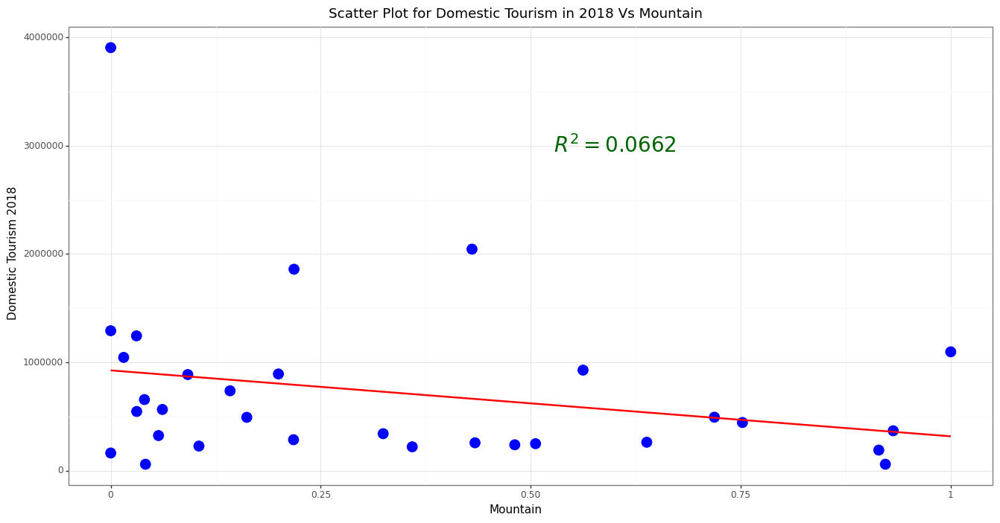

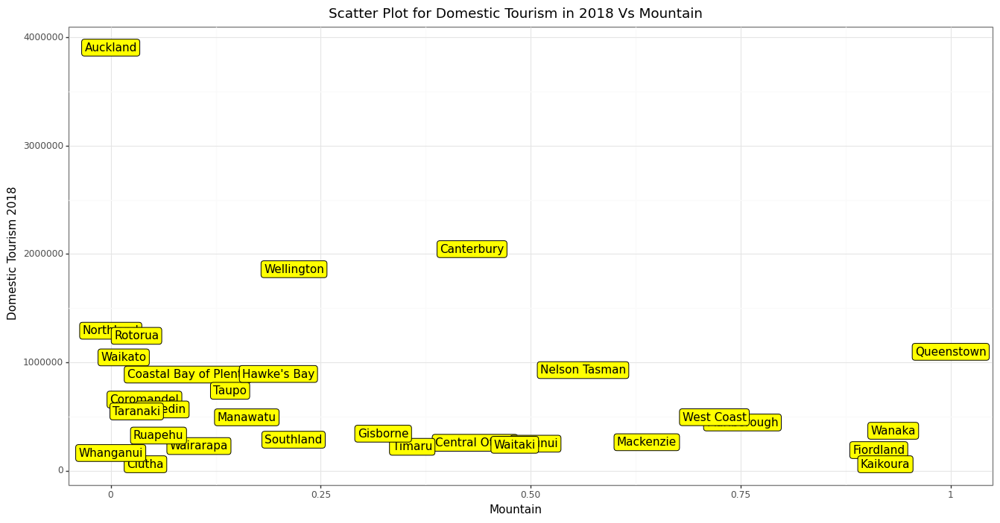

<IPython.core.display.Math object>

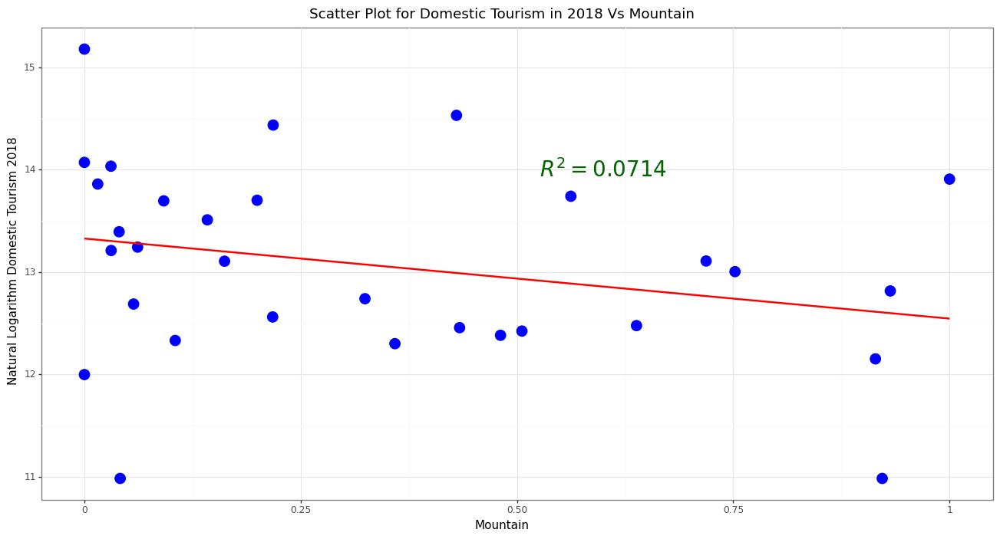

In [8]:
x = X.iloc[:, 0].values.reshape(-1, 1)
Model1 = regr.fit(x, y1)
preds = Model1.predict(x)
R2 = r2_score(y1, preds).round(4)
display(Math(r'R^2_{{Model}} = {}'.format(R2)))
P1 = (ggplot(dat1, aes(x = 'Mountain', y = "y1")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Mountain", 
y = 'Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 , y = 3000000, label = r"$R^2 = 0.0662$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P1)

## create label plot

P = (ggplot(dat1, aes(x = 'Mountain', y = "y1")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Mountain", 
y = 'Domestic Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)
#### get logarithm of y


Model2 = regr.fit(x, y1_log)
preds2 = Model2.predict(x)
R22 = r2_score(y1_log, preds2).round(4)
R22
display(Math(r'R^2_{{Model}} = {}'.format(R22)))

P2 = (ggplot(dat1, aes(x = 'Mountain', y = "y1_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Mountain", 
y = 'Natural Logarithm Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14, label = r"$R^2 = 0.0714$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))
print(P2)

<br><br> 
<hr><hr>
<br><br>

#### For DistnceToCity

<IPython.core.display.Math object>

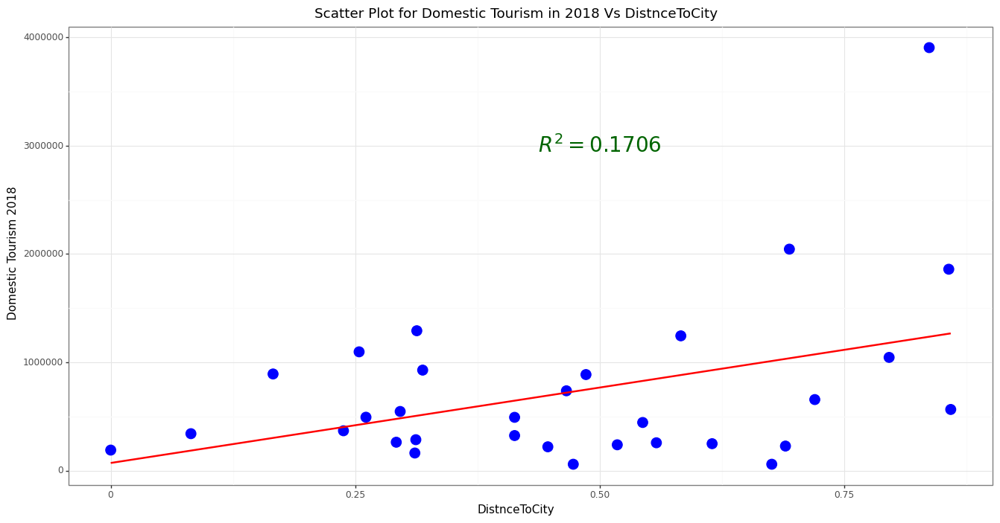

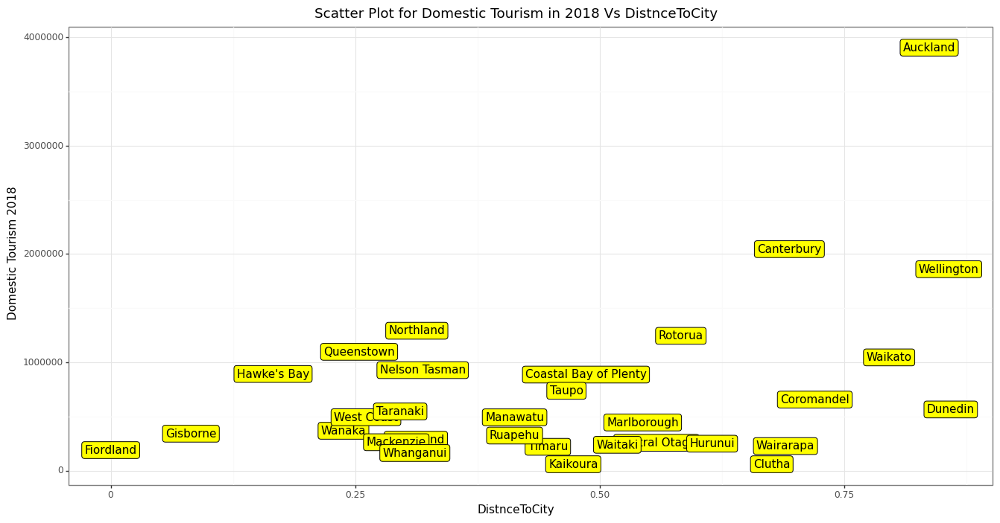

<IPython.core.display.Math object>

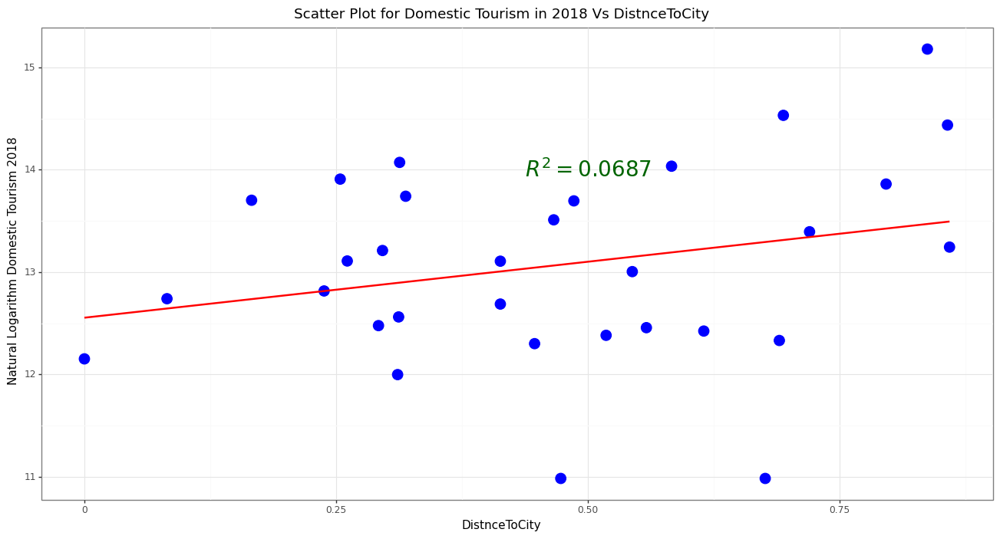

In [9]:
x1 = X.iloc[:, 1].values.reshape(-1, 1)
Model2 = regr.fit(x1, y1)
preds21 = Model2.predict(x1)
R2 = r2_score(y1, preds21).round(4)
R2
display(Math(r'R^2_{{Model}} = {}'.format(R2)))


P1 = (ggplot(dat1, aes(x = 'DistnceToCity', y = "y1")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs DistnceToCity", 
y = 'Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.5 , y = 3000000, label = r"$R^2 = 0.1706$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P1)

## create label plot

P = (ggplot(dat1, aes(x = 'DistnceToCity', y = "y1")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs DistnceToCity", 
y = 'Domestic Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)
#### get logarithm of y


Model22 = regr.fit(x1, y1_log)
preds22 = Model2.predict(x1)
R222 = r2_score(y1_log, preds22).round(4)
R222
display(Math(r'R^2_{{Model}} = {}'.format(R222)))
P2 = (ggplot(dat1, aes(x = 'DistnceToCity', y = "y1_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs DistnceToCity", 
y = 'Natural Logarithm Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.5 , y = 14, label = r"$R^2 = 0.0687$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))
print(P2)

<br><br>
<hr><hr>

#### for Accessibility

<IPython.core.display.Math object>

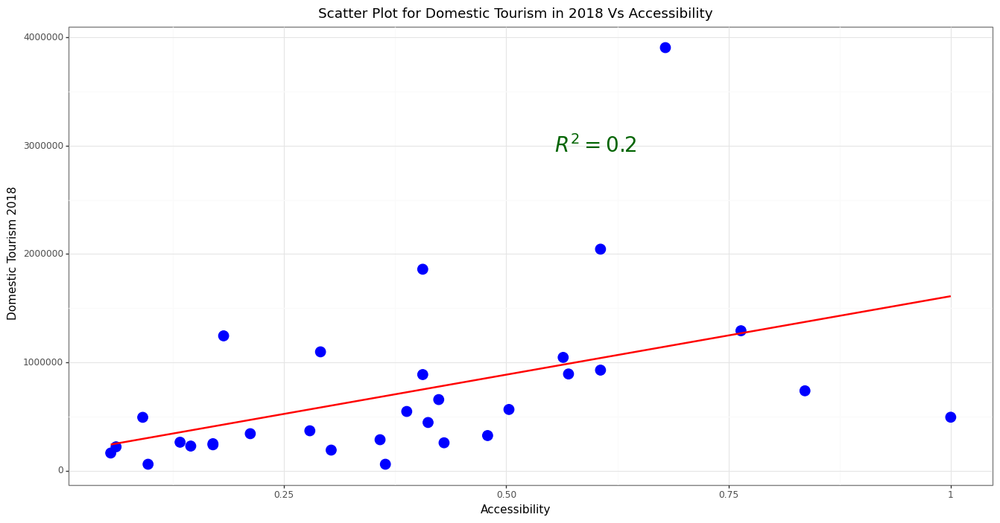

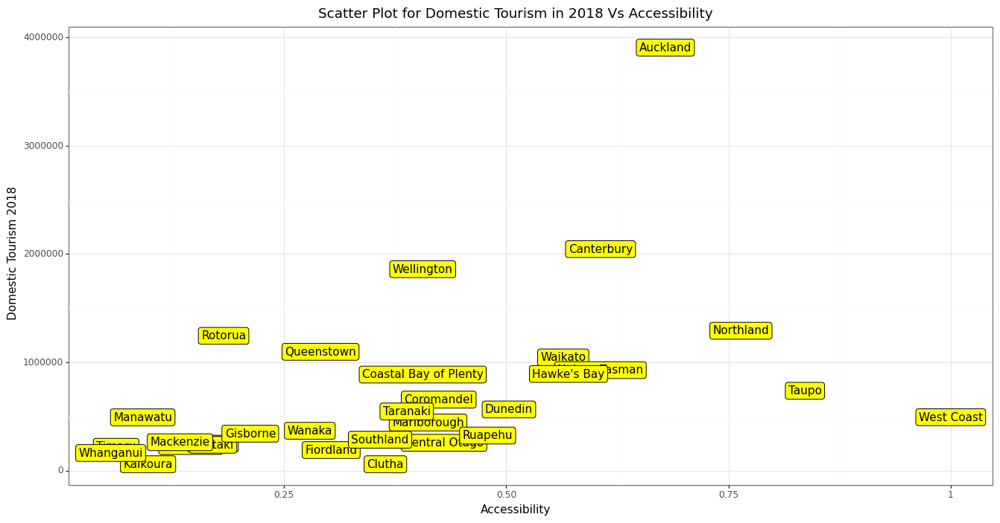

<IPython.core.display.Math object>

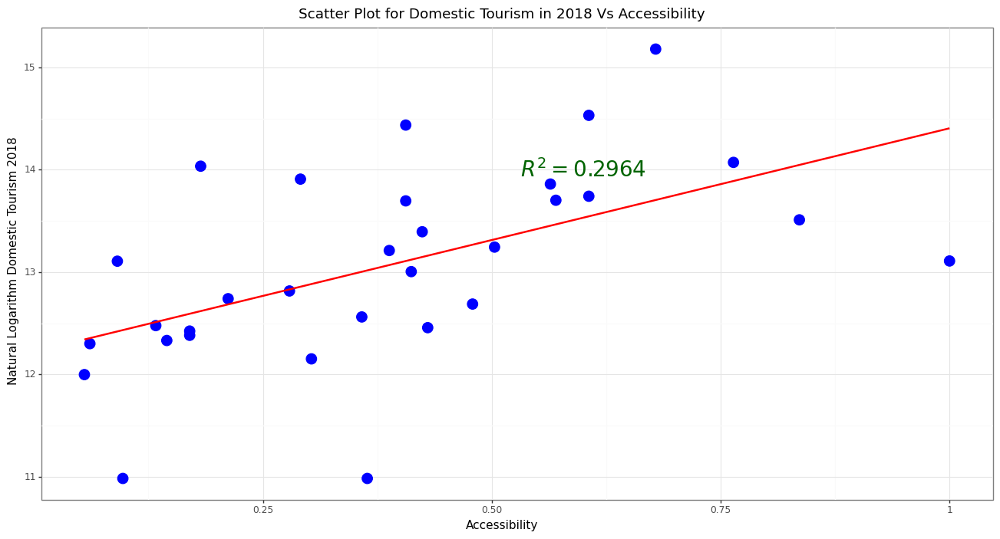

In [10]:
x2 = X.iloc[:, 2].values.reshape(-1, 1)
Model3 = regr.fit(x2, y1)
preds31 = Model3.predict(x2)
R231 = r2_score(y1, preds31).round(4)
R231
display(Math(r'R^2_{{Model}} = {}'.format(R231)))
P1 = (ggplot(dat1, aes(x = 'Accessibility', y = "y1")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Accessibility", 
y = 'Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 , y = 3000000, label = r"$R^2 = 0.2$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P1)

## create label plot

P = (ggplot(dat1, aes(x = 'Accessibility', y = "y1")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Accessibility", 
y = 'Domestic Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)
#### get logarithm of y


Model32 = regr.fit(x2, y1_log)
preds32 = Model32.predict(x2)
R232 = r2_score(y1_log, preds32).round(4)
R232
display(Math(r'R^2_{{Model}} = {}'.format(R232)))

P2 = (ggplot(dat1, aes(x = 'Accessibility', y = "y1_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Accessibility", 
y = 'Natural Logarithm Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14, label = r"$R^2 = 0.2964$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))
print(P2)

<hr><hr>
<br><br>

#### For IndigenousForest

<IPython.core.display.Math object>

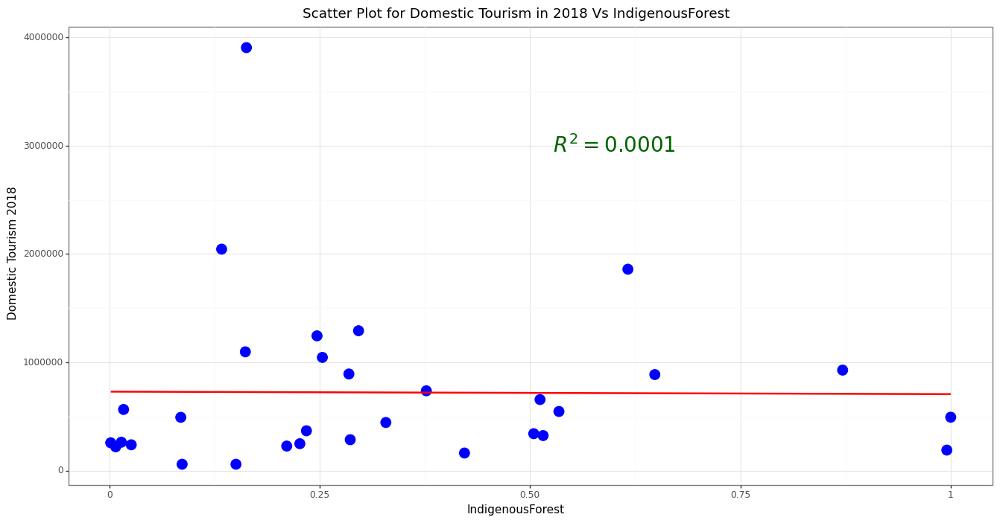

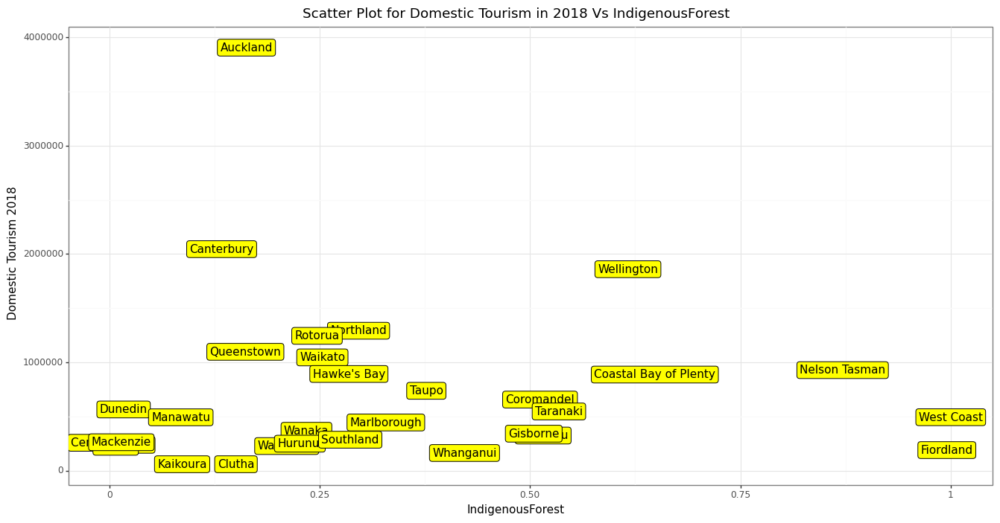

<IPython.core.display.Math object>

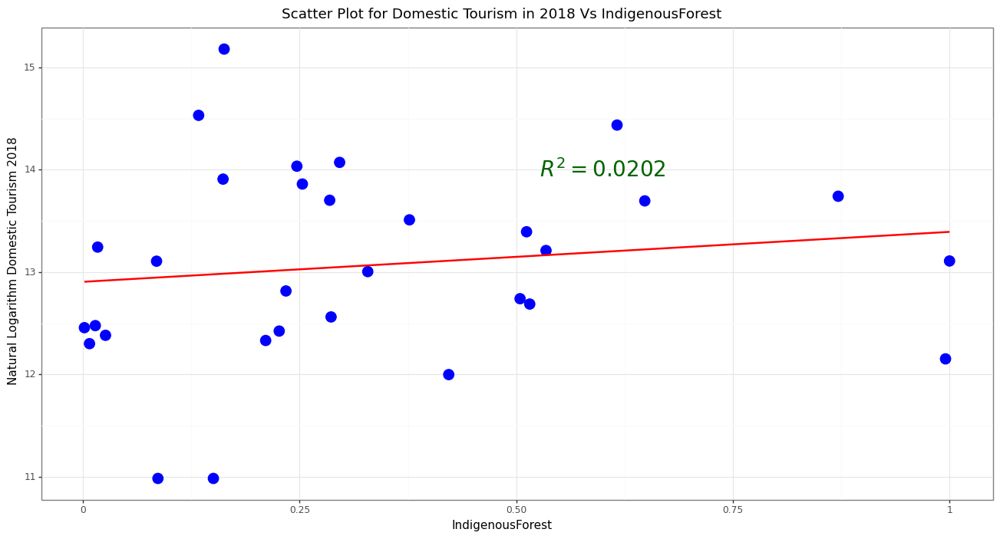

In [11]:
x3 = X.iloc[:, 3].values.reshape(-1, 1)
Model41 = regr.fit(x3, y1)
preds41 = Model41.predict(x3)
R241 = r2_score(y1, preds41).round(4)
R241
display(Math(r'R^2_{{Model}} = {}'.format(R241)))
P1 = (ggplot(dat1, aes(x = 'IndigenousForest', y = "y1")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs IndigenousForest", 
y = 'Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 3000000, label = r"$R^2 = 0.0001$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P1)

## create label plot

P = (ggplot(dat1, aes(x = 'IndigenousForest', y = "y1")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs IndigenousForest", 
y = 'Domestic Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)    
#### get logarithm of y


Model42 = regr.fit(x3, y1_log)
preds42 = Model32.predict(x3)
R242 = r2_score(y1_log, preds42).round(4)
R242
display(Math(r'R^2_{{Model}} = {}'.format(R242)))
P2 = (ggplot(dat1, aes(x = 'IndigenousForest', y = "y1_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs IndigenousForest", 
y = 'Natural Logarithm Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14, label = r"$R^2 = 0.0202$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<hr><hr>
<br><br>


#### For WaterBodies

<IPython.core.display.Math object>

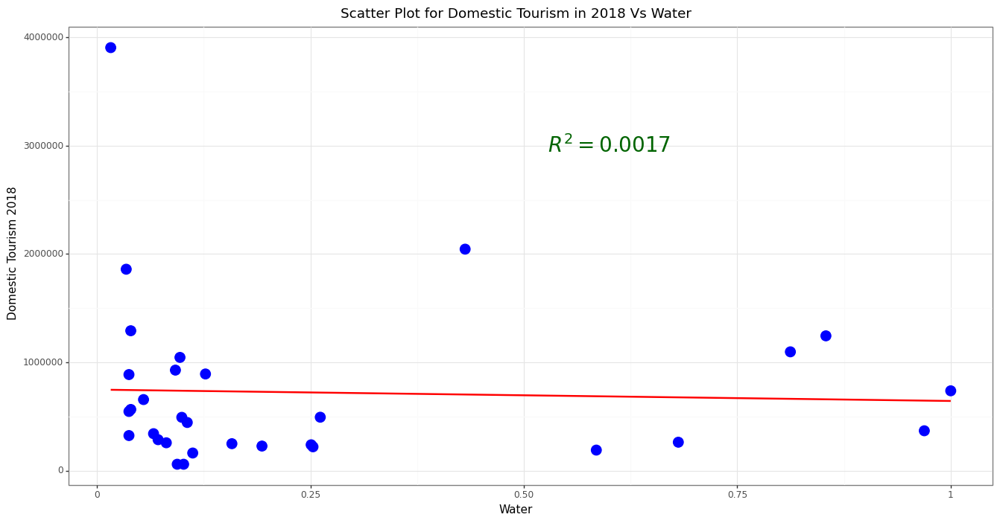

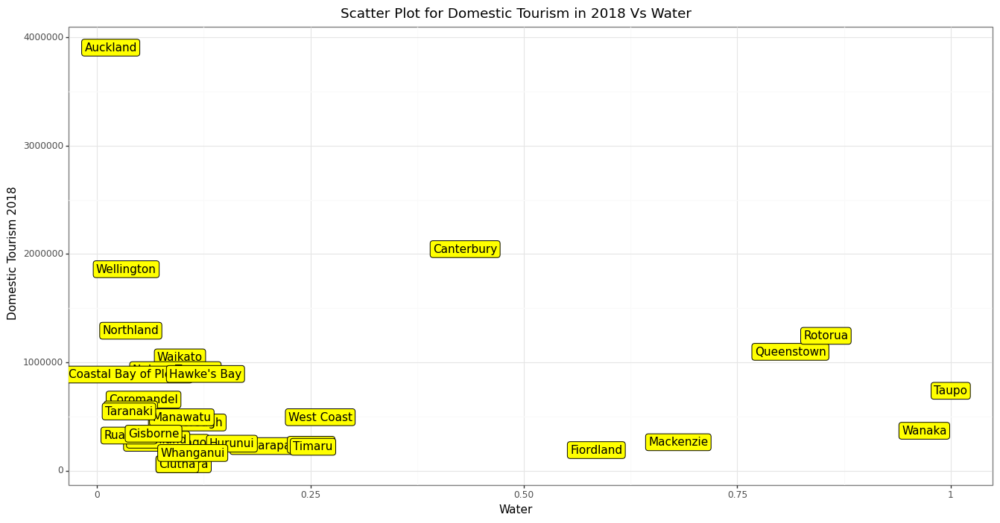

<IPython.core.display.Math object>

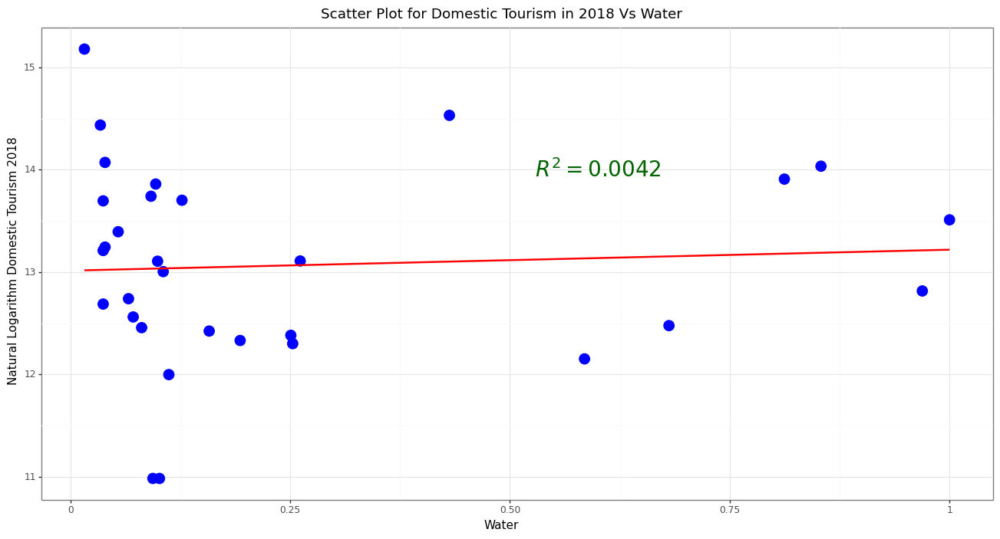

In [12]:
x4 = X.iloc[:, 4].values.reshape(-1, 1)
Model51 = regr.fit(x4, y1)
preds51 = Model51.predict(x4)
R251 = r2_score(y1, preds51).round(4)
R251
display(Math(r'R^2_{{Model}} = {}'.format(R251)))
P1 = (ggplot(dat1, aes(x = 'Water', y = "y1")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Water", 
y = 'Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 3000000, label = r"$R^2 = 0.0017$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P1)


## create label plot

P = (ggplot(dat1, aes(x = 'Water', y = "y1")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Water", 
y = 'Domestic Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)
#### get logarithm of y


Model52 = regr.fit(x4, y1_log)
preds52 = Model52.predict(x4)
R252 = r2_score(y1_log, preds52).round(4)
R252
display(Math(r'R^2_{{Model}} = {}'.format(R252)))

P2 = (ggplot(dat1, aes(x = 'Water', y = "y1_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Water", 
y = 'Natural Logarithm Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14, label = r"$R^2 = 0.0042$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr>

<br><br> 
#### For ExoticForest

<IPython.core.display.Math object>

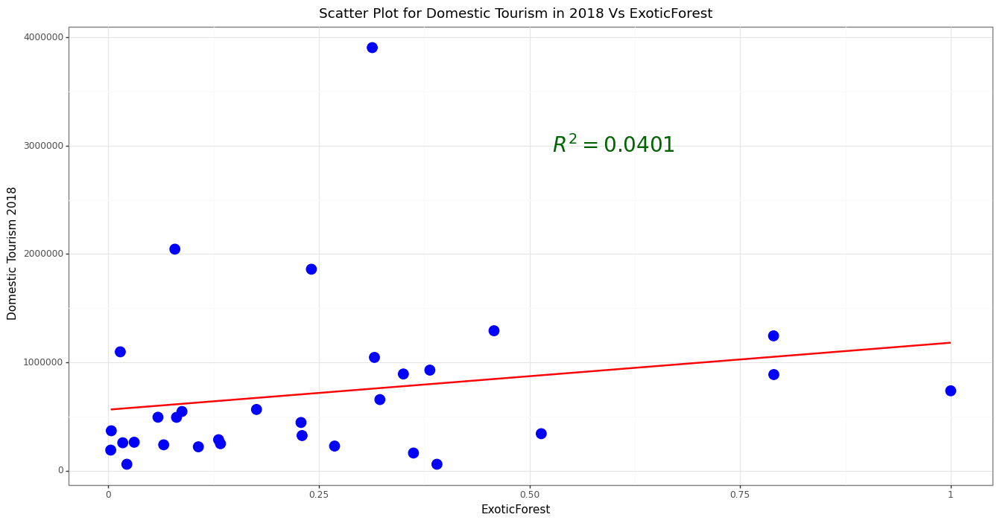

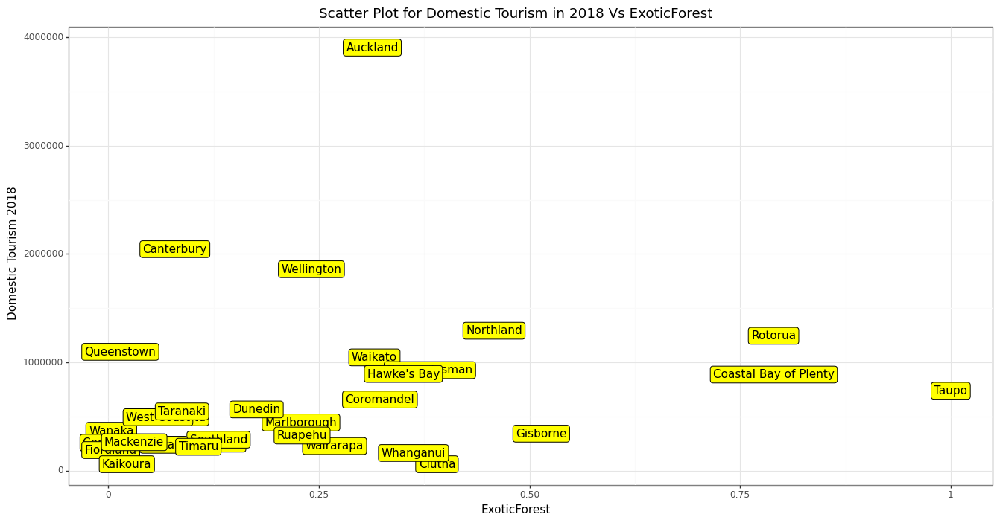

<IPython.core.display.Math object>

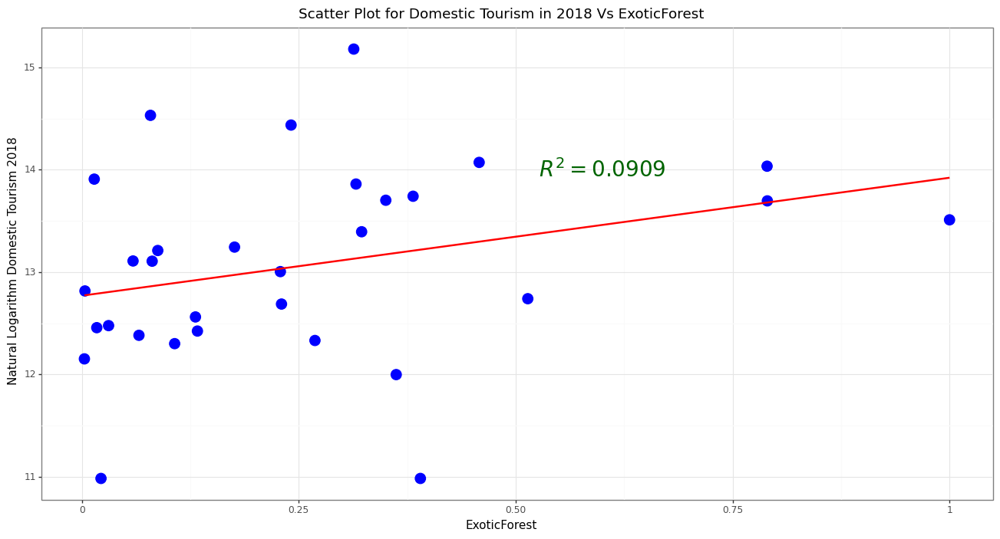

In [13]:
x5 = X.iloc[:, 5].values.reshape(-1, 1)
Model61 = regr.fit(x5, y1)
preds61 = Model61.predict(x5)
R261 = r2_score(y1, preds61).round(4)
R261
display(Math(r'R^2_{{Model}} = {}'.format(R261)))
P1 = (ggplot(dat1, aes(x = 'ExoticForest', y = "y1")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs ExoticForest", 
y = 'Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 3000000, label = r"$R^2 = 0.0401$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P1)
## create label plot


P = (ggplot(dat1, aes(x = 'ExoticForest', y = "y1")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs ExoticForest", 
y = 'Domestic Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)
#### get logarithm of y


Model62 = regr.fit(x5, y1_log)
preds62 = Model62.predict(x5)
R262 = r2_score(y1_log, preds62).round(4)
R262
display(Math(r'R^2_{{Model}} = {}'.format(R262)))
P2 = (ggplot(dat1, aes(x = 'ExoticForest', y = "y1_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs ExoticForest", 
y = 'Natural Logarithm Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14, label = r"$R^2 = 0.0909$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))
print(P2)

<br><br>
<hr><hr>

#### For CoastView

<IPython.core.display.Math object>

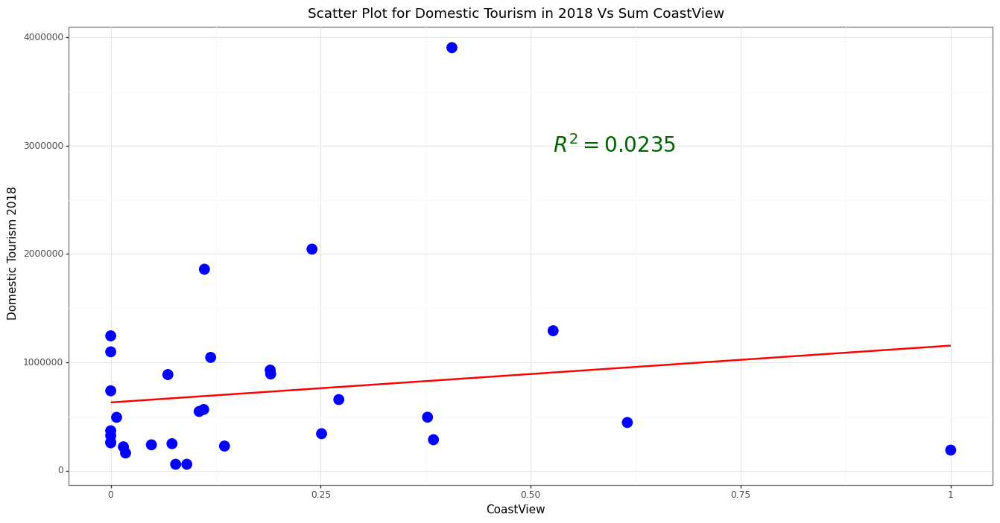

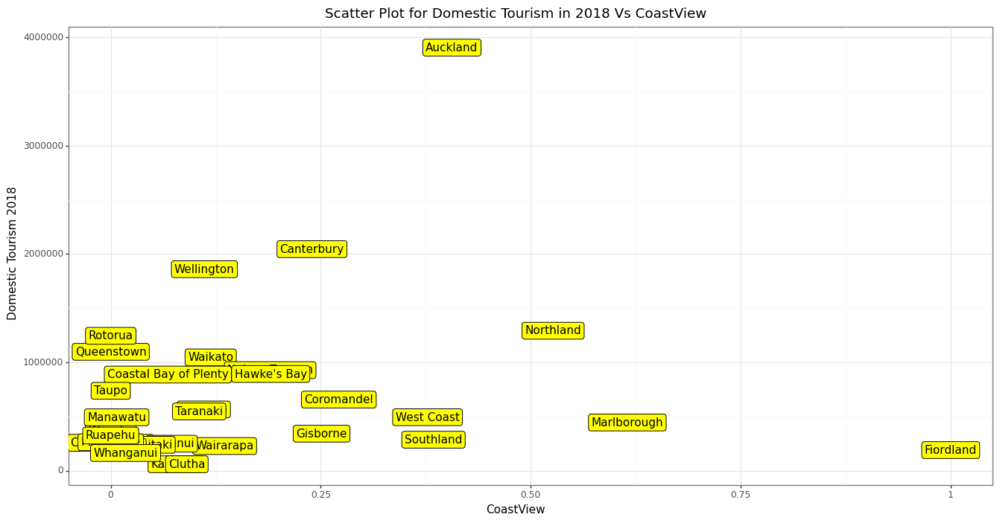

<IPython.core.display.Math object>

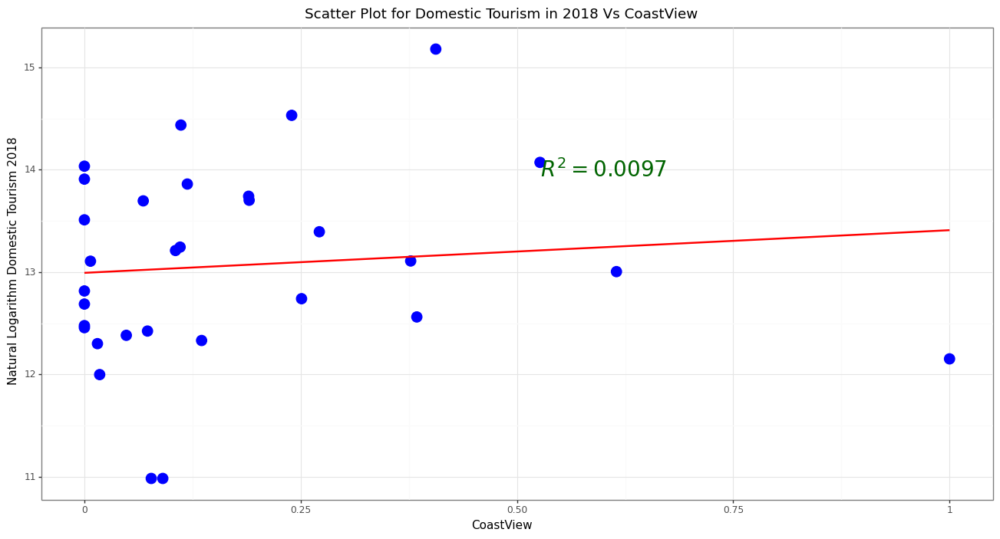

In [14]:
x6 = X.iloc[:, 6].values.reshape(-1, 1)
Model71 = regr.fit(x6, y1)
preds71 = Model71.predict(x6)
R271 = r2_score(y1, preds71).round(4)
R271
display(Math(r'R^2_{{Model}} = {}'.format(R271)))
P1 = (ggplot(dat1, aes(x = 'CoastView', y = "y1")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Sum CoastView", 
y = 'Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 3000000, label = r"$R^2 = 0.0235$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P1)
## create label plot


P = (ggplot(dat1, aes(x = 'CoastView', y = "y1")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs CoastView", 
y = 'Domestic Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)
#### get logarithm of y


Model72 = regr.fit(x6, y1_log)
preds72 = Model72.predict(x6)
R272 = r2_score(y1_log, preds72).round(4)
R272
display(Math(r'R^2_{{Model}} = {}'.format(R272)))
P2 = (ggplot(dat1, aes(x = 'CoastView', y = "y1_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs CoastView", 
y = 'Natural Logarithm Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14 , label = r"$R^2 = 0.0097$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))
print(P2)

<br><br>
<hr><hr>
<br><br>

#### For DistanceToAirport

<IPython.core.display.Math object>

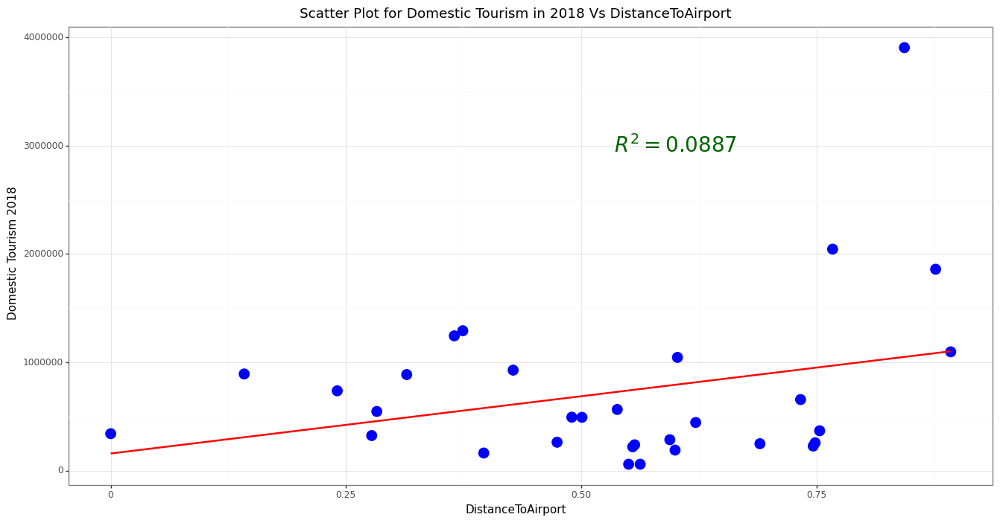

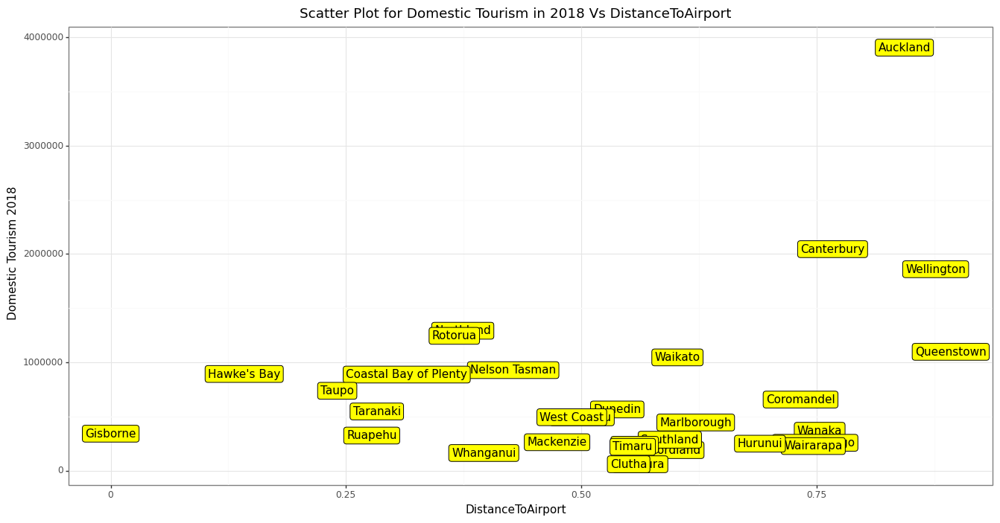

<IPython.core.display.Math object>

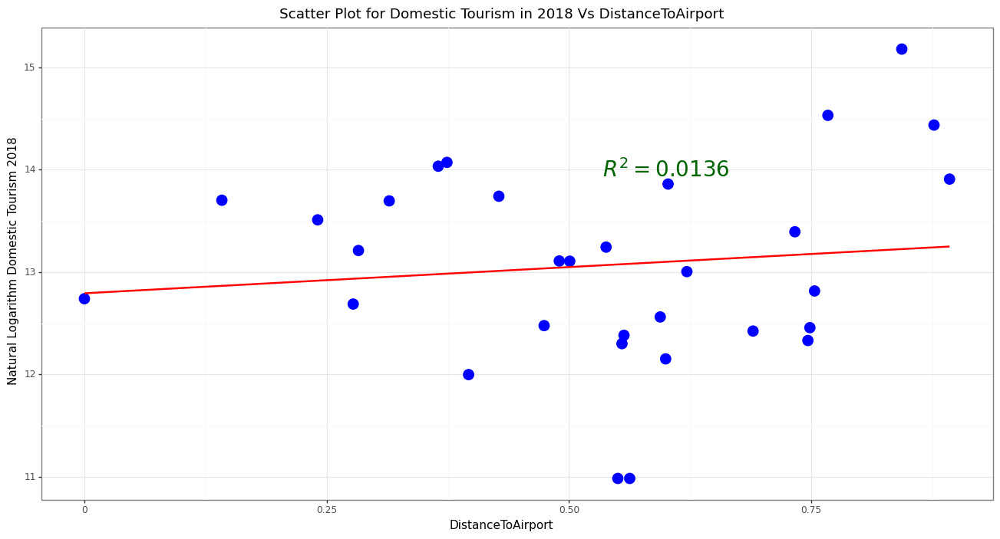

In [15]:
x7 = X.iloc[:, 7].values.reshape(-1, 1)
Model81 = regr.fit(x7, y1)
preds81 = Model81.predict(x7)
R281 = r2_score(y1, preds81).round(4)
R281
display(Math(r'R^2_{{Model}} = {}'.format(R281)))
P1 = (ggplot(dat1, aes(x = 'DistanceToAirport', y = "y1")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs DistanceToAirport", 
y = 'Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 3000000, label = r"$R^2 = 0.0887$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P1)

## create label plot


P = (ggplot(dat1, aes(x = 'DistanceToAirport', y = "y1")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs DistanceToAirport", 
y = 'Domestic Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)
#### get logarithm of y


Model82 = regr.fit(x7, y1_log)
preds82 = Model82.predict(x7)
R282 = r2_score(y1_log, preds82).round(4)
R282
display(Math(r'R^2_{{Model}} = {}'.format(R282)))

P2 = (ggplot(dat1, aes(x = 'DistanceToAirport', y = "y1_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs DistanceToAirport", 
y = 'Natural Logarithm Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14, label = r"$R^2 = 0.0136$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br>
<hr><hr>
<br><br>

#### For Wetland

<IPython.core.display.Math object>

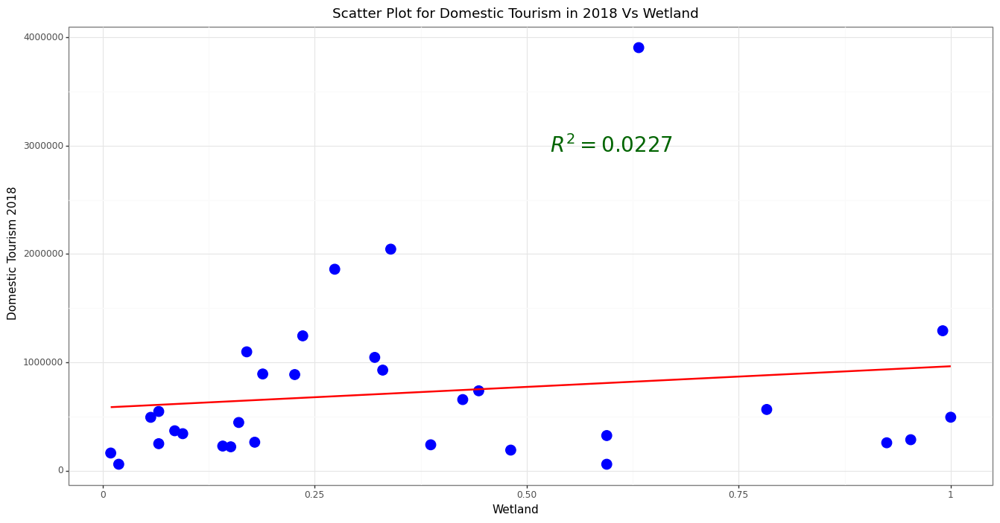

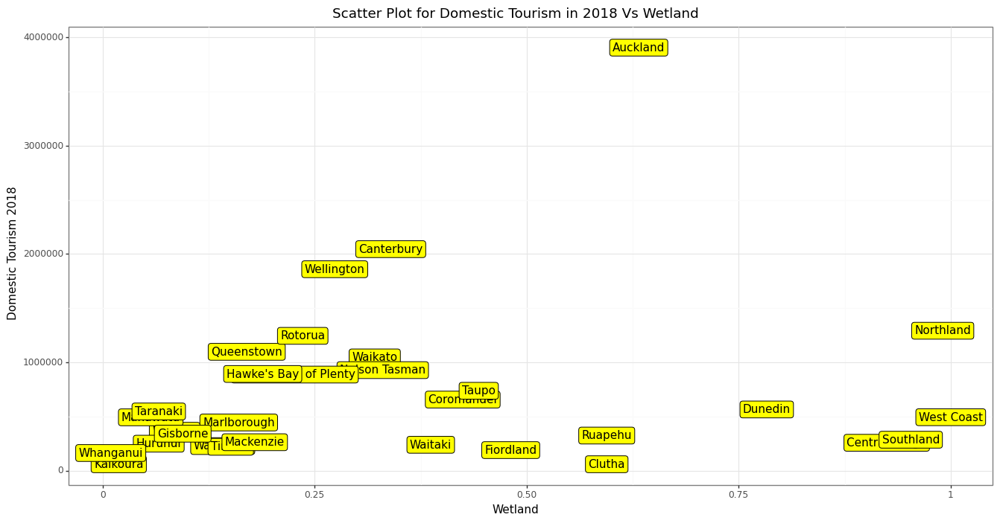

<IPython.core.display.Math object>

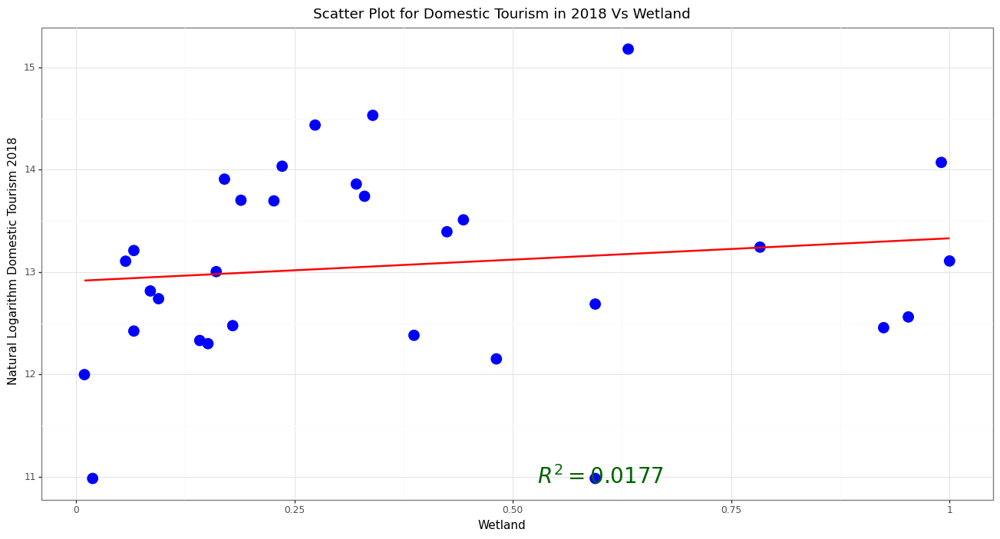

In [16]:
x8 = X.iloc[:, 8].values.reshape(-1, 1)
Model91 = regr.fit(x8, y1)
preds91 = Model91.predict(x8)
R291 = r2_score(y1, preds91).round(4)
R291
display(Math(r'R^2_{{Model}} = {}'.format(R291)))

P1 = (ggplot(dat1, aes(x = 'Wetland', y = "y1")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Wetland", 
y = 'Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 3000000, label = r"$R^2 = 0.0227$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8))) 

print(P1)
## create label plot


P = (ggplot(dat1, aes(x = 'Wetland', y = "y1")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Wetland", 
y = 'Domestic Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)
#### get logarithm of y


Model92 = regr.fit(x8, y1_log)
preds92 = Model82.predict(x8)
R292 = r2_score(y1_log, preds92).round(4)
R292
display(Math(r'R^2_{{Model}} = {}'.format(R292)))

P2 = (ggplot(dat1, aes(x = 'Wetland', y = "y1_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Wetland", 
y = 'Natural Logarithm Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 11, label = r"$R^2 = 0.0177$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))
print(P2)

<br><br>
<hr><hr>
<br><br>

#### For ProtectedAreas



<IPython.core.display.Math object>

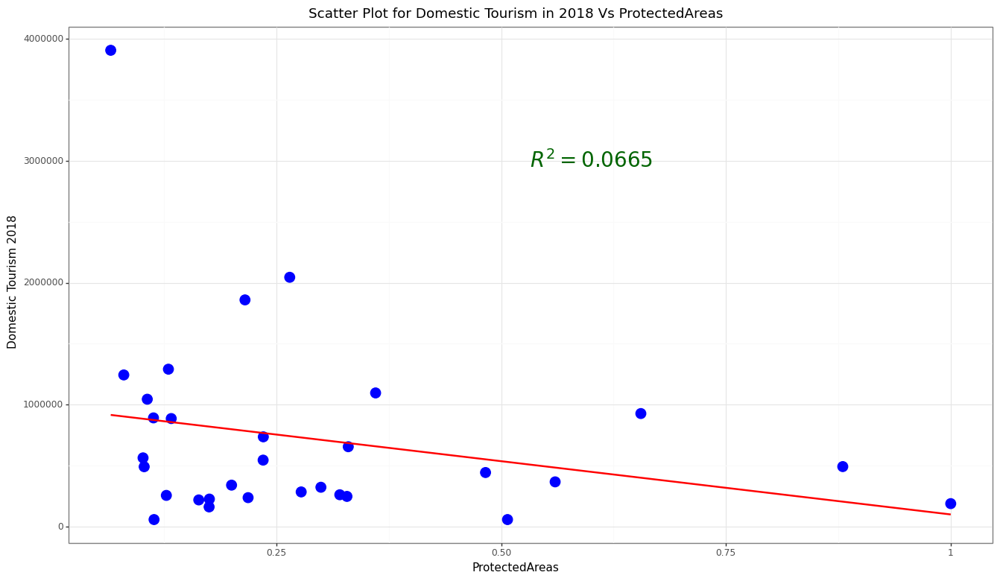

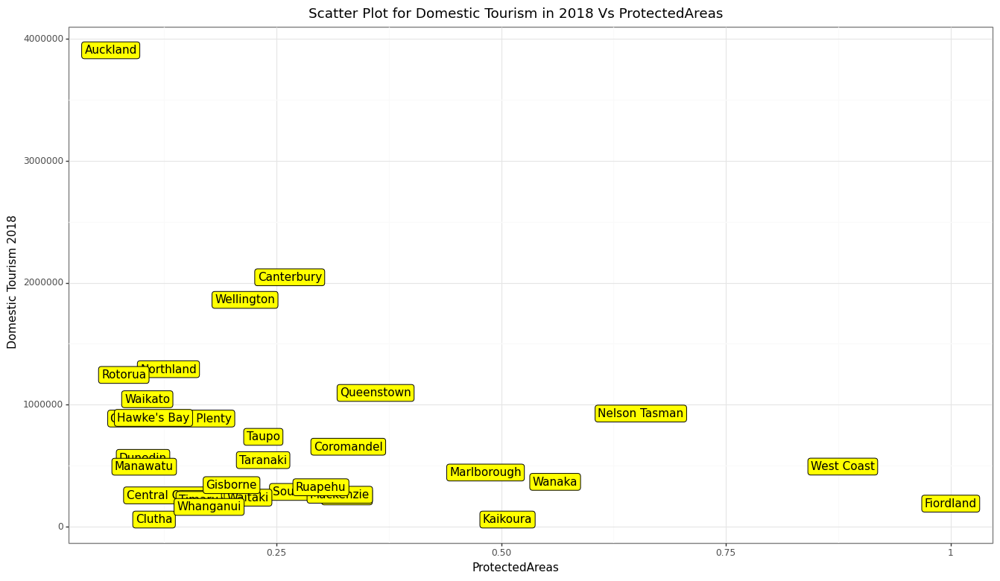

<IPython.core.display.Math object>

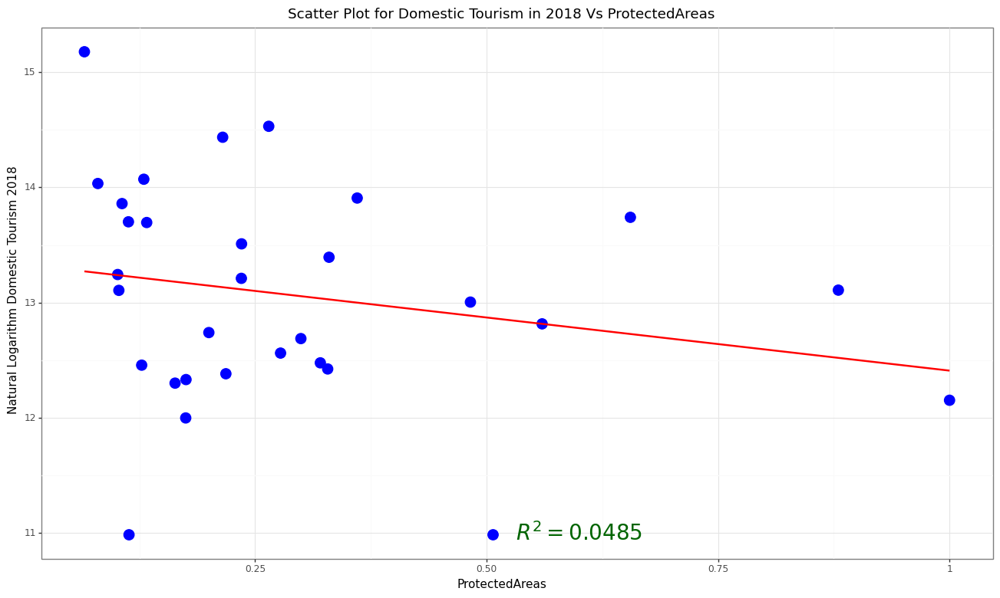

In [17]:
x9 = X.iloc[:, 9].values.reshape(-1, 1)
Model91 = regr.fit(x9, y1)
preds91 = Model91.predict(x9)
R291 = r2_score(y1, preds91).round(4)
R291
display(Math(r'R^2_{{Model}} = {}'.format(R291)))

P1 = (ggplot(dat1, aes(x = 'ProtectedAreas', y = "y1")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs ProtectedAreas", 
y = 'Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 3000000, label = r"$R^2 = 0.0665$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 9)))

print(P1)
## create label plot


P = (ggplot(dat1, aes(x = 'ProtectedAreas', y = "y1")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs ProtectedAreas", 
y = 'Domestic Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 9)))

print(P)
#### get logarithm of y


Model92 = regr.fit(x9, y1_log)
preds92 = Model92.predict(x9)
R292 = r2_score(y1_log, preds92).round(4)
R292
display(Math(r'R^2_{{Model}} = {}'.format(R292)))


P2 = (ggplot(dat1, aes(x = 'ProtectedAreas', y = "y1_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs ProtectedAreas", 
y = 'Natural Logarithm Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 11, label = r"$R^2 = 0.0485$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 9)))

print(P2)

<br><br>
<hr><hr>
<br><br>

#### For Grassland

<IPython.core.display.Math object>

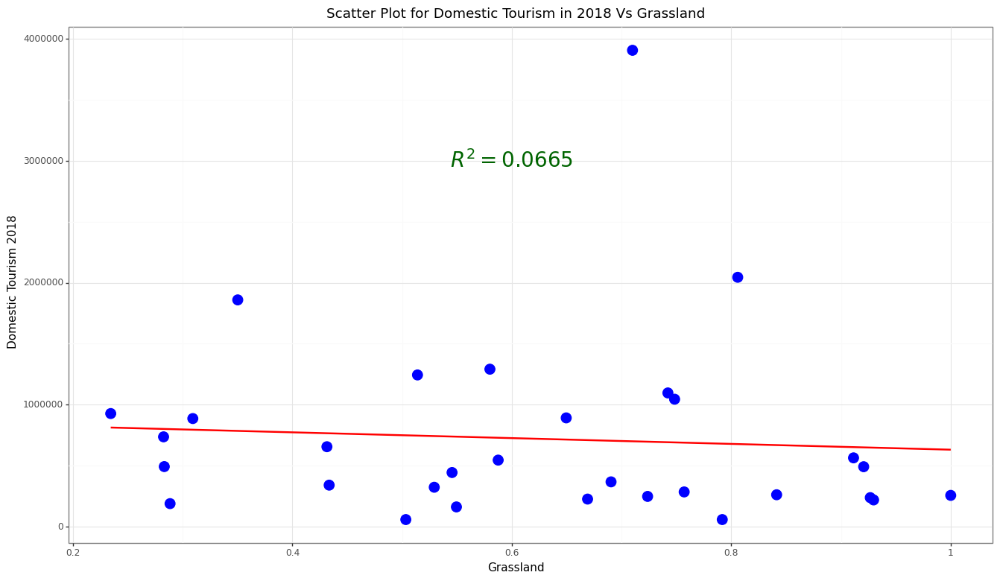

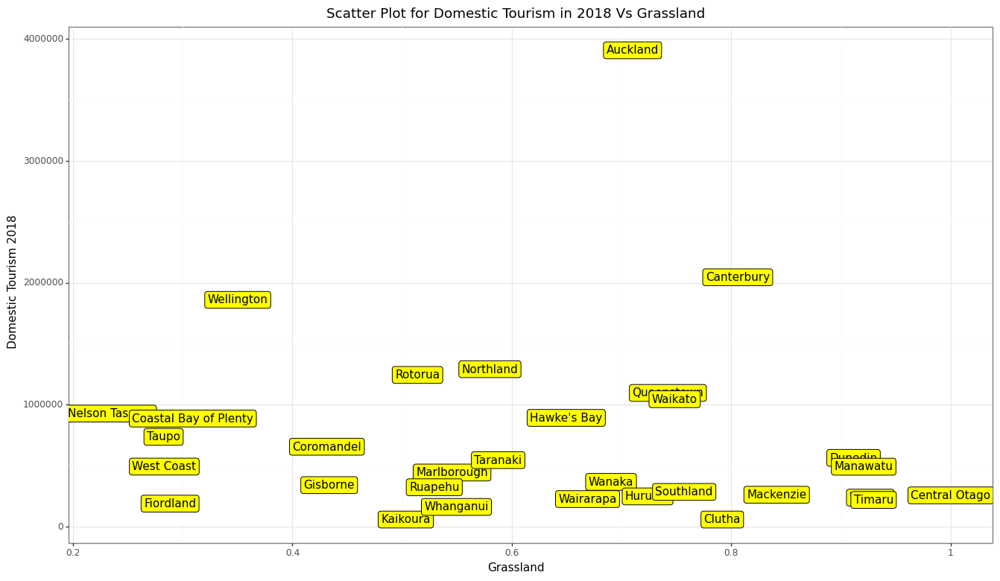

<IPython.core.display.Math object>

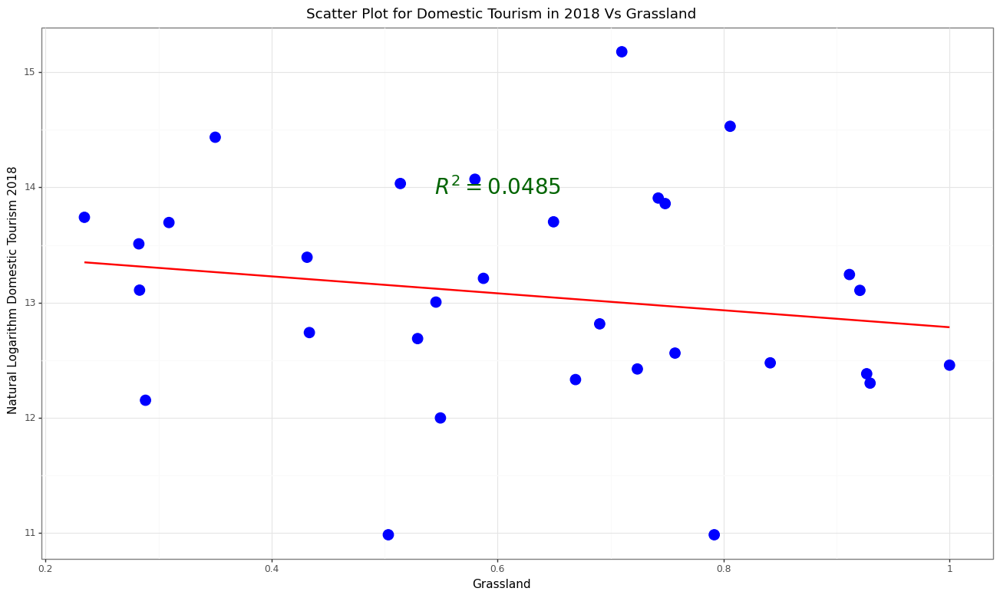

In [18]:
xx9 = X.iloc[:, 9].values.reshape(-1, 1)
Model91 = regr.fit(xx9, y1)
preds91 = Model91.predict(xx9)
R291 = r2_score(y1, preds91).round(4)
R291
display(Math(r'R^2_{{Model}} = {}'.format(R291)))

P1 = (ggplot(dat1, aes(x = 'Grassland', y = "y1")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Grassland", 
y = 'Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 3000000, label = r"$R^2 = 0.0665$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 9)))

print(P1)
## create label plot


P = (ggplot(dat1, aes(x = 'Grassland', y = "y1")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Grassland", 
y = 'Domestic Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 9)))

print(P)
#### get logarithm of y


Model92 = regr.fit(xx9, y1_log)
preds92 = Model92.predict(xx9)
R292 = r2_score(y1_log, preds92).round(4)
R292
display(Math(r'R^2_{{Model}} = {}'.format(R292)))


P2 = (ggplot(dat1, aes(x = 'Grassland', y = "y1_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2018 Vs Grassland", 
y = 'Natural Logarithm Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14 , label = r"$R^2 = 0.0485$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 9)))

print(P2)

<br><br>
<hr><hr>
<br><br>


#### Define a Model With all variables

In [19]:
## without scaling
X2 = sm.add_constant(X)

model = sm.OLS(y1, X2).fit()

print_model = model.summary()
print(print_model)

## with scaling
# xx = scaler.fit_transform(X)

# xx2 = sm.add_constant(xx)

# model2 = sm.OLS(y1, xx2).fit()
# print_model2 = model2.summary()
# print(print_model2)

############################### y ---> log(y)

## with scaling

model3 = sm.OLS(y1_log, X2).fit()
print_model3 = model3.summary()
print(print_model3)

                            OLS Regression Results                            
Dep. Variable:            Domestic-18   R-squared:                       0.678
Model:                            OLS   Adj. R-squared:                  0.491
Method:                 Least Squares   F-statistic:                     3.636
Date:                Sat, 08 Jul 2023   Prob (F-statistic):            0.00668
Time:                        10:51:24   Log-Likelihood:                -446.14
No. Observations:                  31   AIC:                             916.3
Df Residuals:                      19   BIC:                             933.5
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const              1.471e+06   1.74e+0

<br><br>
<hr><hr>
<br><br>


#### Get Correlation Matrix Between Variables

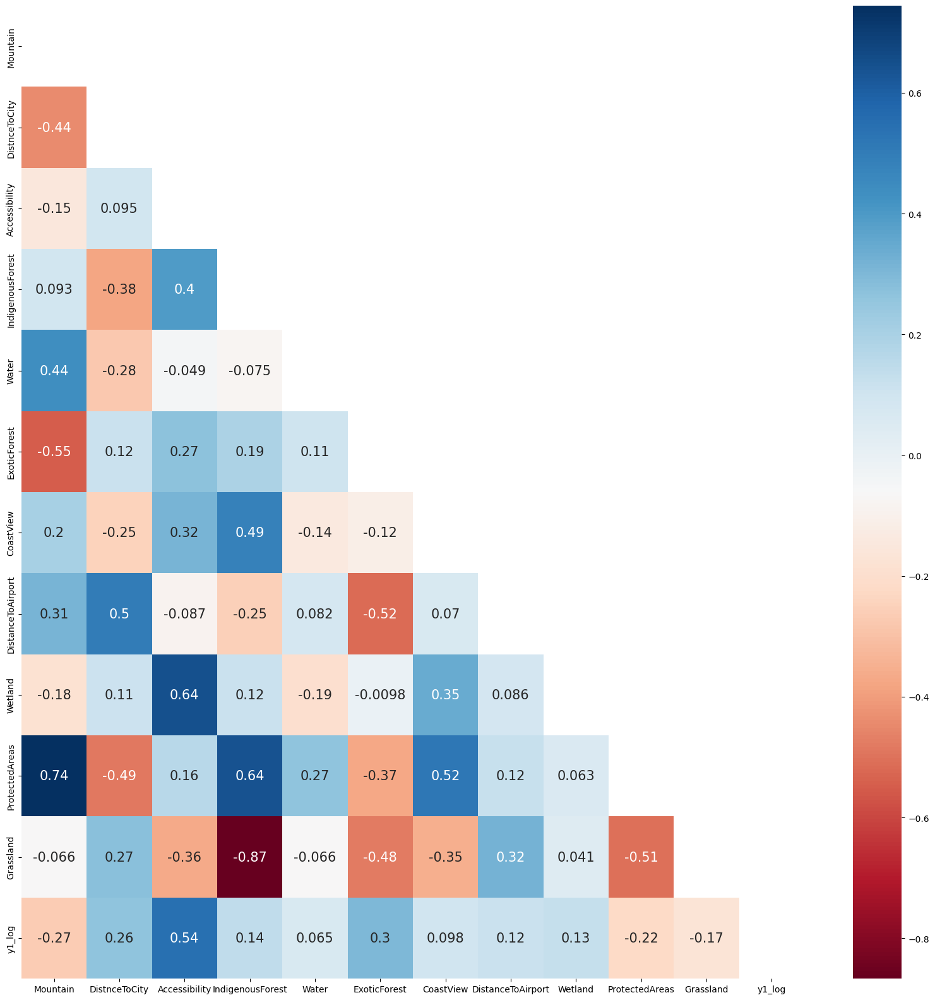

<Figure size 2000x2000 with 0 Axes>

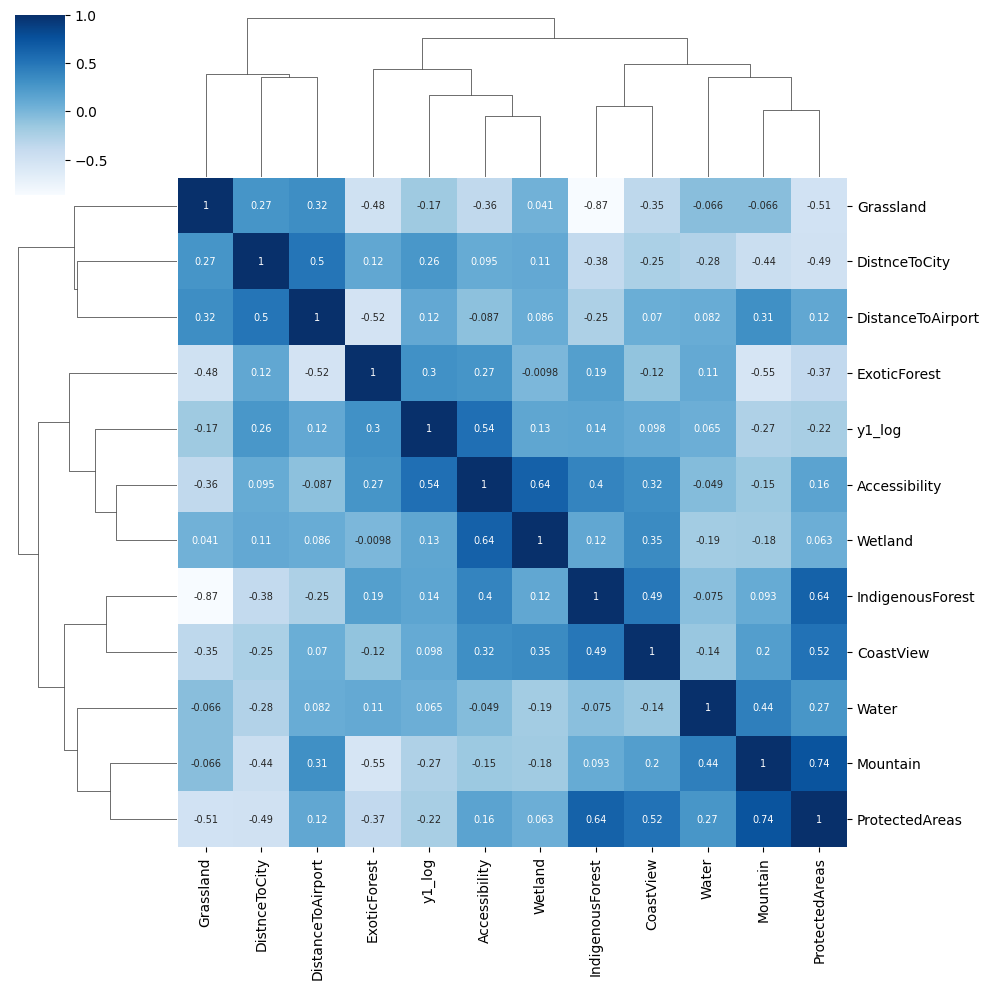

In [20]:
dat1_corr = dat1.drop(['y1', 'RTO_Names'], axis = 1)
dat1_corr.columns
dat1_corrr = dat1_corr.corr()


matrix = np.triu(dat1_corrr)
plt.figure(figsize=(20, 20), facecolor='w', edgecolor='k')
sns.heatmap(dat1_corrr, annot = True, annot_kws = {"size" : 15}, mask = matrix , cmap="RdBu")
plt.show()



plt.figure(figsize=(20, 20), facecolor='w', edgecolor='k')
cmap = sns.diverging_palette(h_neg=210, h_pos=350, s=90, l=30, as_cmap=True)

sns.clustermap(data = dat1_corrr, annot = True, cmap = "Blues", 
annot_kws={"size": 7})
plt.show()

In [21]:
X_new = X2.drop(['Grassland', 'DistanceToAirport' ], axis = 1)

temp1 = X_new.columns
temp1
# xx = scaler.fit_transform(X_new)
# xx = pd.DataFrame(xx, columns = temp1, index = dat_org.index)
model = sm.OLS(y1, X_new).fit()

print_model = model.summary()
print(print_model)

############################### y ---> log(y)

## with scaling

model3 = sm.OLS(y1_log, X_new).fit()
print_model3 = model3.summary()
print(print_model3)

                            OLS Regression Results                            
Dep. Variable:            Domestic-18   R-squared:                       0.627
Model:                            OLS   Adj. R-squared:                  0.467
Method:                 Least Squares   F-statistic:                     3.925
Date:                Sat, 08 Jul 2023   Prob (F-statistic):            0.00470
Time:                        10:51:25   Log-Likelihood:                -448.41
No. Observations:                  31   AIC:                             916.8
Df Residuals:                      21   BIC:                             931.2
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const            -3.154e+05   4.72e+05  

<br><br>
<hr><hr><hr><hr>
<br><br><br><br>


## Domestic Tourism 2021

#### define data for Domestic Tourism in 2021

In [22]:
y2 = dat_org['Domestic_21']
y2_log = np.log(y2)
dat2 = pd.concat([y2, X], axis = 1, join = "outer")
dat2.index = dat_org['RTO_Name']
dat2.columns =  ['y2', 'Mountain', 
'DistnceToCity', 'Accessibility', 
'IndigenousForest',  'Water', 
'ExoticForest',  'CoastView', 'DistanceToAirport', 'Wetland', 'ProtectedAreas', 'Grassland']
dat2['RTO_Names']= dat_org['RTO_Name'].values
dat2['y2_log'] = y2_log.values
dat2
dat2.columns

Index(['y2', 'Mountain', 'DistnceToCity', 'Accessibility', 'IndigenousForest',
       'Water', 'ExoticForest', 'CoastView', 'DistanceToAirport', 'Wetland',
       'ProtectedAreas', 'Grassland', 'RTO_Names', 'y2_log'],
      dtype='object')

#### For Mountain

<IPython.core.display.Math object>

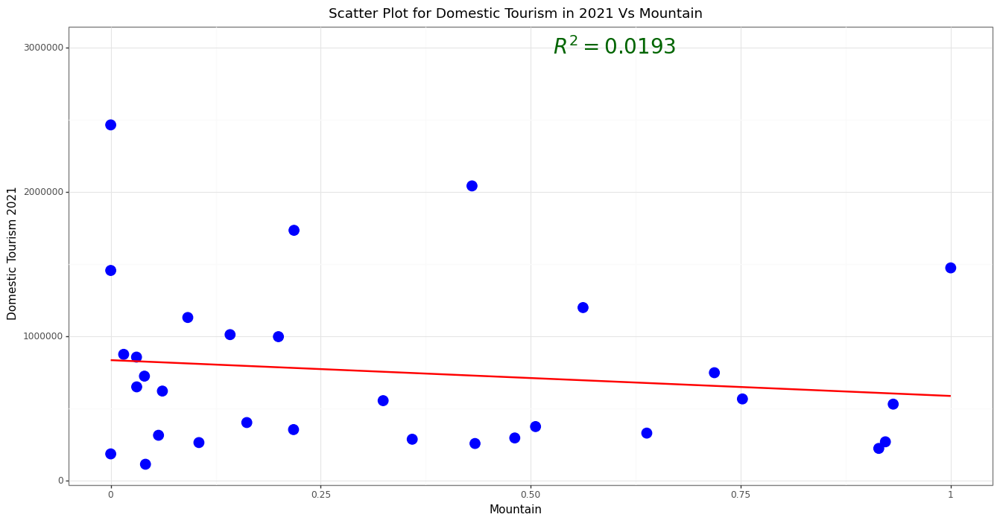

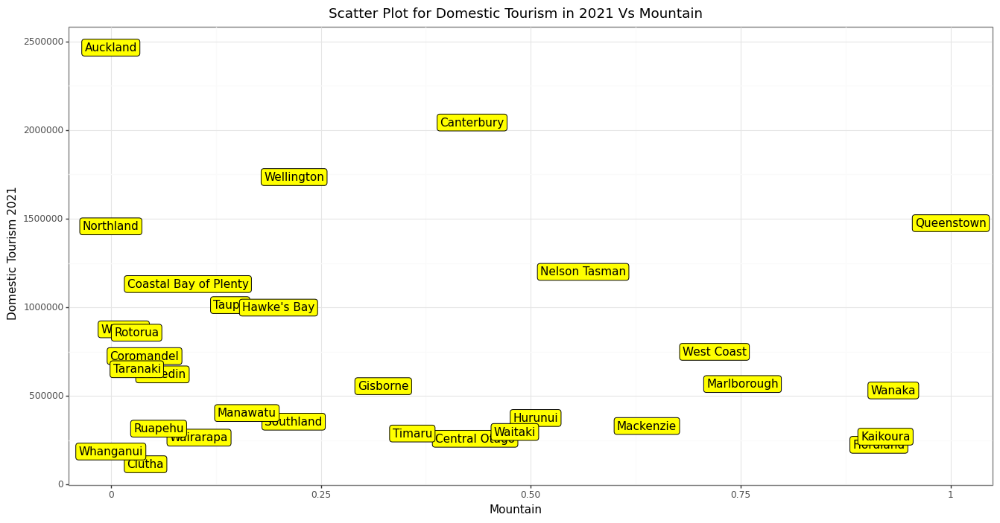

<IPython.core.display.Math object>

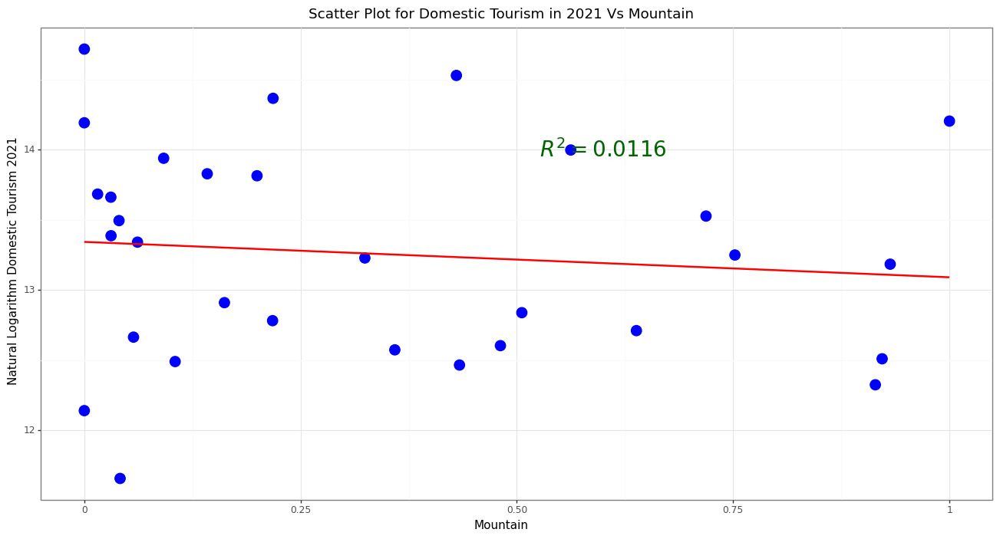

In [23]:
x = X.iloc[:, 0].values.reshape(-1, 1)
Model1 = regr.fit(x, y2)
preds = Model1.predict(x)
R2 = r2_score(y2, preds).round(4)
R2
display(Math(r'R^2_{{Model}} = {}'.format(R2)))


P1 = (ggplot(dat2, aes(x = 'Mountain', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Mountain", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 , y = 3000000, label = r"$R^2 = 0.0193$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot

P = (ggplot(dat2, aes(x = 'Mountain', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Mountain", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)
#### get logarithm of y



Model2 = regr.fit(x, y2_log)
preds2 = Model2.predict(x)
R22 = r2_score(y2_log, preds2).round(4)
R22
display(Math(r'R^2_{{Model}} = {}'.format(R22)))

P2 = (ggplot(dat2, aes(x = 'Mountain', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Mountain", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14, label = r"$R^2 = 0.0116$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br>
<hr><hr>
<br><br>

#### For DistanceToCity

<IPython.core.display.Math object>

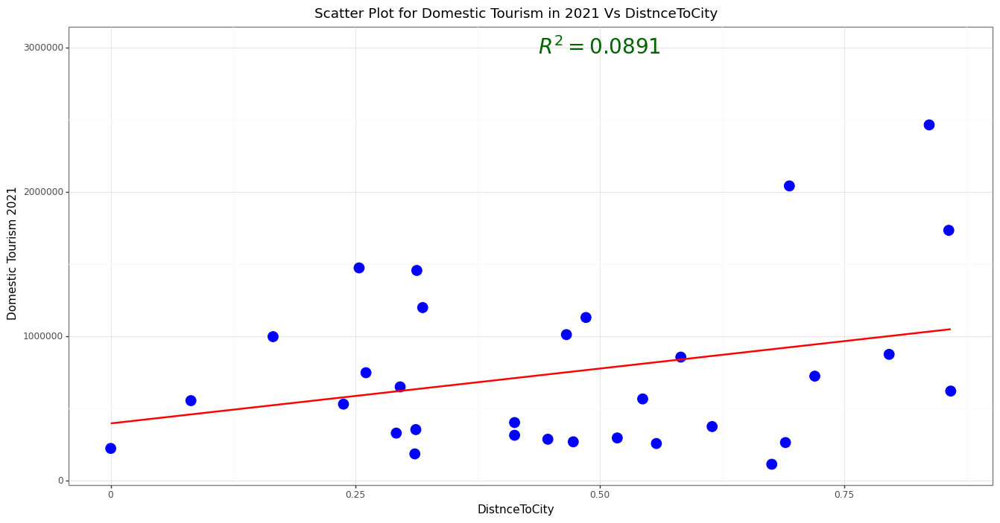

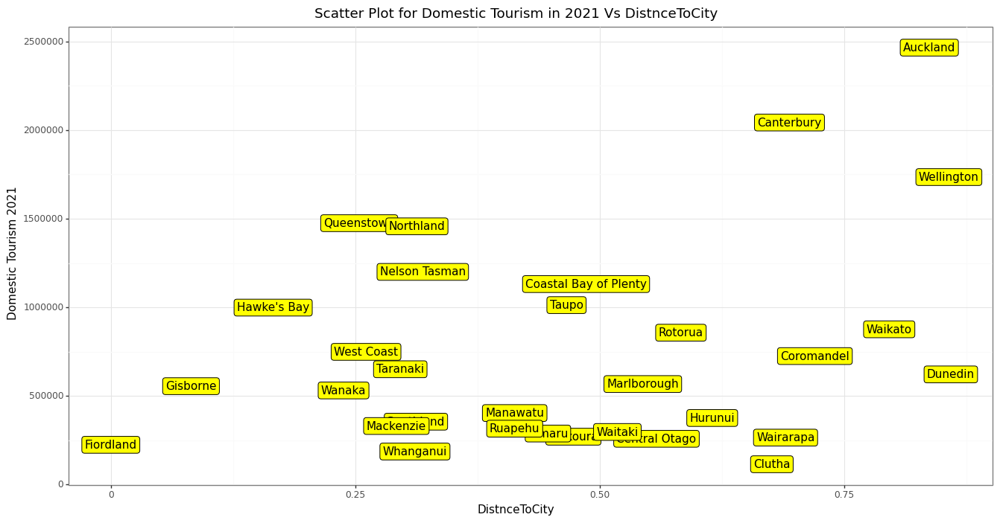

<IPython.core.display.Math object>

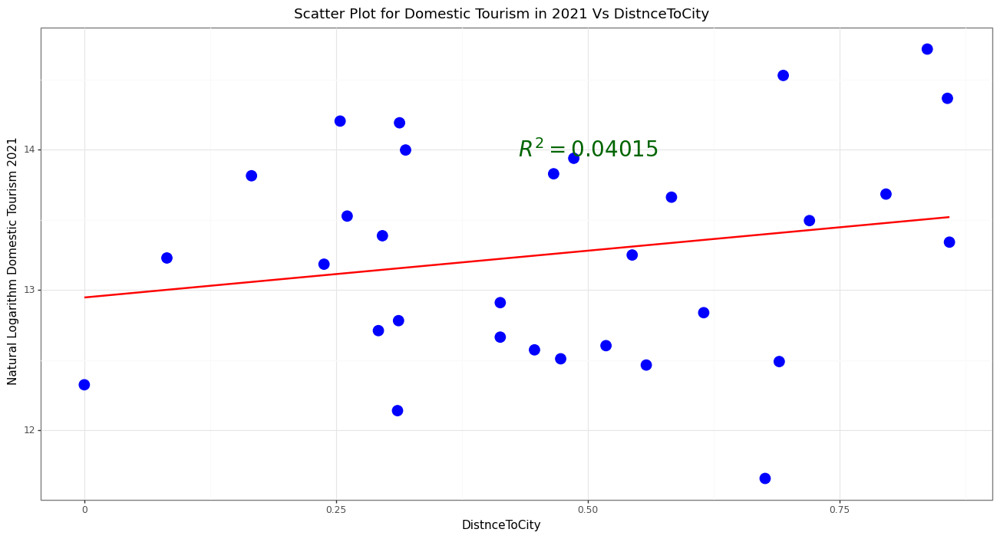

In [24]:
x1 = X.iloc[:, 1].values.reshape(-1, 1)
Model2 = regr.fit(x1, y2)
preds21 = Model2.predict(x1)
R2 = r2_score(y2, preds21).round(4)
R2
display(Math(r'R^2_{{Model}} = {}'.format(R2)))


P1 = (ggplot(dat2, aes(x = 'DistnceToCity', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs DistnceToCity", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.5 , y = 3000000 , label = r"$R^2 = 0.0891$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot

P = (ggplot(dat2, aes(x = 'DistnceToCity', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs DistnceToCity", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)
#### get logarithm of y


Model22 = regr.fit(x1, y2_log)
preds22 = Model2.predict(x1)
R222 = r2_score(y2_log, preds22).round(4)
R222
display(Math(r'R^2_{{Model}} = {}'.format(R222)))

P2 = (ggplot(dat2, aes(x = 'DistnceToCity', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs DistnceToCity", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.5 , y = 14, label = r"$R^2 = 0.04015$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br>
<hr><hr>
<br><br>

#### For Accessibility

<IPython.core.display.Math object>

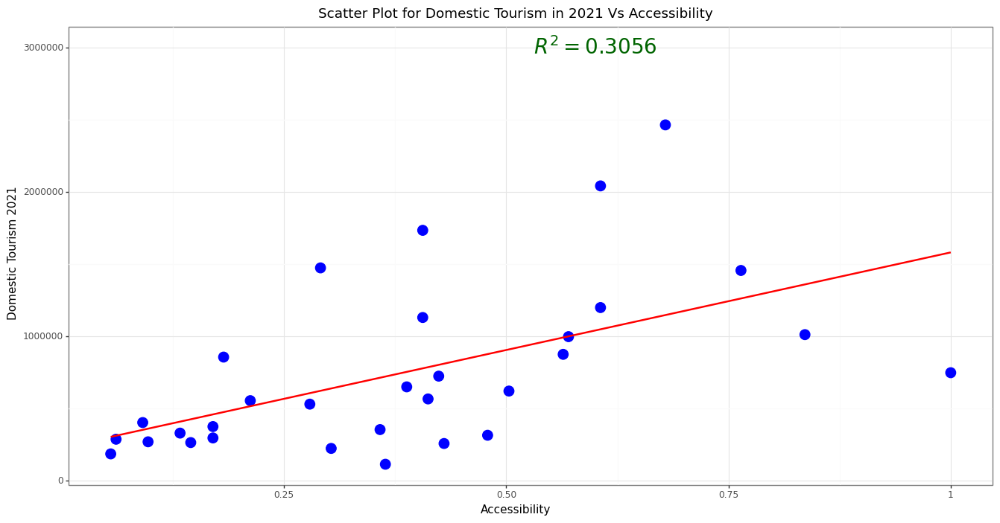

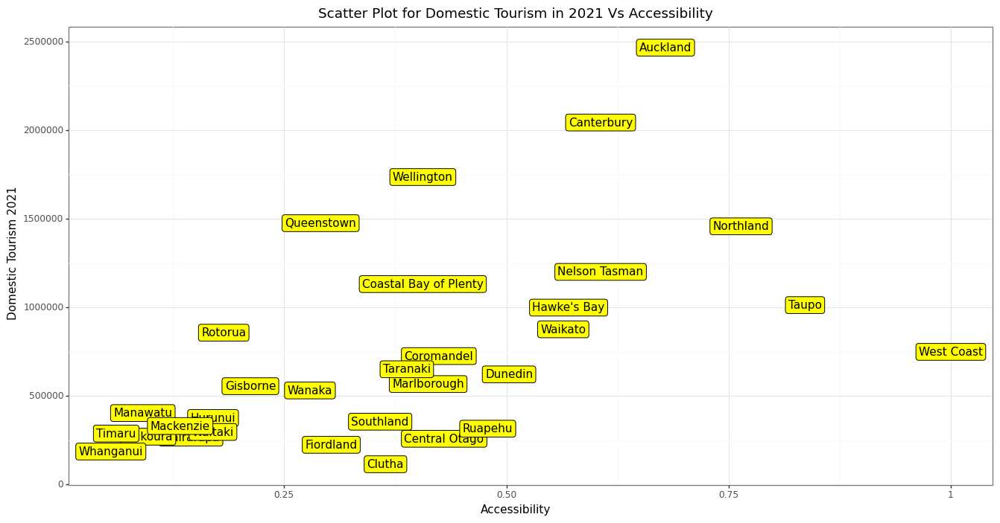

<IPython.core.display.Math object>

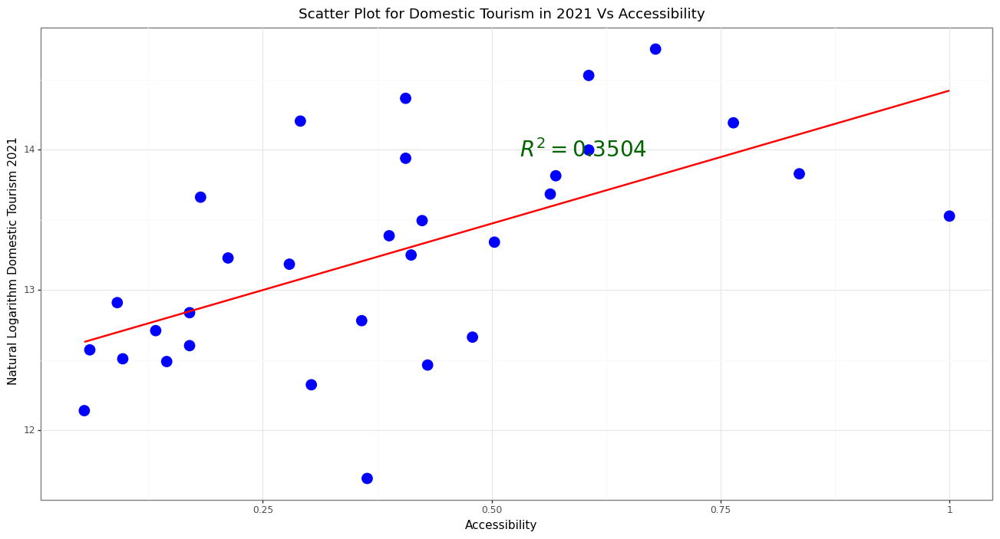

In [25]:
x2 = X.iloc[:, 2].values.reshape(-1, 1)
Model3 = regr.fit(x2, y2)
preds31 = Model3.predict(x2)
R231 = r2_score(y2, preds31).round(4)
R231
display(Math(r'R^2_{{Model}} = {}'.format(R231)))


P1 = (ggplot(dat2, aes(x = 'Accessibility', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Accessibility", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 , y = 3000000, label = r"$R^2 = 0.3056$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)
## create label plot

P = (ggplot(dat2, aes(x = 'Accessibility', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Accessibility", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model32 = regr.fit(x2, y2_log)
preds32 = Model32.predict(x2)
R232 = r2_score(y2_log, preds32).round(4)
R232
display(Math(r'R^2_{{Model}} = {}'.format(R232)))


P2 = (ggplot(dat2, aes(x = 'Accessibility', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Accessibility", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14, label = r"$R^2 = 0.3504$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br>
<hr><hr>
<br><br>

#### For IndigenousForest

<IPython.core.display.Math object>

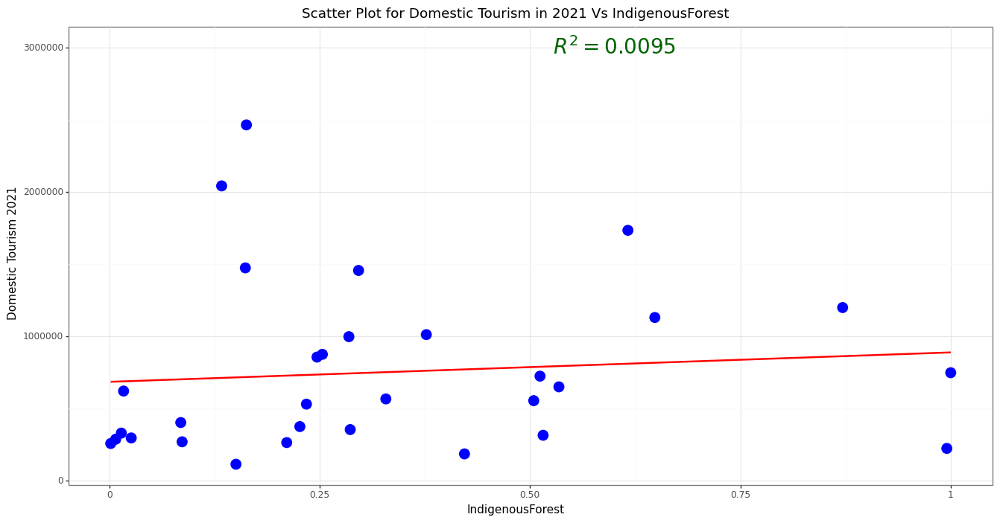

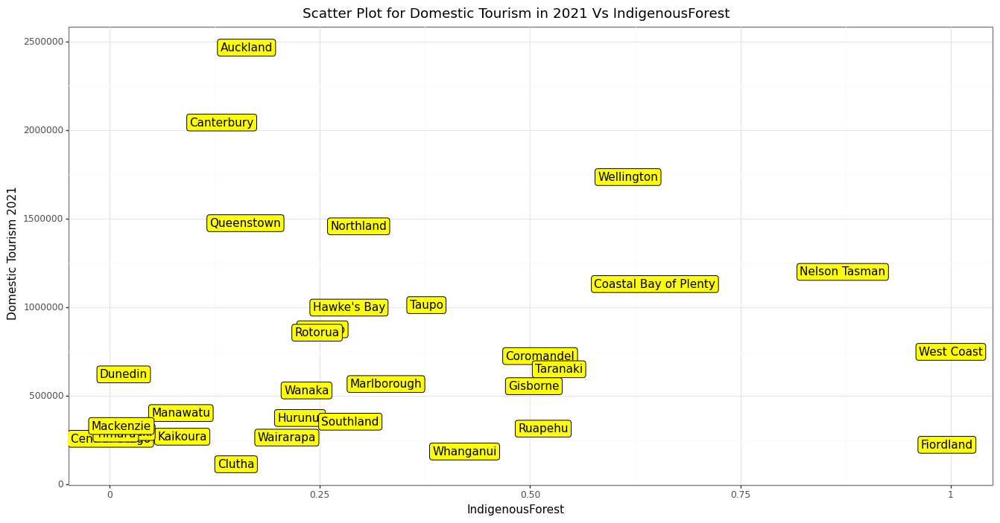

<IPython.core.display.Math object>

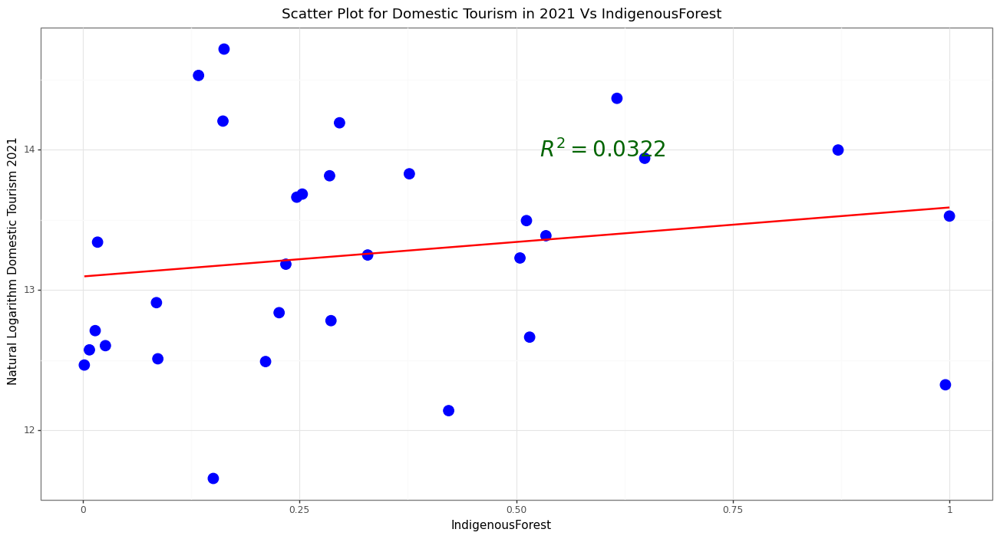

In [26]:
x3 = X.iloc[:, 3].values.reshape(-1, 1)
Model41 = regr.fit(x3, y2)
preds41 = Model41.predict(x3)
R241 = r2_score(y2, preds41).round(4)
R241
display(Math(r'R^2_{{Model}} = {}'.format(R241)))

P1 = (ggplot(dat2, aes(x = 'IndigenousForest', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs IndigenousForest", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 3000000, label = r"$R^2 = 0.0095$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P1)

## create label plot

P = (ggplot(dat2, aes(x = 'IndigenousForest', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs IndigenousForest", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model42 = regr.fit(x3, y2_log)
preds42 = Model32.predict(x3)
R242 = r2_score(y2_log, preds42).round(4)
R242
display(Math(r'R^2_{{Model}} = {}'.format(R242)))


P2 = (ggplot(dat2, aes(x = 'IndigenousForest', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs IndigenousForest", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x =0.6 , y = 14, label = r"$R^2 = 0.0322$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br>
<hr><hr>
<br><br>

#### For Water

<IPython.core.display.Math object>

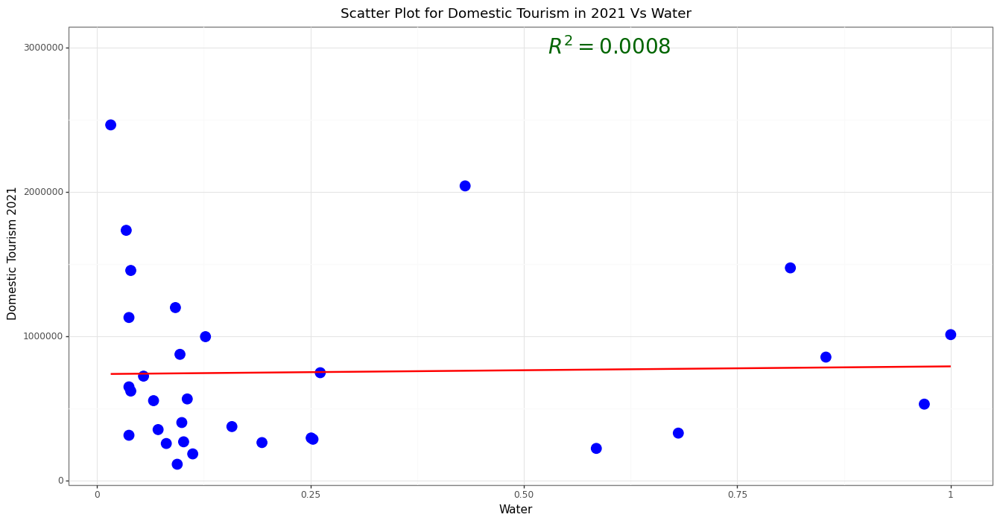

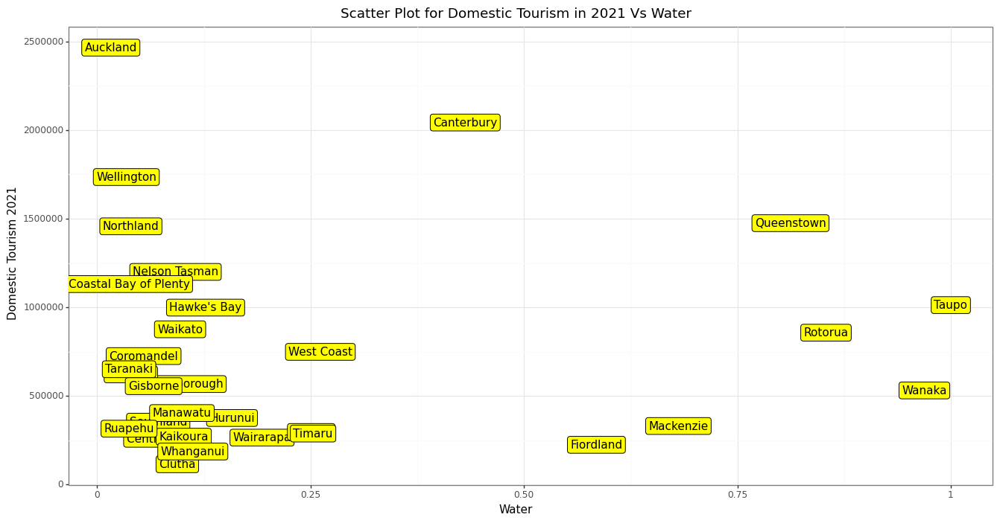

<IPython.core.display.Math object>

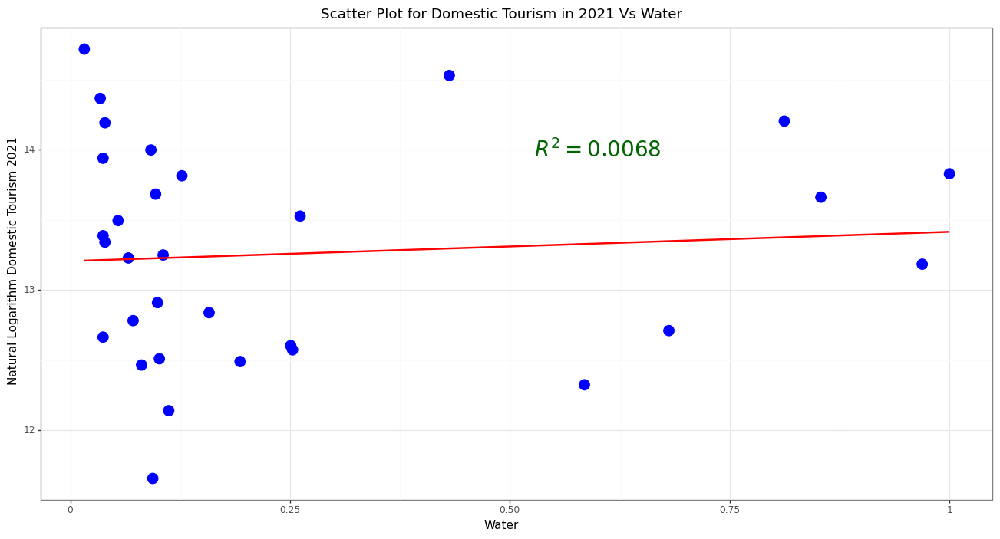

In [27]:
x4 = X.iloc[:, 4].values.reshape(-1, 1)
Model51 = regr.fit(x4, y2)
preds51 = Model51.predict(x4)
R251 = r2_score(y2, preds51).round(4)
R251
display(Math(r'R^2_{{Model}} = {}'.format(R251)))


P1 = (ggplot(dat2, aes(x = 'Water', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Water", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 3000000, label = r"$R^2 = 0.0008$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot

P = (ggplot(dat2, aes(x = 'Water', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Water", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model52 = regr.fit(x4, y2_log)
preds52 = Model52.predict(x4)
R252 = r2_score(y2_log, preds52).round(4)
R252
display(Math(r'R^2_{{Model}} = {}'.format(R252)))


P2 = (ggplot(dat2, aes(x = 'Water', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Water", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14, label = r"$R^2 = 0.0068$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br>
<hr><hr>
<br><br>

#### For ExoticForest

<IPython.core.display.Math object>

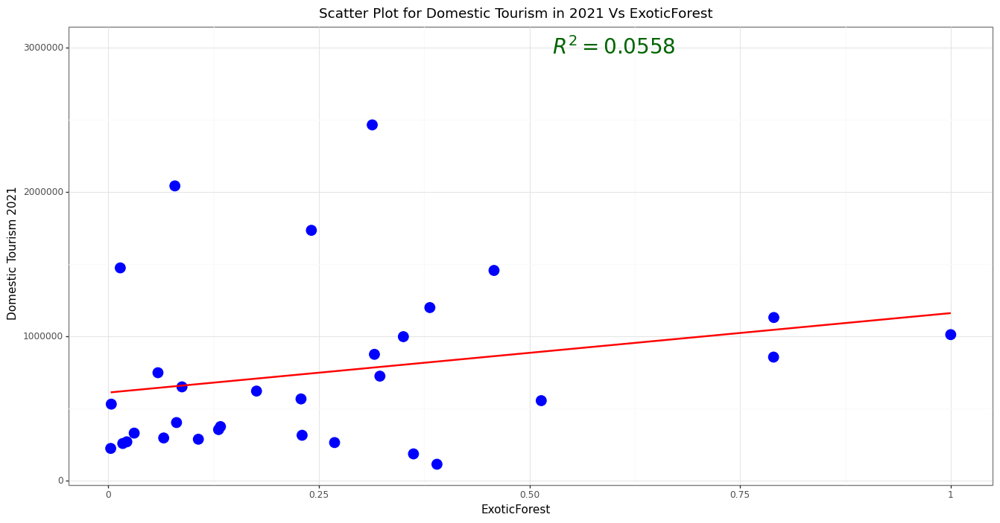

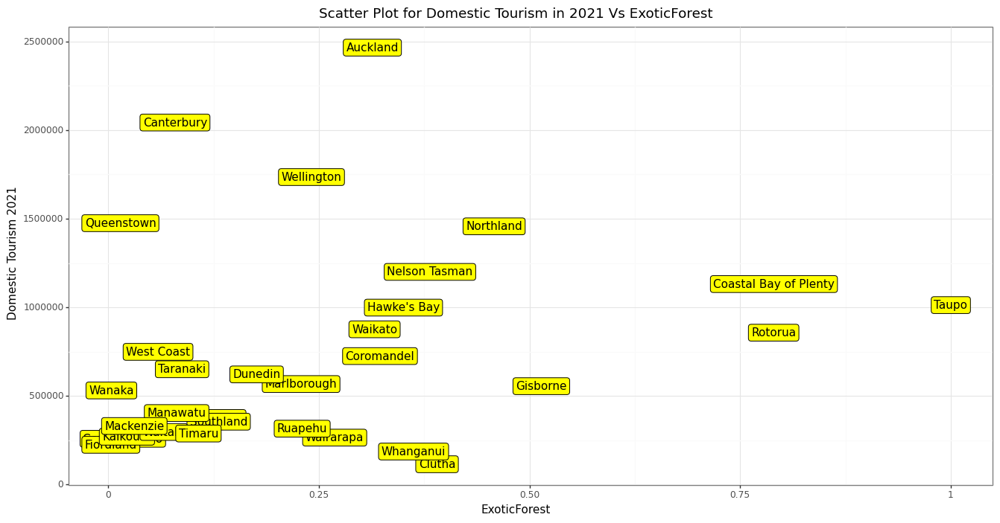

<IPython.core.display.Math object>

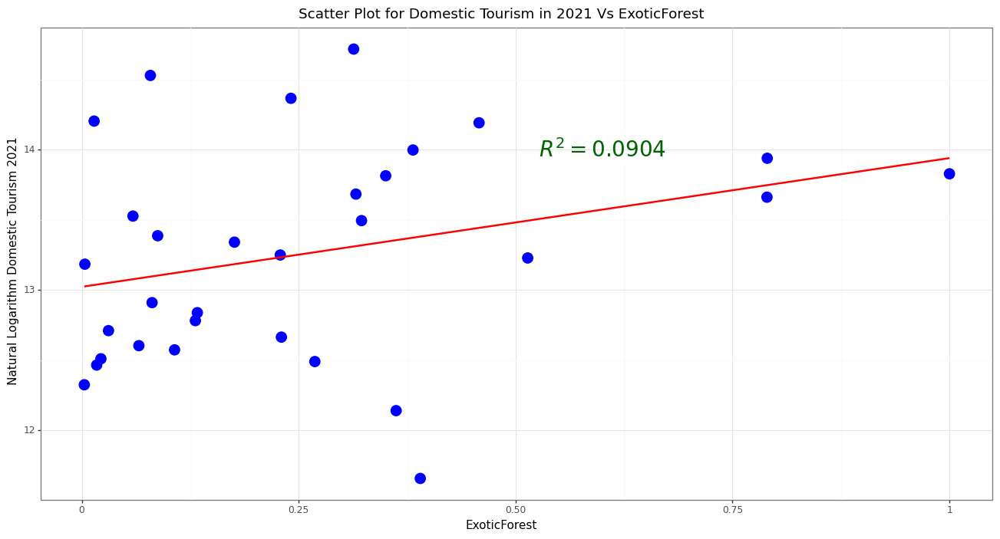

In [28]:
x5 = X.iloc[:, 5].values.reshape(-1, 1)
Model61 = regr.fit(x5, y2)
preds61 = Model61.predict(x5)
R261 = r2_score(y2, preds61).round(4)
R261
display(Math(r'R^2_{{Model}} = {}'.format(R261)))


P1 = (ggplot(dat2, aes(x = 'ExoticForest', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs ExoticForest", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 3000000, label = r"$R^2 = 0.0558$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))


print(P1)

## create label plot


P = (ggplot(dat2, aes(x = 'ExoticForest', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs ExoticForest", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)

#### get logarithm of y


Model62 = regr.fit(x5, y2_log)
preds62 = Model62.predict(x5)
R262 = r2_score(y2_log, preds62).round(4)
R262
display(Math(r'R^2_{{Model}} = {}'.format(R262)))


P2 = (ggplot(dat2, aes(x = 'ExoticForest', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs ExoticForest", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14, label = r"$R^2 = 0.0904$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br>
<hr><hr>
<br><br>


#### For CoastView

<IPython.core.display.Math object>

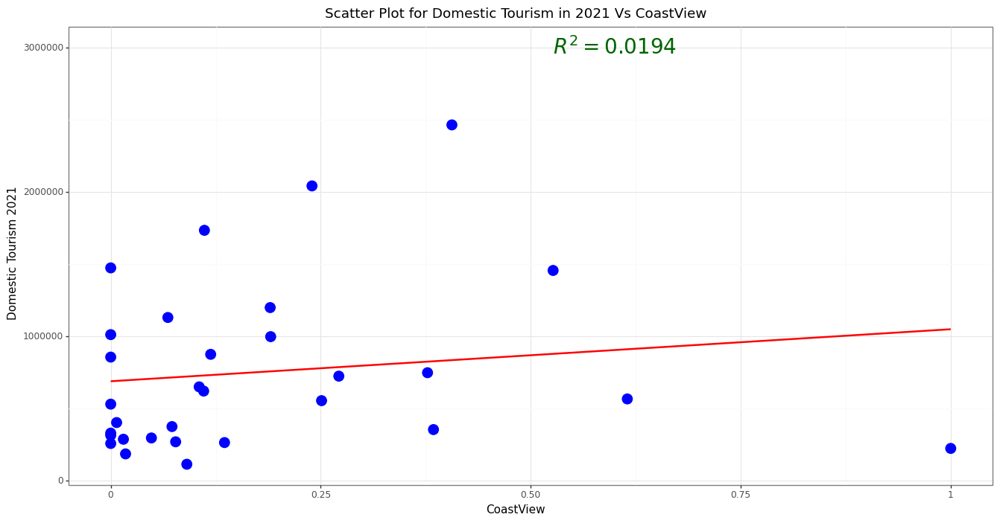

<IPython.core.display.Math object>

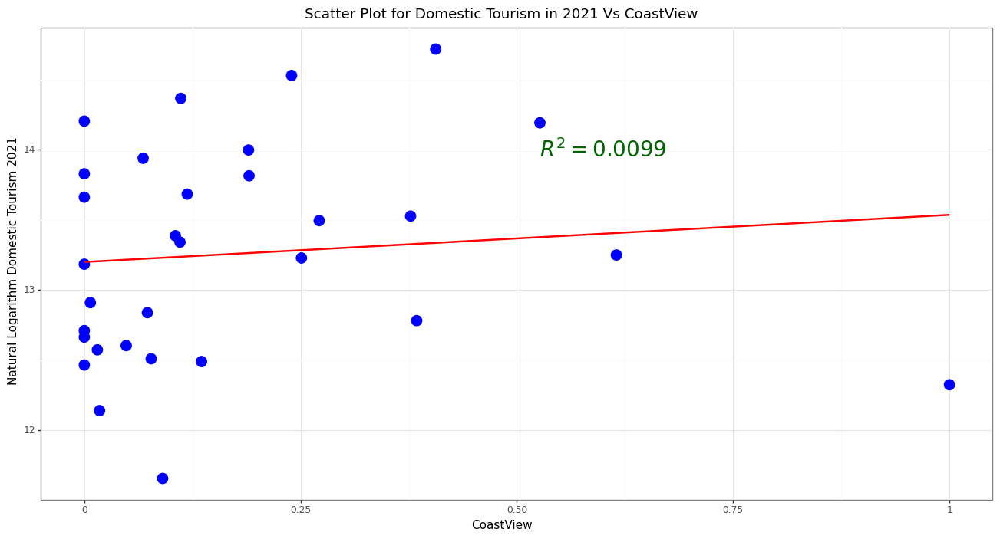

In [29]:
x6 = X.iloc[:, 6].values.reshape(-1, 1)
Model71 = regr.fit(x6, y2)
preds71 = Model71.predict(x6)
R271 = r2_score(y2, preds71).round(4)
R271
display(Math(r'R^2_{{Model}} = {}'.format(R271)))


P1 = (ggplot(dat2, aes(x = 'CoastView', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs CoastView", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 3000000, label = r"$R^2 = 0.0194$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot


P = (ggplot(dat2, aes(x = 'CoastView', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs CoastView", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))


#### get logarithm of y


Model72 = regr.fit(x6, y2_log)
preds72 = Model72.predict(x6)
R272 = r2_score(y2_log, preds72).round(4)
R272
display(Math(r'R^2_{{Model}} = {}'.format(R272)))

P2 = (ggplot(dat2, aes(x = 'CoastView', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs CoastView", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14 , label = r"$R^2 = 0.0099$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))


print(P2)

<br><br>
<hr><hr>
<br><br>


#### For DistanceToAirport

<IPython.core.display.Math object>

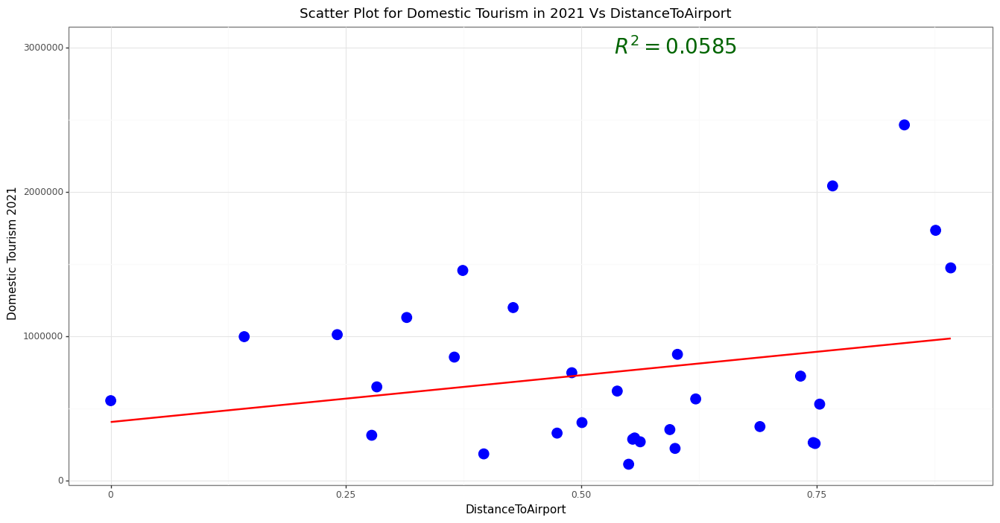

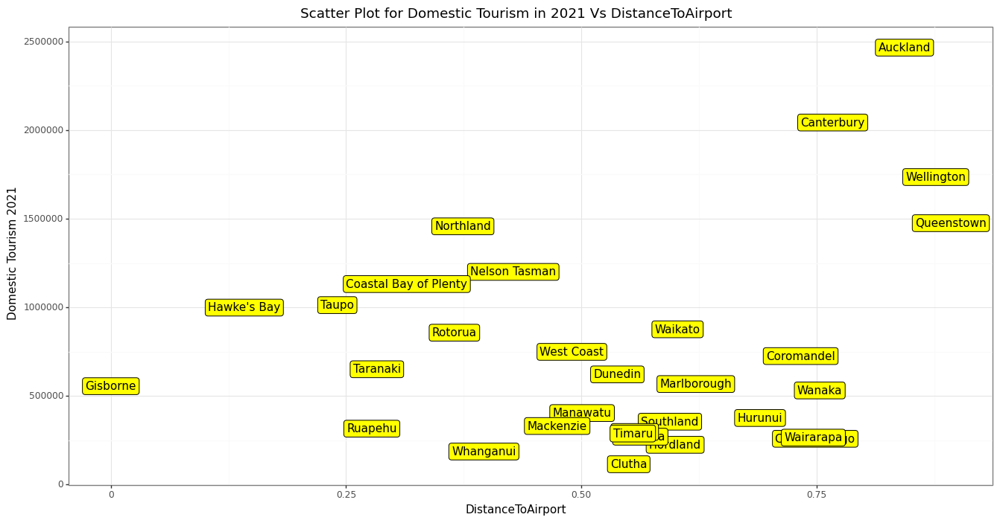

<IPython.core.display.Math object>

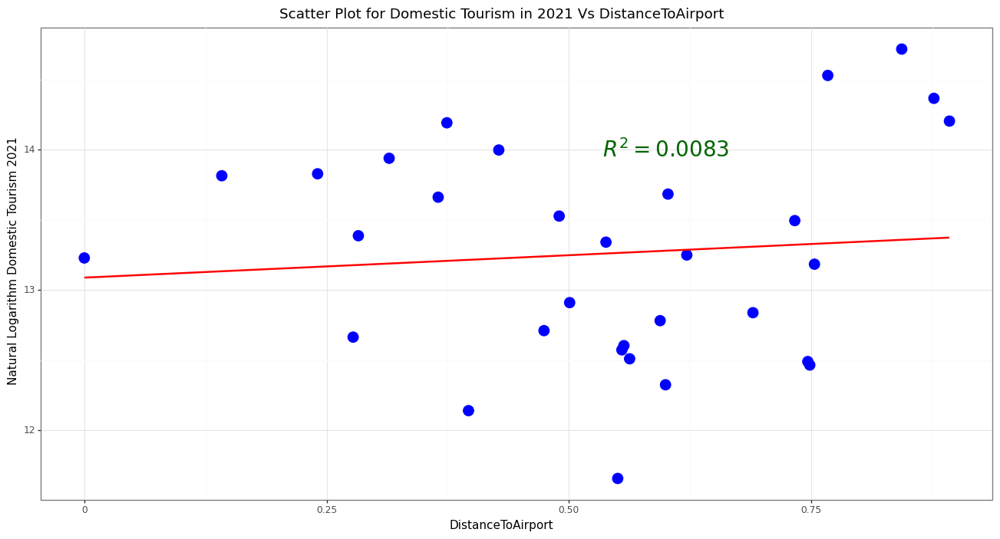

In [30]:
x7 = X.iloc[:, 7].values.reshape(-1, 1)
Model81 = regr.fit(x7, y2)
preds81 = Model81.predict(x7)
R281 = r2_score(y2, preds81).round(4)
R281
display(Math(r'R^2_{{Model}} = {}'.format(R281)))


P1 = (ggplot(dat2, aes(x = 'DistanceToAirport', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs DistanceToAirport", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 3000000, label = r"$R^2 = 0.0585$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot


P = (ggplot(dat2, aes(x = 'DistanceToAirport', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs DistanceToAirport", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)
#### get logarithm of y


Model82 = regr.fit(x7, y2_log)
preds82 = Model82.predict(x7)
R282 = r2_score(y2_log, preds82).round(4)
R282
display(Math(r'R^2_{{Model}} = {}'.format(R282)))

P2 = (ggplot(dat2, aes(x = 'DistanceToAirport', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs DistanceToAirport", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14 , label = r"$R^2 = 0.0083$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br>
<hr><hr>
<br><br>

#### For Wetland

<IPython.core.display.Math object>

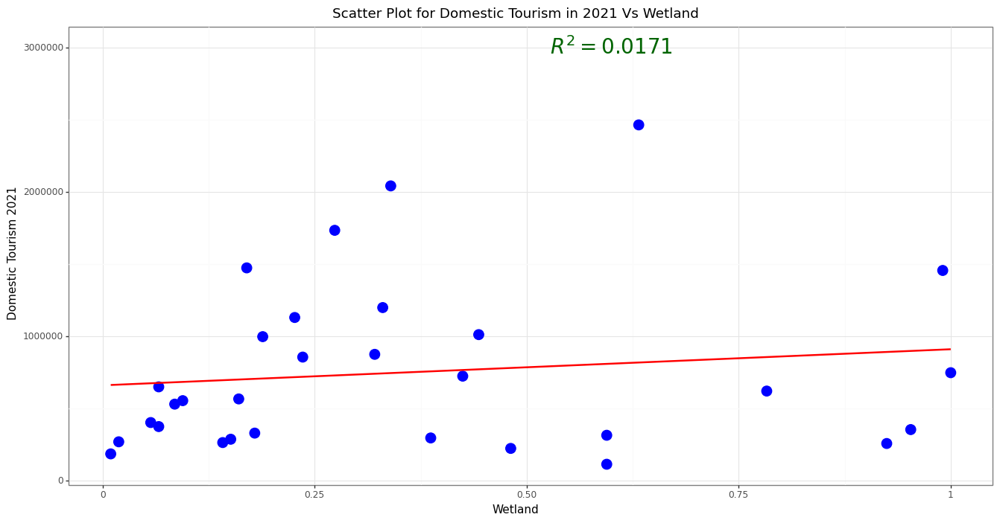

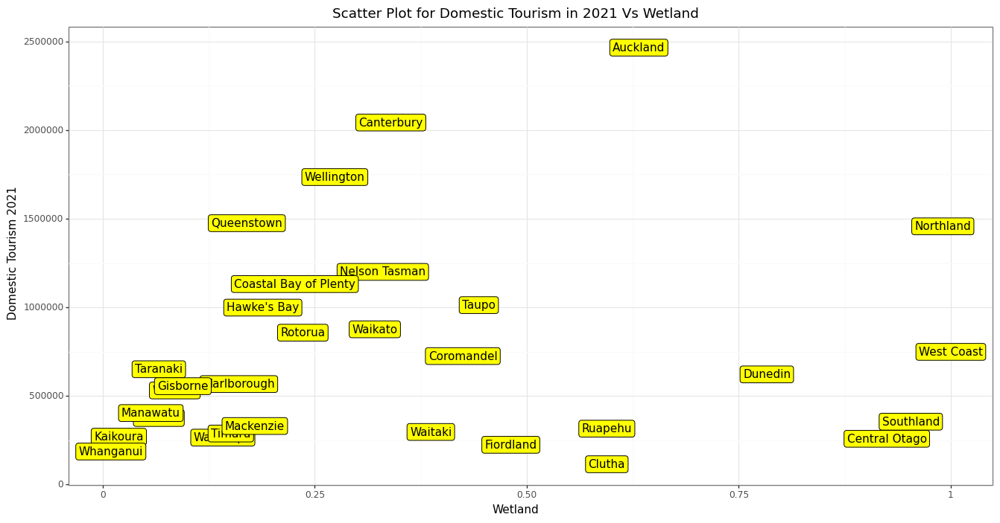

<IPython.core.display.Math object>

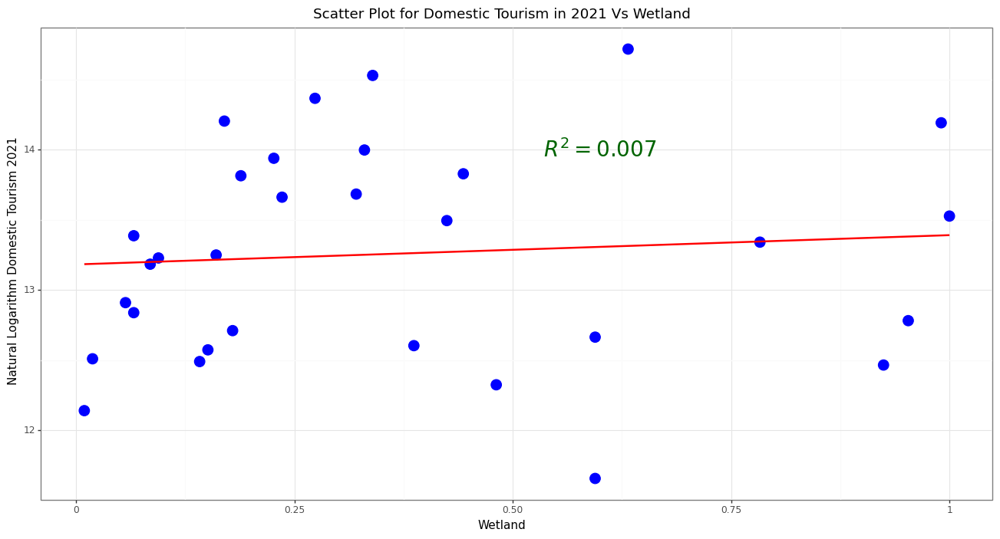

In [31]:
x8 = X.iloc[:, 8].values.reshape(-1, 1)
Model91 = regr.fit(x8, y2)
preds91 = Model91.predict(x8)
R291 = r2_score(y2, preds91).round(4)
R291
display(Math(r'R^2_{{Model}} = {}'.format(R291)))


P1 = (ggplot(dat2, aes(x = 'Wetland', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Wetland", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 3000000, label = r"$R^2 = 0.0171$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)
## create label plot


P = (ggplot(dat2, aes(x = 'Wetland', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Wetland", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)
#### get logarithm of y


Model92 = regr.fit(x8, y2_log)
preds92 = Model82.predict(x8)
R292 = r2_score(y2_log, preds92).round(4)
R292
display(Math(r'R^2_{{Model}} = {}'.format(R292)))


P2 = (ggplot(dat2, aes(x = 'Wetland', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Wetland", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14 , label = r"$R^2 = 0.007$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))
print(P2)

<br><br>
<hr><hr>
<br><br>


#### For ProtectedAreas

<IPython.core.display.Math object>

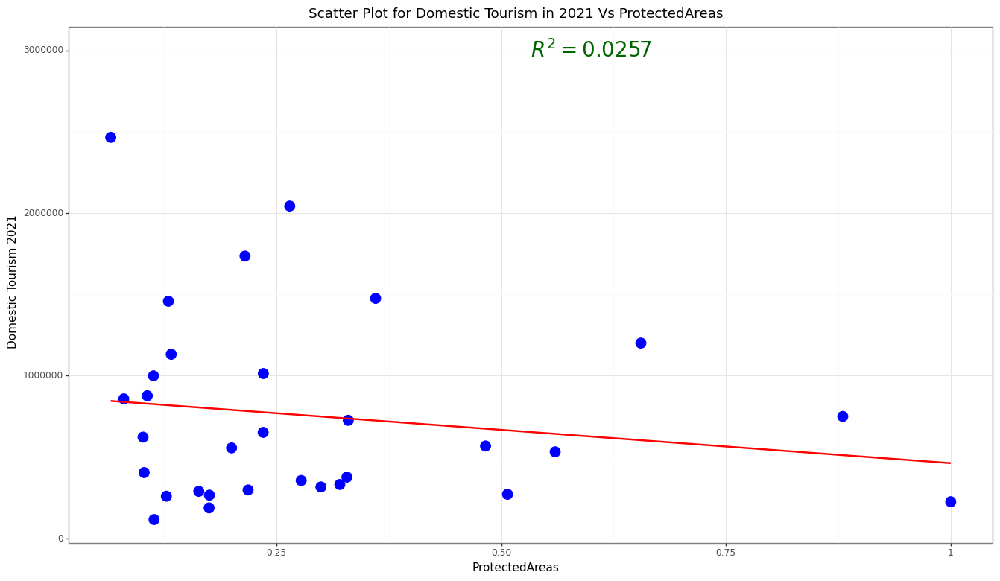

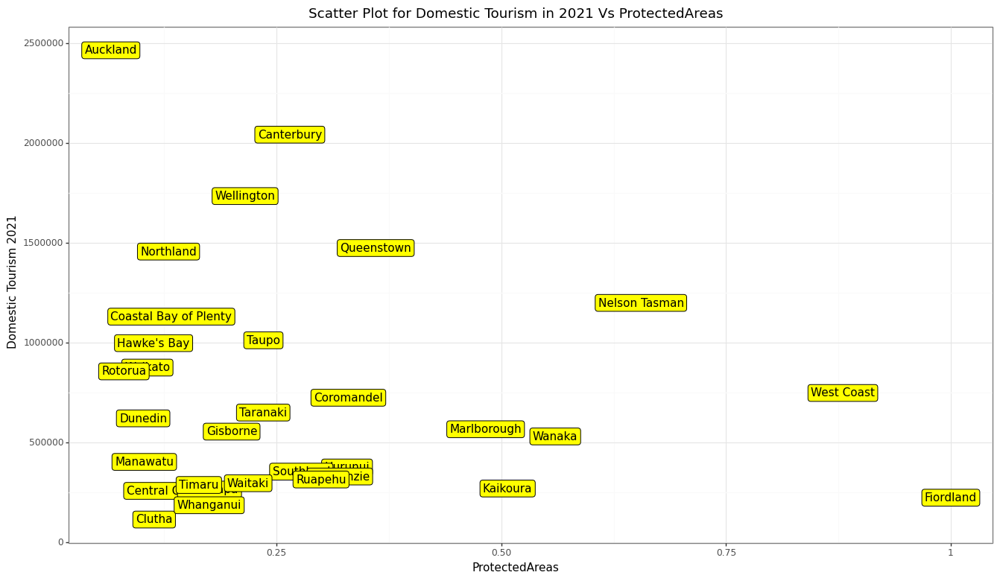

<IPython.core.display.Math object>

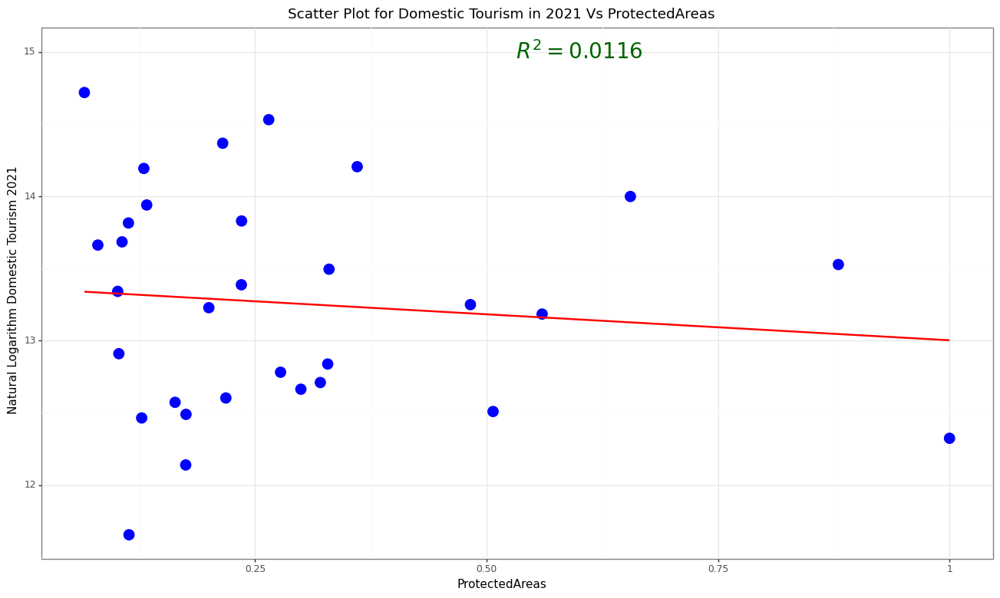

In [32]:
x9 = X.iloc[:, 9].values.reshape(-1, 1)
Model91 = regr.fit(x9, y2)
preds91 = Model91.predict(x9)
R291 = r2_score(y2, preds91).round(4)
R291
display(Math(r'R^2_{{Model}} = {}'.format(R291)))

P1 = (ggplot(dat2, aes(x = 'ProtectedAreas', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs ProtectedAreas", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 3000000, label = r"$R^2 = 0.0257$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 9)))

print(P1)
## create label plot


P = (ggplot(dat2, aes(x = 'ProtectedAreas', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs ProtectedAreas", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 9)))
print(P)

#### get logarithm of y


Model92 = regr.fit(x9, y2_log)
preds92 = Model92.predict(x9)
R292 = r2_score(y2_log, preds92).round(4)
R292
display(Math(r'R^2_{{Model}} = {}'.format(R292)))


P2 = (ggplot(dat2, aes(x = 'ProtectedAreas', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs ProtectedAreas", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 15 , label = r"$R^2 = 0.0116$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 9)))

print(P2)

<br><br>
<hr><hr>
<br><br>

#### For Grassland

<IPython.core.display.Math object>

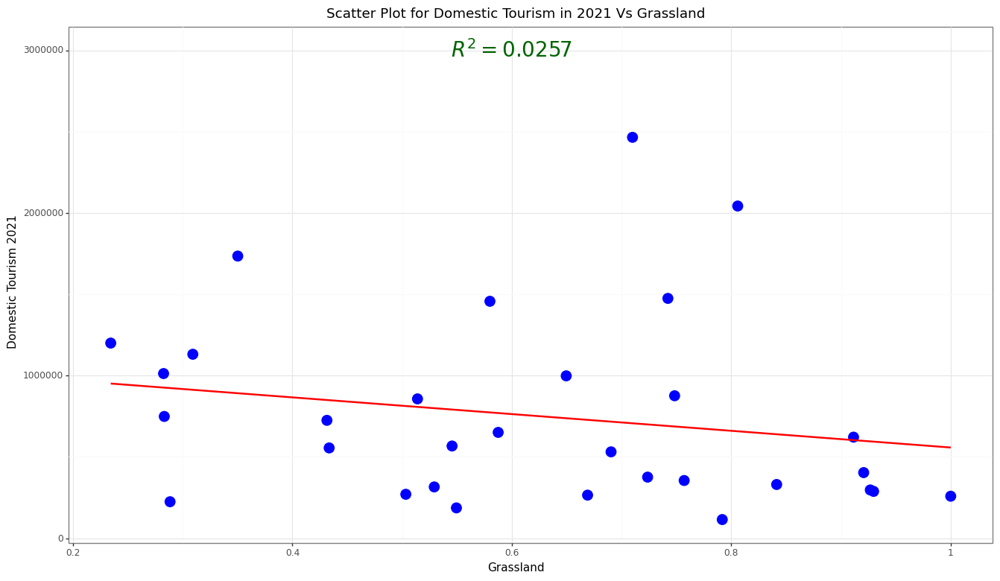

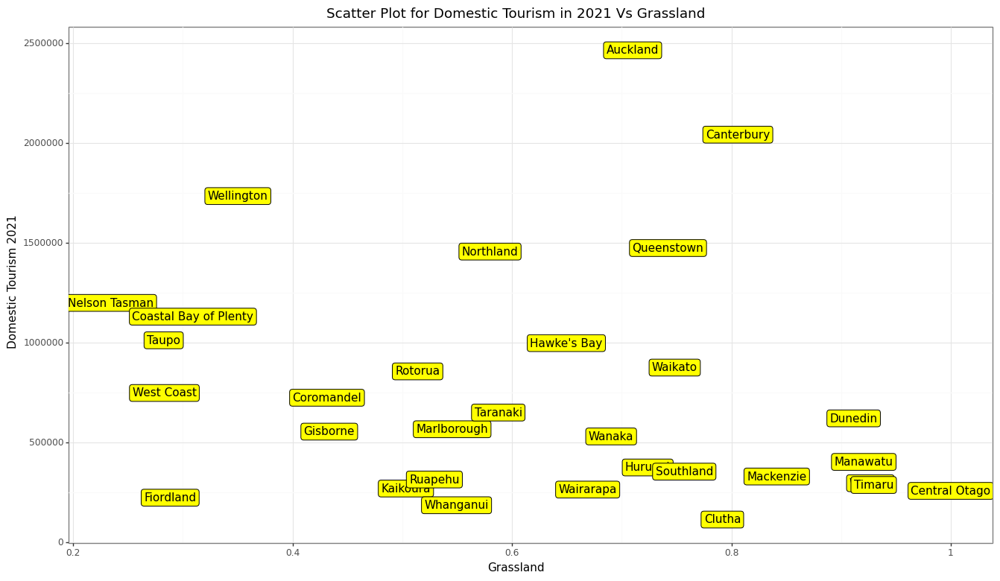

<IPython.core.display.Math object>

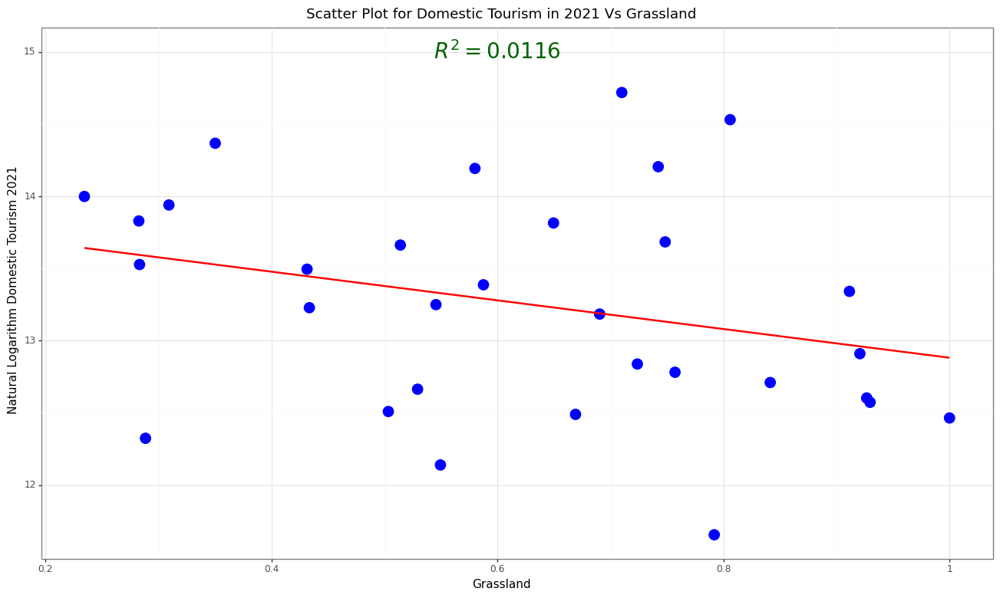

In [33]:
xx9 = X.iloc[:, 9].values.reshape(-1, 1)
Model91 = regr.fit(xx9, y2)
preds91 = Model91.predict(xx9)
R291 = r2_score(y2, preds91).round(4)
R291
display(Math(r'R^2_{{Model}} = {}'.format(R291)))

P1 = (ggplot(dat2, aes(x = 'Grassland', y = "y2")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Grassland", 
y = 'Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 3000000, label = r"$R^2 = 0.0257$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 9)))

print(P1)
## create label plot


P = (ggplot(dat2, aes(x = 'Grassland', y = "y2")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Grassland", 
y = 'Domestic Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 9)))
print(P)

#### get logarithm of y


Model92 = regr.fit(xx9, y2_log)
preds92 = Model92.predict(xx9)
R292 = r2_score(y2_log, preds92).round(4)
R292
display(Math(r'R^2_{{Model}} = {}'.format(R292)))


P2 = (ggplot(dat2, aes(x = 'Grassland', y = "y2_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for Domestic Tourism in 2021 Vs Grassland", 
y = 'Natural Logarithm Domestic Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 15 , label = r"$R^2 = 0.0116$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 9)))

print(P2)

<br><br>
<hr><hr>
<br><br>


#### Define a Model With all variables

In [34]:
## without scaling
X2 = sm.add_constant(X)

model = sm.OLS(y2, X2).fit()

print_model = model.summary()
print(print_model)

## with scaling
# xx2 = scaler.fit_transform(X)

# xx3 = sm.add_constant(xx2)

# model2 = sm.OLS(y2, xx3).fit()
# print_model2 = model2.summary()
# print(print_model2)


############################### y ---> log(y)

## with scaling

model3 = sm.OLS(y2_log, X2).fit()
print_model3 = model3.summary()
print(print_model3)

                            OLS Regression Results                            
Dep. Variable:            Domestic_21   R-squared:                       0.779
Model:                            OLS   Adj. R-squared:                  0.651
Method:                 Least Squares   F-statistic:                     6.090
Date:                Sat, 08 Jul 2023   Prob (F-statistic):           0.000319
Time:                        10:51:30   Log-Likelihood:                -431.57
No. Observations:                  31   AIC:                             887.1
Df Residuals:                      19   BIC:                             904.4
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const              1.364e+06   1.09e+0

<br><br>
<hr><hr>
<br><br>



#### Get Correlation Matrix Between Variables

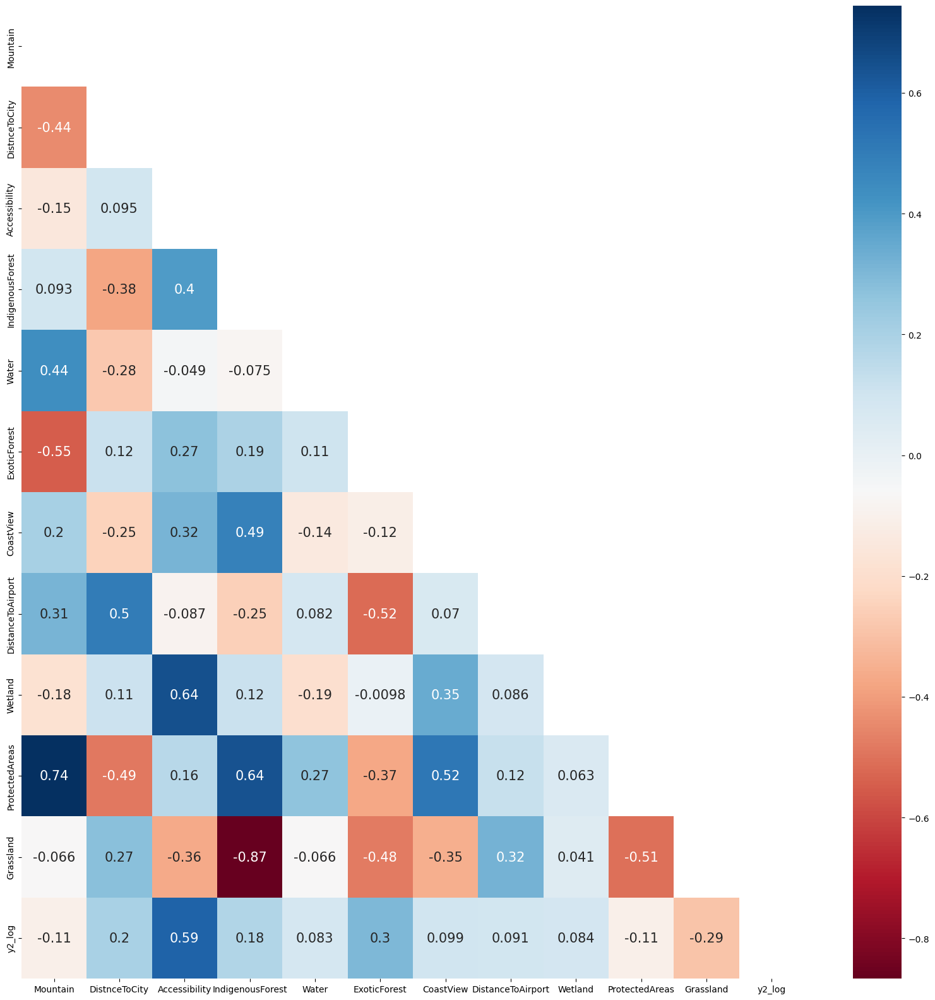

<Figure size 2000x2000 with 0 Axes>

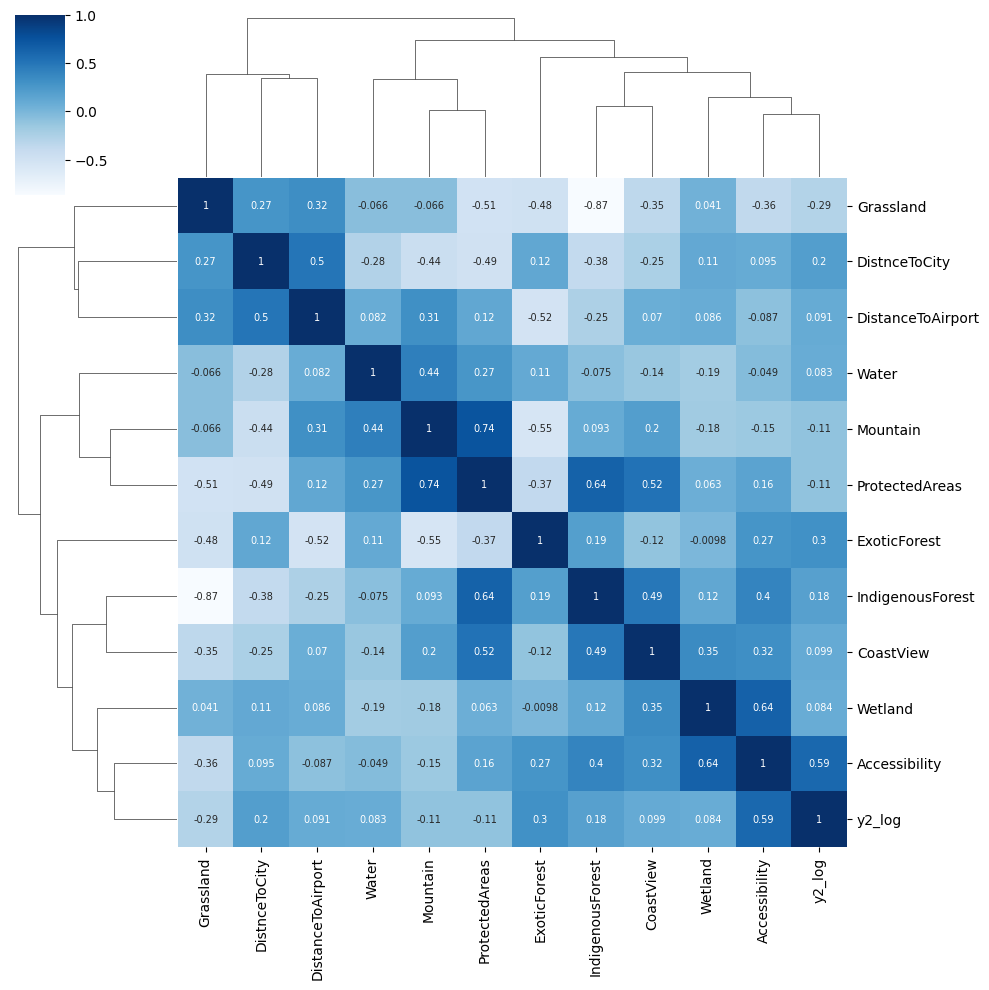

In [35]:
dat2_corr = dat2.drop(['y2', 'RTO_Names'], axis = 1)
dat2_corr.columns
dat2_corrr = dat2_corr.corr()



matrix = np.triu(dat2_corrr)
plt.figure(figsize=(20, 20), facecolor='w', edgecolor='k')
sns.heatmap(dat2_corrr, annot = True, annot_kws = {"size" : 15}, mask = matrix , cmap="RdBu")
plt.show()

plt.figure(figsize=(20, 20), facecolor='w', edgecolor='k')
cmap = sns.diverging_palette(h_neg=210, h_pos=350, s=90, l=30, as_cmap=True)

sns.clustermap(data = dat2_corrr, annot = True, cmap = "Blues", 
annot_kws={"size": 7})
plt.show()

In [36]:
X_new = X.drop(['Grassland' , 'DistanceToAirport' ], axis = 1)

temp1 = X_new.columns
temp1
# xx = scaler.fit_transform(X_new)
# xx = pd.DataFrame(xx, columns = temp1, index = dat_org.index)
model = sm.OLS(y2, X_new).fit()

print_model = model.summary()
print(print_model)


############################### y ---> log(y)

## with scaling
model3 = sm.OLS(y2_log, X_new).fit()
print_model3 = model3.summary()
print(print_model3)

                                 OLS Regression Results                                
Dep. Variable:            Domestic_21   R-squared (uncentered):                   0.895
Model:                            OLS   Adj. R-squared (uncentered):              0.851
Method:                 Least Squares   F-statistic:                              20.74
Date:                Sat, 08 Jul 2023   Prob (F-statistic):                    9.06e-09
Time:                        10:51:31   Log-Likelihood:                         -435.68
No. Observations:                  31   AIC:                                      889.4
Df Residuals:                      22   BIC:                                      902.3
Df Model:                           9                                                  
Covariance Type:            nonrobust                                                  
                       coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

<br><br><hr><hr><hr><hr><hr><br><br>
## International Tourism 2018


#### define data for International Tourism in 2018

In [37]:
y3 = dat_org['International_18']
y3_log = np.log(y3)
dat3 = pd.concat([y3, X], axis = 1, join = "outer")
dat3.index = dat_org['RTO_Name']
dat3.columns =  ['y3', 'Mountain', 
'DistnceToCity', 'Accessibility', 
'IndigenousForest',  'Water', 
'ExoticForest',  'CoastView', 'DistanceToAirport', 'Wetland', 'ProtectedAreas', 'Grassland']
dat3['RTO_Names']= dat_org['RTO_Name'].values
dat3['y3_log'] = y3_log.values
dat3
dat3.columns

Index(['y3', 'Mountain', 'DistnceToCity', 'Accessibility', 'IndigenousForest',
       'Water', 'ExoticForest', 'CoastView', 'DistanceToAirport', 'Wetland',
       'ProtectedAreas', 'Grassland', 'RTO_Names', 'y3_log'],
      dtype='object')

In [38]:
regr = linear_model.LinearRegression()
scaler = MinMaxScaler(feature_range=(0, 1))

<br><br><hr><hr><br><br>

#### For Mountain




<IPython.core.display.Math object>

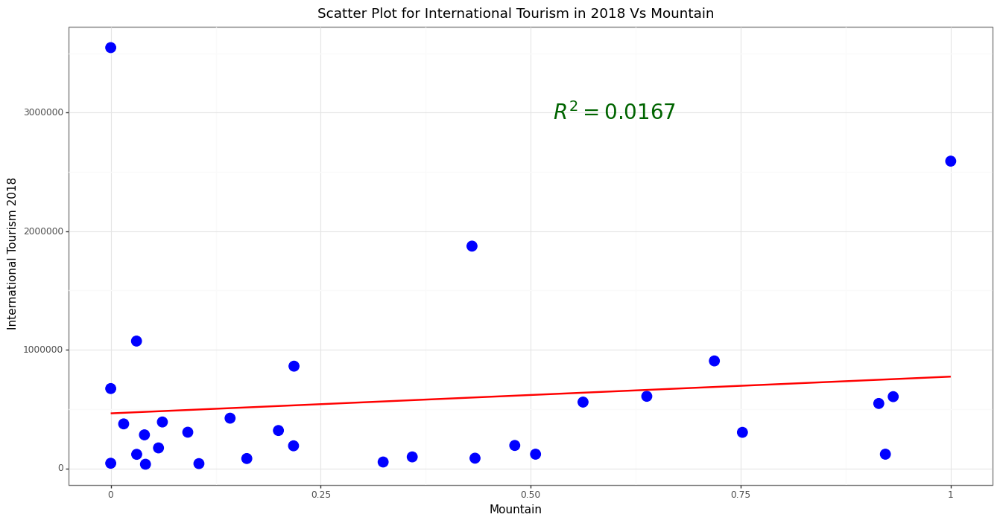

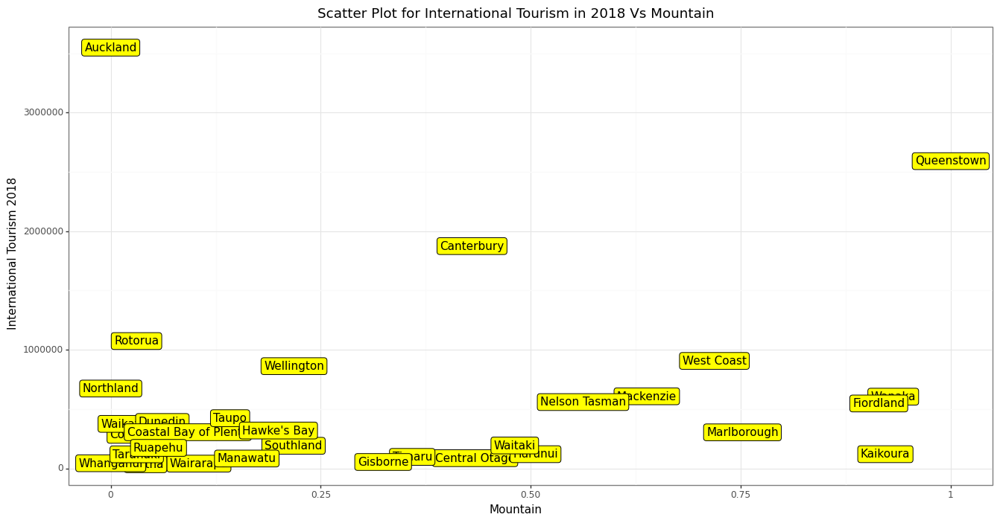

<IPython.core.display.Math object>

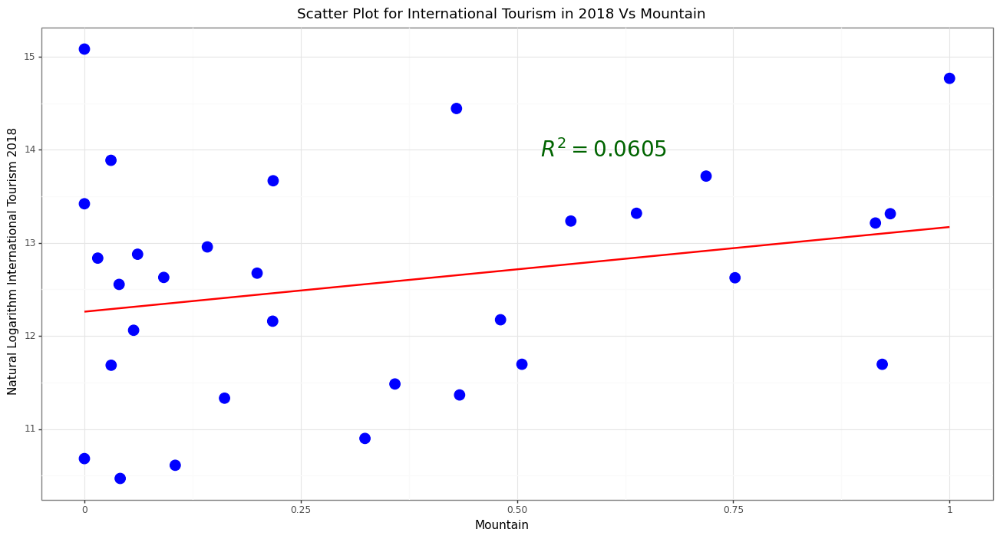

In [39]:
x = X.iloc[:, 0].values.reshape(-1, 1)
Model1 = regr.fit(x, y3)
preds = Model1.predict(x)
R2 = r2_score(y3, preds).round(4)
R2
display(Math(r'R^2_{{Model}} = {}'.format(R2)))


P1 = (ggplot(dat3, aes(x = 'Mountain', y = "y3")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Mountain", 
y = 'International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 , y = 3000000, label = r"$R^2 = 0.0167$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P1)


## create label plot

P = (ggplot(dat3, aes(x = 'Mountain', y = "y3")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Mountain", 
y = 'International Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model2 = regr.fit(x, y3_log)
preds2 = Model2.predict(x)
R22 = r2_score(y3_log, preds2).round(4)
R22
display(Math(r'R^2_{{Model}} = {}'.format(R22)))


P2 = (ggplot(dat3, aes(x = 'Mountain', y = "y3_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Mountain", 
y = 'Natural Logarithm International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14, label = r"$R^2 = 0.0605$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>

#### For DistnceToCity

<IPython.core.display.Math object>

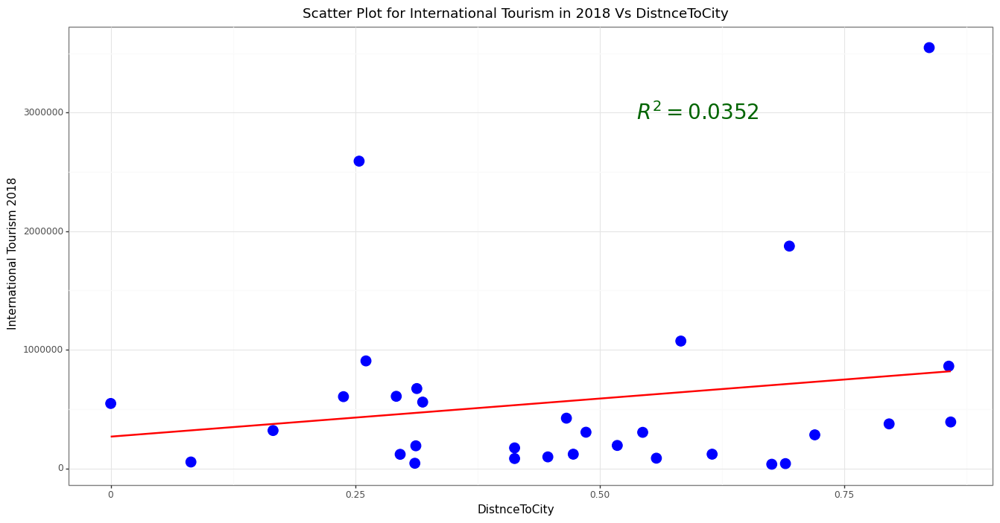

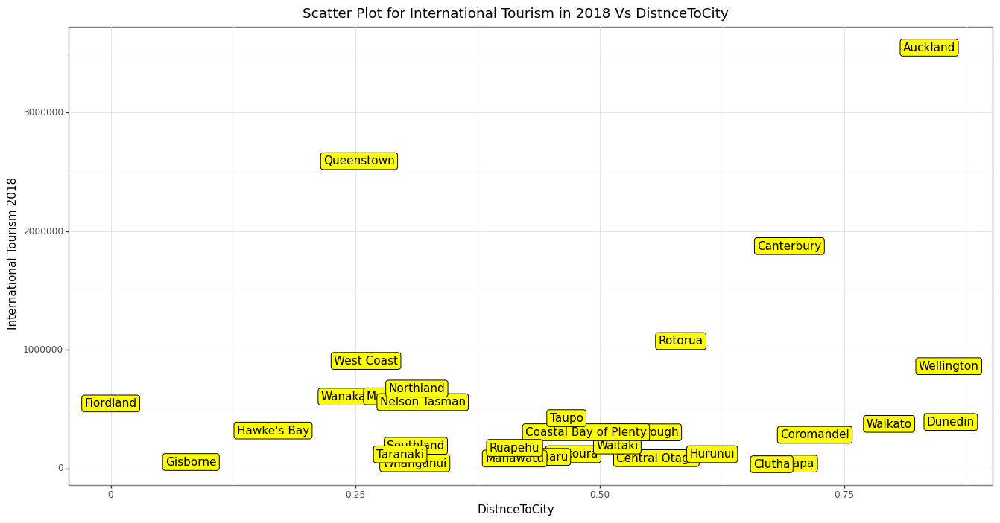

<IPython.core.display.Math object>

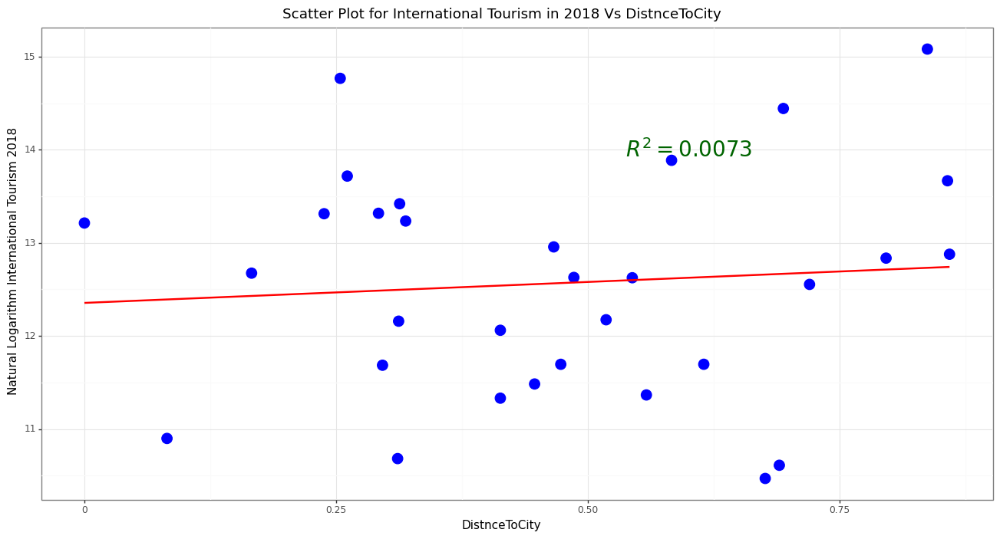

In [40]:
x1 = X.iloc[:, 1].values.reshape(-1, 1)
Model2 = regr.fit(x1, y3)
preds21 = Model2.predict(x1)
R2 = r2_score(y3, preds21).round(4)
R2
display(Math(r'R^2_{{Model}} = {}'.format(R2)))


P1 = (ggplot(dat3, aes(x = 'DistnceToCity', y = "y3")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs DistnceToCity", 
y = 'International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 , y = 3000000, label = r"$R^2 = 0.0352$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)


## create label plot

P = (ggplot(dat3, aes(x = 'DistnceToCity', y = "y3")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs DistnceToCity", 
y = 'International Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model22 = regr.fit(x1, y3_log)
preds22 = Model2.predict(x1)
R222 = r2_score(y3_log, preds22).round(4)
R222
display(Math(r'R^2_{{Model}} = {}'.format(R222)))

P2 = (ggplot(dat3, aes(x = 'DistnceToCity', y = "y3_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs DistnceToCity", 
y = 'Natural Logarithm International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14, label = r"$R^2 = 0.0073$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))
print(P2)

<br><br><hr><hr><br><br>

#### For Accessibility

<IPython.core.display.Math object>

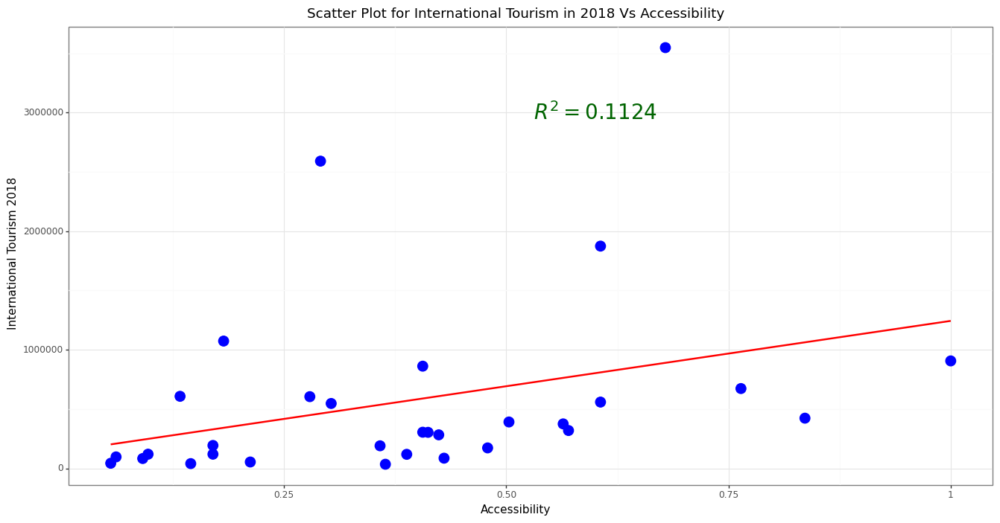

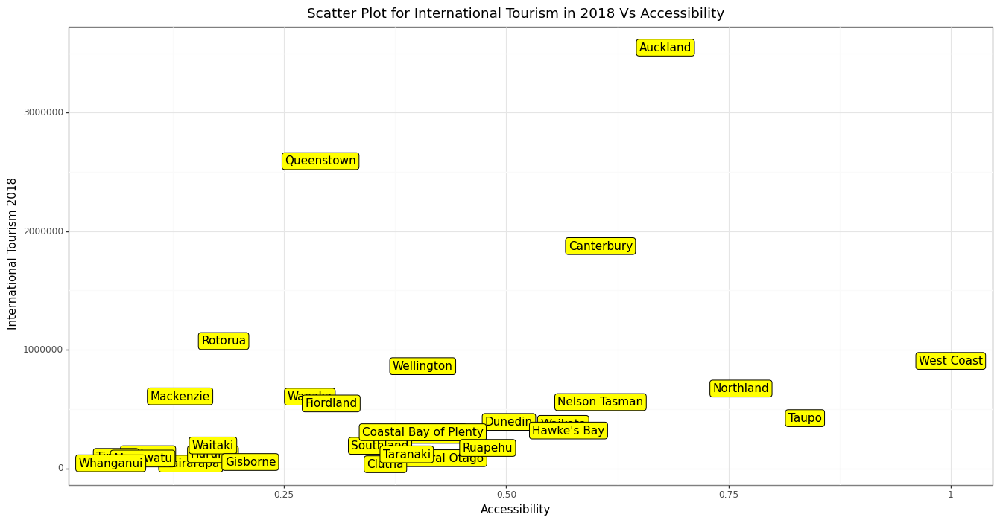

<IPython.core.display.Math object>

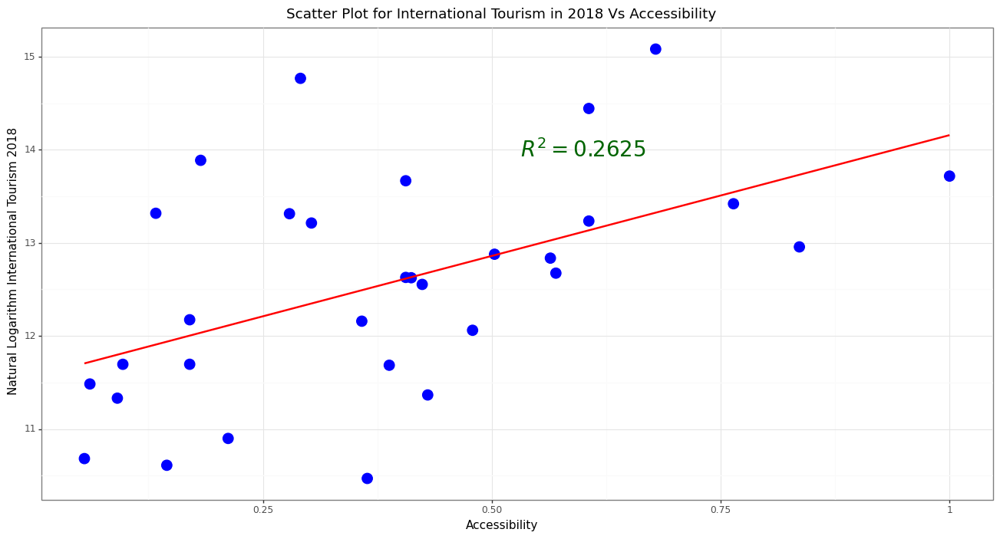

In [41]:
x2 = X.iloc[:, 2].values.reshape(-1, 1)
Model3 = regr.fit(x2, y3)
preds31 = Model3.predict(x2)
R231 = r2_score(y3, preds31).round(4)
R231
display(Math(r'R^2_{{Model}} = {}'.format(R231)))


P1 = (ggplot(dat3, aes(x = 'Accessibility', y = "y3")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Accessibility", 
y = 'International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 , y = 3000000, label = r"$R^2 = 0.1124$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)


## create label plot

P = (ggplot(dat3, aes(x = 'Accessibility', y = "y3")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Accessibility", 
y = 'International Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)

#### get logarithm of y


Model32 = regr.fit(x2, y3_log)
preds32 = Model32.predict(x2)
R232 = r2_score(y3_log, preds32).round(4)
R232
display(Math(r'R^2_{{Model}} = {}'.format(R232)))

P2 = (ggplot(dat3, aes(x = 'Accessibility', y = "y3_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Accessibility", 
y = 'Natural Logarithm International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14, label = r"$R^2 = 0.2625$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>

#### For Area IndigenousForest

<IPython.core.display.Math object>

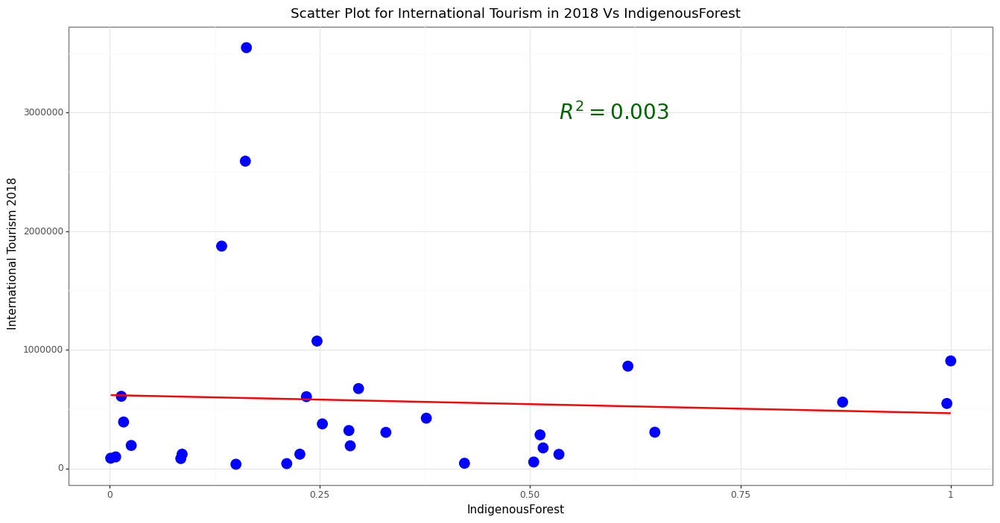

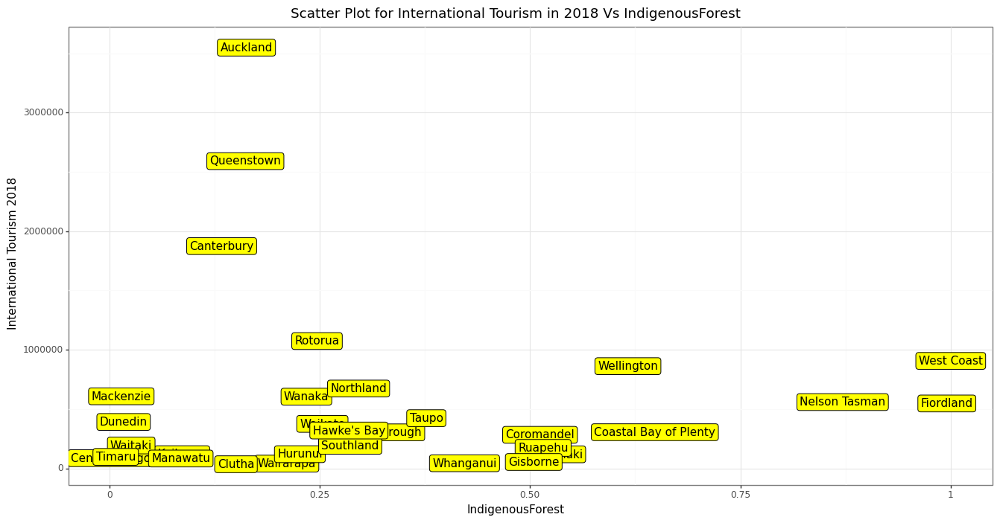

<IPython.core.display.Math object>

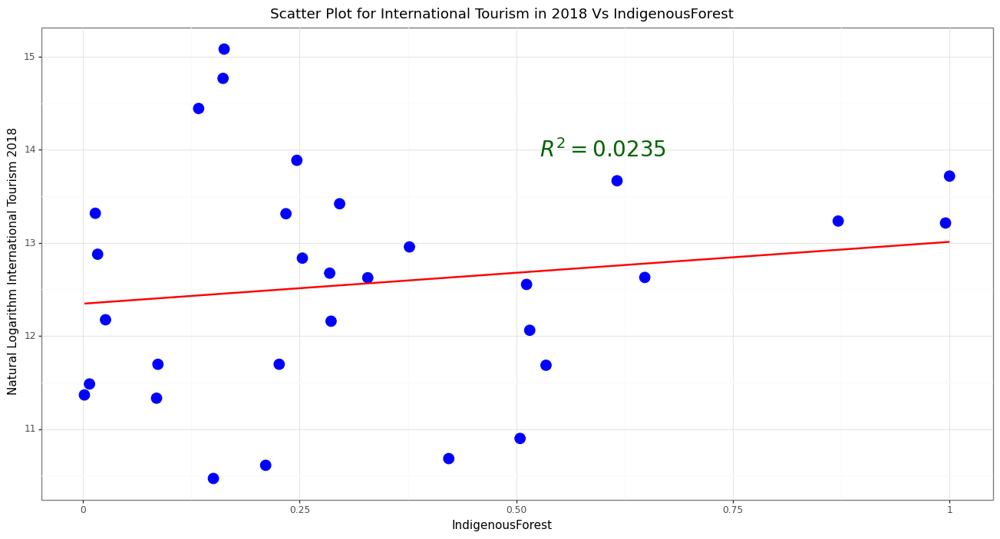

In [42]:
x3 = X.iloc[:, 3].values.reshape(-1, 1)
Model41 = regr.fit(x3, y3)
preds41 = Model41.predict(x3)
R241 = r2_score(y3, preds41).round(4)
R241
display(Math(r'R^2_{{Model}} = {}'.format(R241)))

P1 = (ggplot(dat3, aes(x = 'IndigenousForest', y = "y3")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs IndigenousForest", 
y = 'International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 3000000, label = r"$R^2 = 0.003$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P1)

## create label plot

P = (ggplot(dat3, aes(x = 'IndigenousForest', y = "y3")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs IndigenousForest", 
y = 'International Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model42 = regr.fit(x3, y3_log)
preds42 = Model32.predict(x3)
R242 = r2_score(y3_log, preds42).round(4)
R242
display(Math(r'R^2_{{Model}} = {}'.format(R242)))

P2 = (ggplot(dat3, aes(x = 'IndigenousForest', y = "y3_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs IndigenousForest", 
y = 'Natural Logarithm International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14, label = r"$R^2 = 0.0235$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>


#### For Water

<IPython.core.display.Math object>

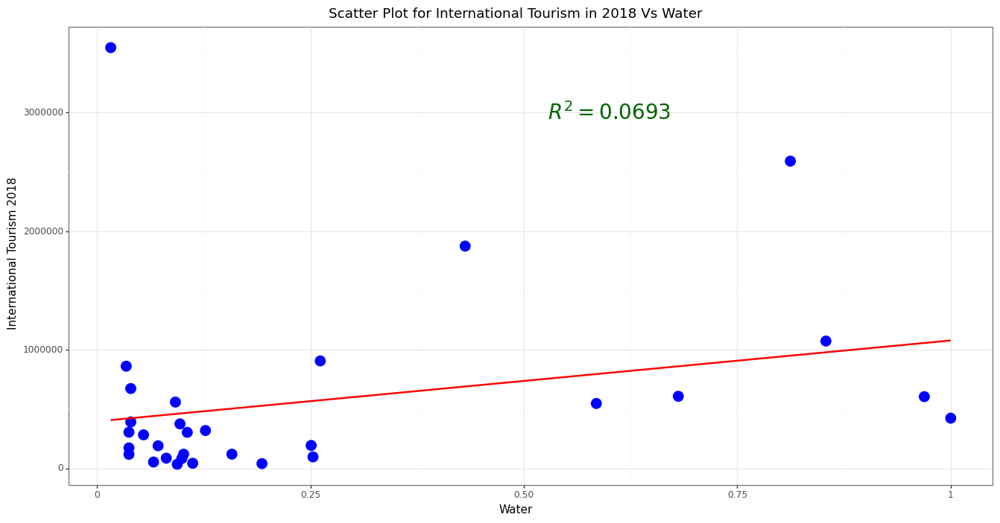

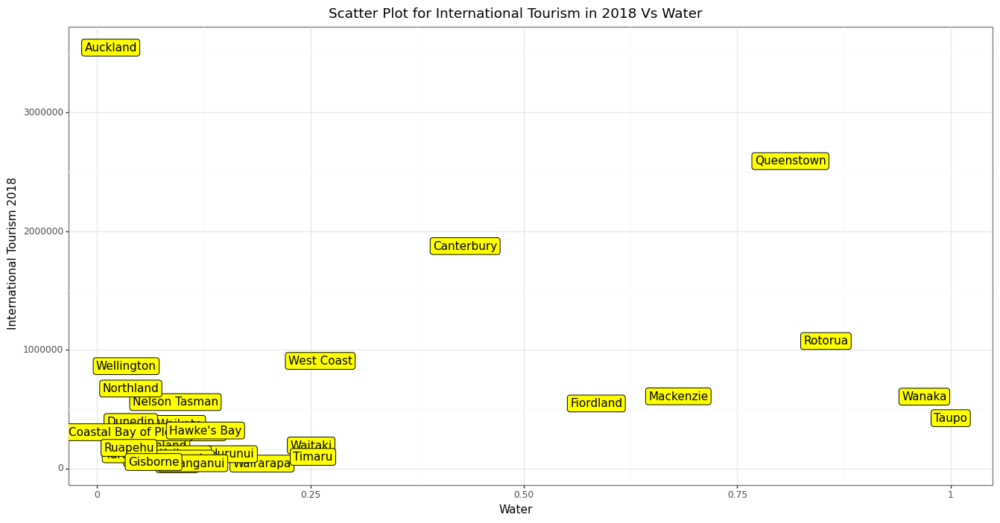

<IPython.core.display.Math object>

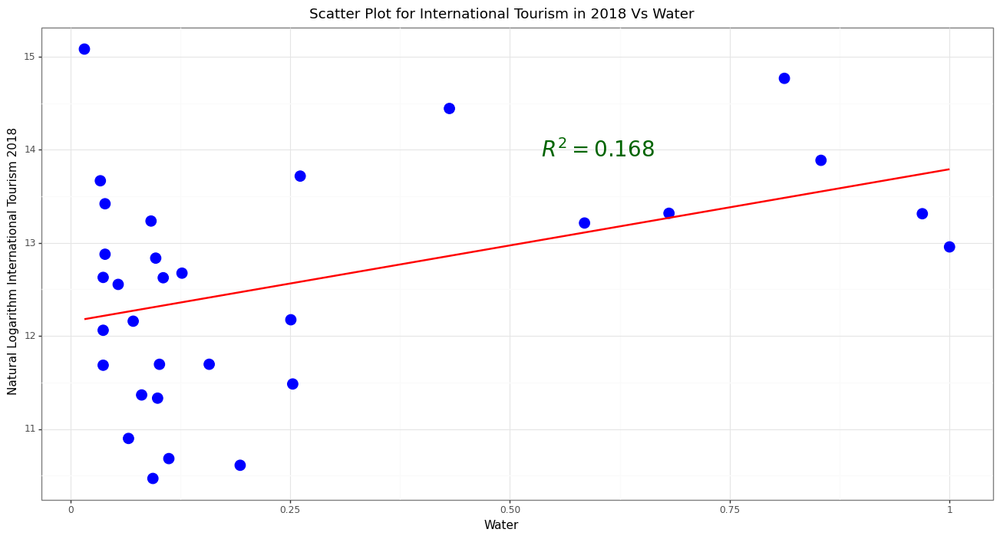

In [43]:
x4 = X.iloc[:, 4].values.reshape(-1, 1)
Model51 = regr.fit(x4, y3)
preds51 = Model51.predict(x4)
R251 = r2_score(y3, preds51).round(4)
R251
display(Math(r'R^2_{{Model}} = {}'.format(R251)))


P1 = (ggplot(dat3, aes(x = 'Water', y = "y3")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Water", 
y = 'International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 3000000, label = r"$R^2 = 0.0693$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot

P = (ggplot(dat3, aes(x = 'Water', y = "y3")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Water", 
y = 'International Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model52 = regr.fit(x4, y3_log)
preds52 = Model52.predict(x4)
R252 = r2_score(y3_log, preds52).round(4)
R252
display(Math(r'R^2_{{Model}} = {}'.format(R252)))


P2 = (ggplot(dat3, aes(x = 'Water', y = "y3_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Water", 
y = 'Natural Logarithm International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14, label = r"$R^2 = 0.168$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>


#### For ExoticForest

<IPython.core.display.Math object>

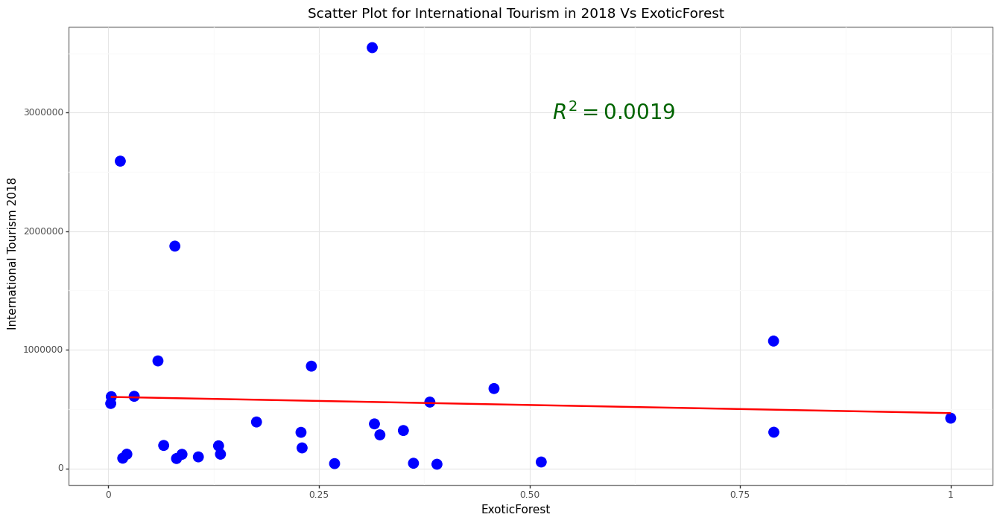

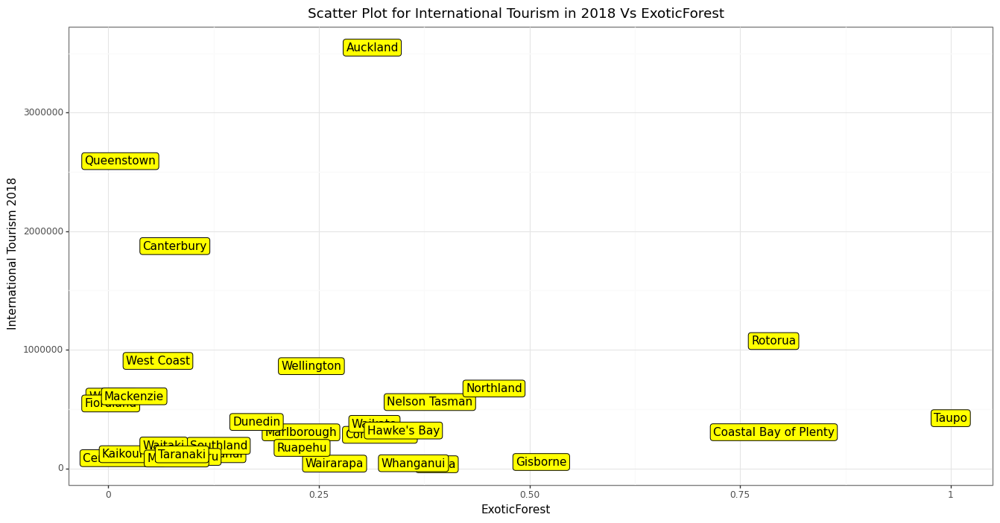

<IPython.core.display.Math object>

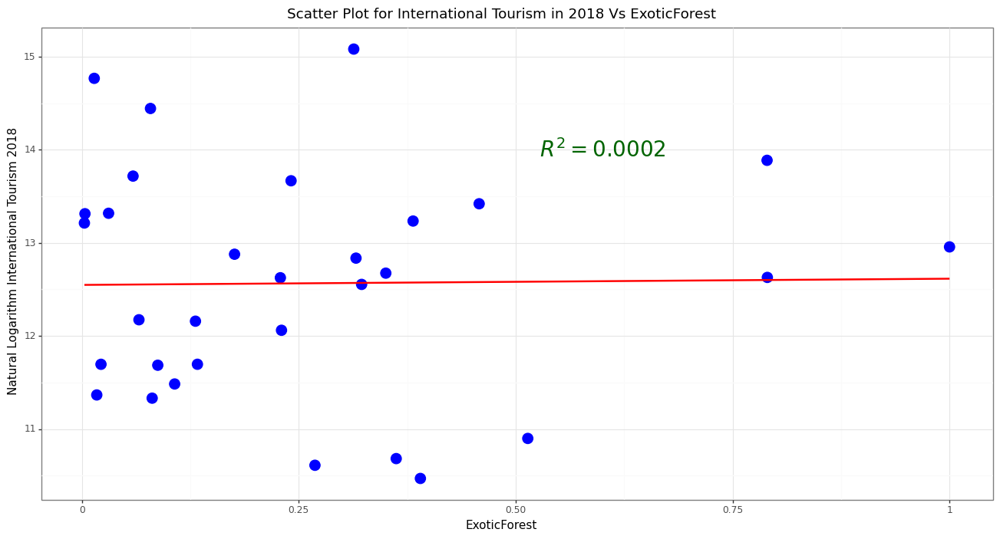

In [44]:
x5 = X.iloc[:, 5].values.reshape(-1, 1)
Model61 = regr.fit(x5, y3)
preds61 = Model61.predict(x5)
R261 = r2_score(y3, preds61).round(4)
R261
display(Math(r'R^2_{{Model}} = {}'.format(R261)))



P1 = (ggplot(dat3, aes(x = 'ExoticForest', y = "y3")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs ExoticForest", 
y = 'International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 3000000, label = r"$R^2 = 0.0019$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)
## create label plot


P = (ggplot(dat3, aes(x = 'ExoticForest', y = "y3")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs ExoticForest", 
y = 'International Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model62 = regr.fit(x5, y3_log)
preds62 = Model62.predict(x5)
R262 = r2_score(y3_log, preds62).round(4)
R262
display(Math(r'R^2_{{Model}} = {}'.format(R262)))

P2 = (ggplot(dat3, aes(x = 'ExoticForest', y = "y3_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs ExoticForest", 
y = 'Natural Logarithm International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14, label = r"$R^2 = 0.0002$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))


print(P2)

<br><br><hr><hr><br><br>



#### For CoastView

<IPython.core.display.Math object>

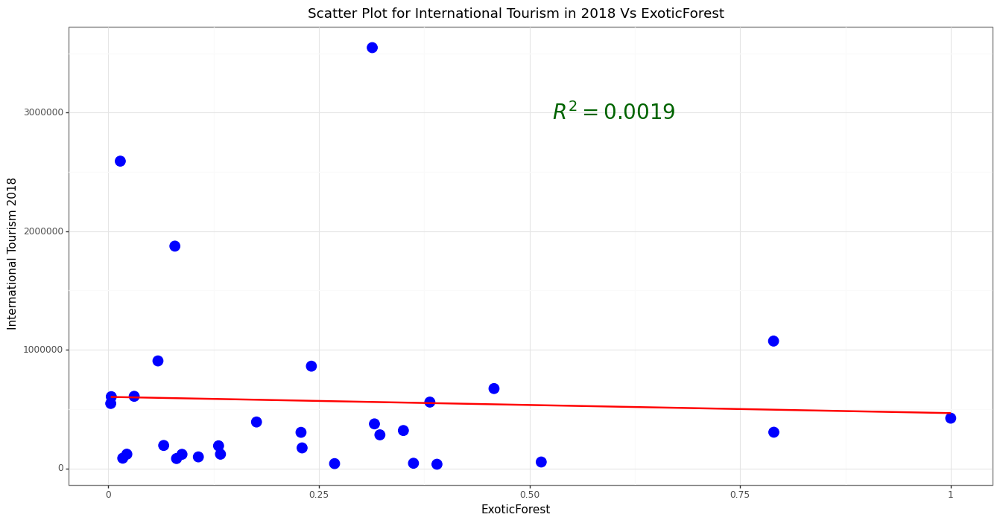

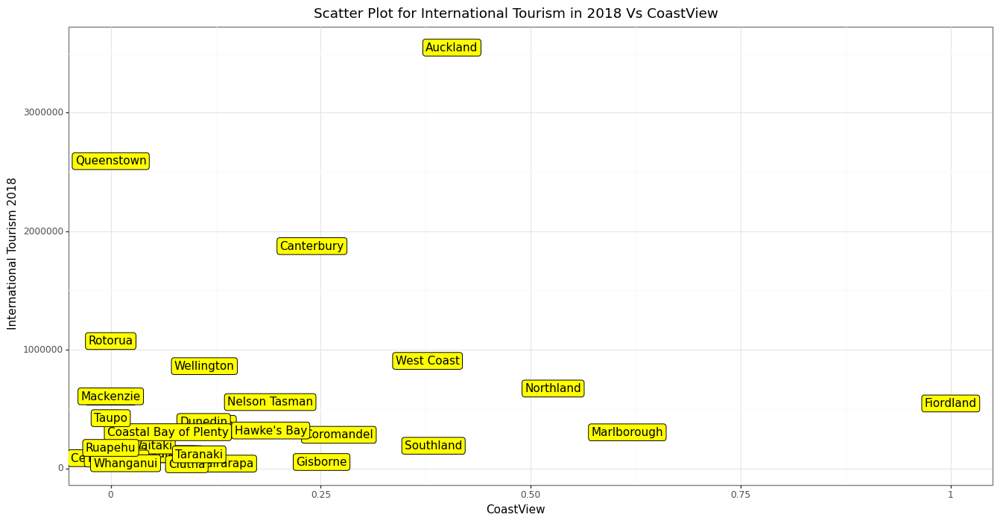

<IPython.core.display.Math object>

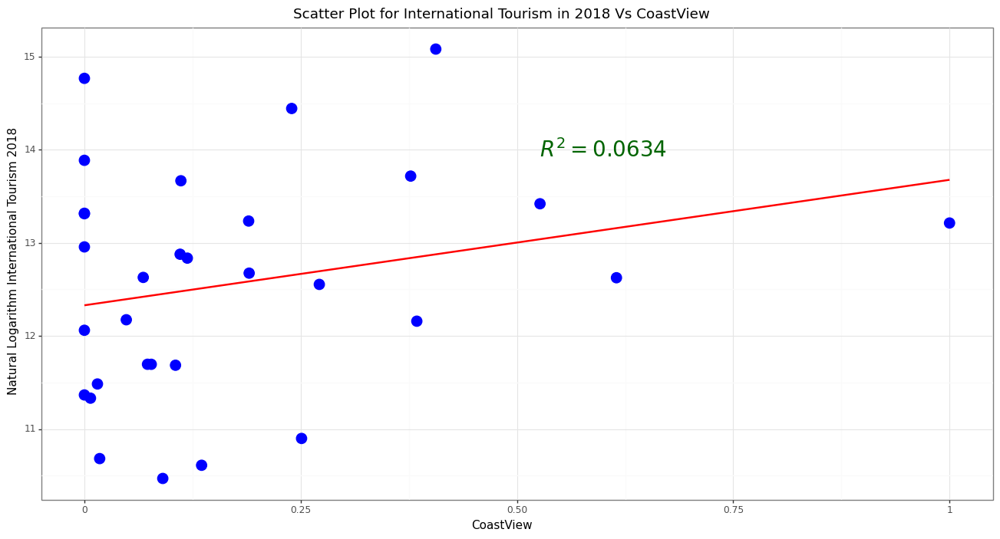

In [45]:
x6 = X.iloc[:, 6].values.reshape(-1, 1)
Model71 = regr.fit(x6, y3)
preds71 = Model71.predict(x6)
R271 = r2_score(y3, preds71).round(4)
R271
display(Math(r'R^2_{{Model}} = {}'.format(R271)))


p1 = (ggplot(dat3, aes(x = 'CoastView', y = "y3")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs CoastView", 
y = 'International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 3000000, label = r"$R^2 = 0.0243$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)
## create label plot


P = (ggplot(dat3, aes(x = 'CoastView', y = "y3")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs CoastView", 
y = 'International Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model72 = regr.fit(x6, y3_log)
preds72 = Model72.predict(x6)
R272 = r2_score(y3_log, preds72).round(4)
R272
display(Math(r'R^2_{{Model}} = {}'.format(R272)))


P2 = (ggplot(dat3, aes(x = 'CoastView', y = "y3_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs CoastView", 
y = 'Natural Logarithm International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14 , label = r"$R^2 = 0.0634$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))


print(P2)

<br><br><hr><hr><br><br>


#### For DistanceToAirport

<IPython.core.display.Math object>

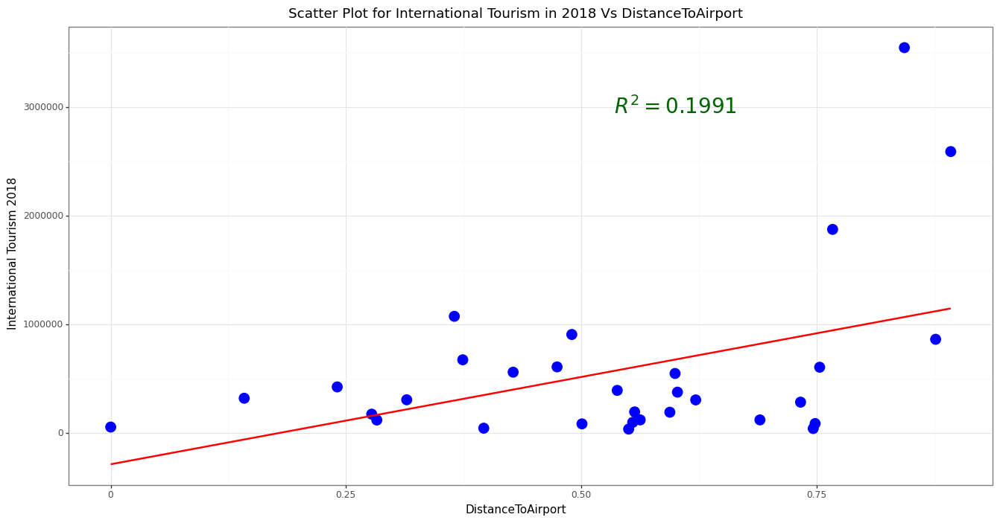

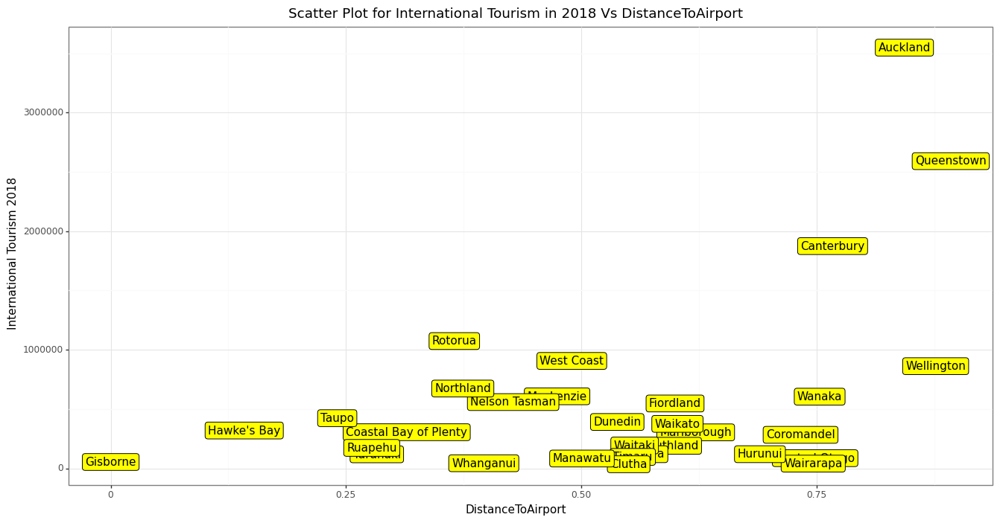

<IPython.core.display.Math object>

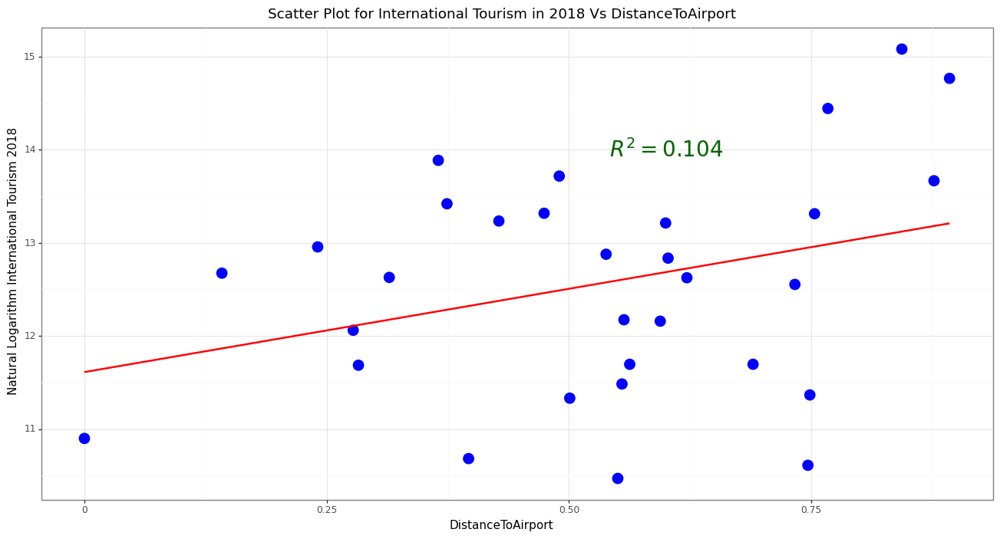

In [46]:
x7 = X.iloc[:, 7].values.reshape(-1, 1)
Model81 = regr.fit(x7, y3)
preds81 = Model81.predict(x7)
R281 = r2_score(y3, preds81).round(4)
R281
display(Math(r'R^2_{{Model}} = {}'.format(R281)))


P1 = (ggplot(dat3, aes(x = 'DistanceToAirport', y = "y3")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs DistanceToAirport", 
y = 'International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 3000000, label = r"$R^2 = 0.1991$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)
## create label plot


P = (ggplot(dat3, aes(x = 'DistanceToAirport', y = "y3")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs DistanceToAirport", 
y = 'International Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model82 = regr.fit(x7, y3_log)
preds82 = Model82.predict(x7)
R282 = r2_score(y3_log, preds82).round(4)
R282
display(Math(r'R^2_{{Model}} = {}'.format(R282)))


P2 = (ggplot(dat3, aes(x = 'DistanceToAirport', y = "y3_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs DistanceToAirport", 
y = 'Natural Logarithm International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14 , label = r"$R^2 = 0.104$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>


#### For Wetland

<IPython.core.display.Math object>

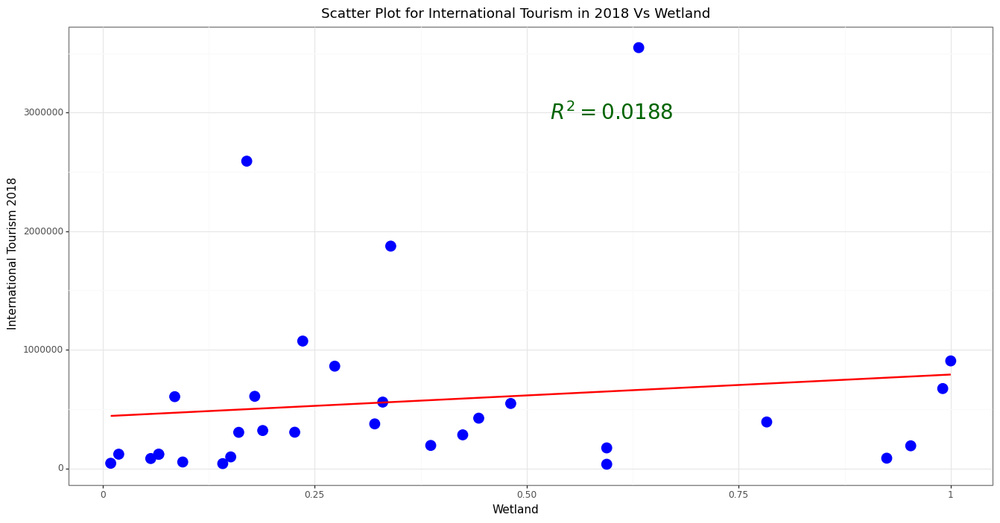

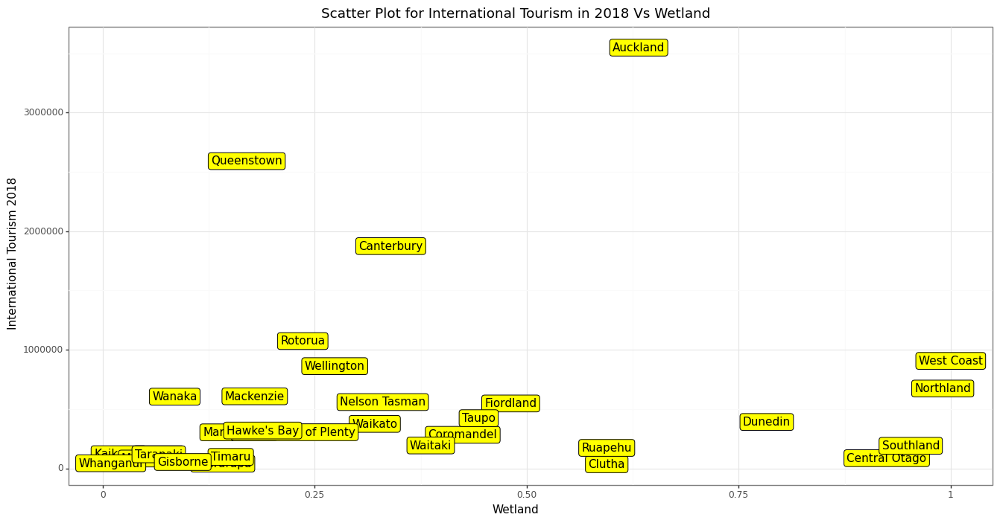

<IPython.core.display.Math object>

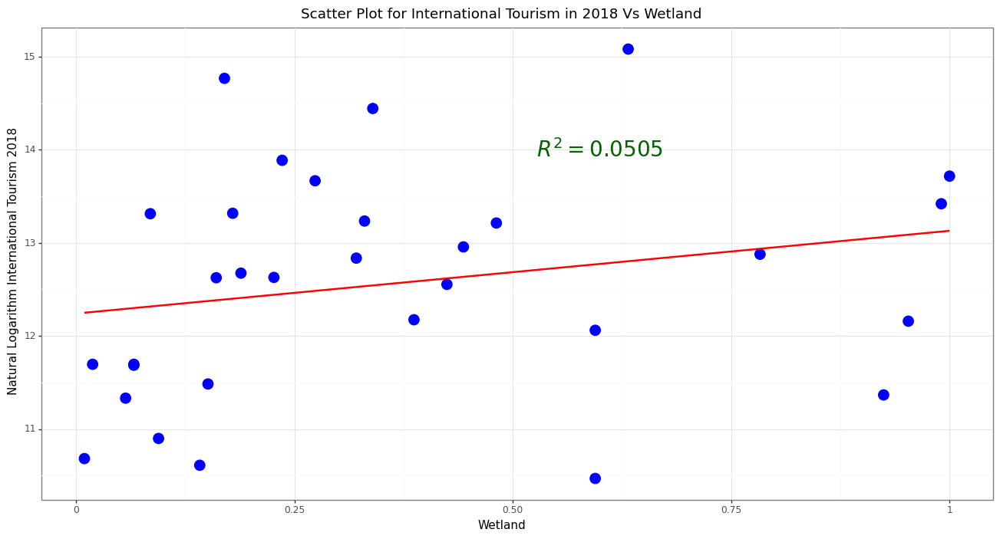

In [47]:
x8 = X.iloc[:, 8].values.reshape(-1, 1)
Model91 = regr.fit(x8, y3)
preds91 = Model91.predict(x8)
R291 = r2_score(y3, preds91).round(4)
R291
display(Math(r'R^2_{{Model}} = {}'.format(R291)))


P1 = (ggplot(dat3, aes(x = 'Wetland', y = "y3")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Wetland", 
y = 'International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 3000000, label = r"$R^2 = 0.0188$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)
## create label plot


P = (ggplot(dat3, aes(x = 'Wetland', y = "y3")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Wetland", 
y = 'International Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model92 = regr.fit(x8, y3_log)
preds92 = Model82.predict(x8)
R292 = r2_score(y3_log, preds92).round(4)
R292
display(Math(r'R^2_{{Model}} = {}'.format(R292)))

P2 = (ggplot(dat3, aes(x = 'Wetland', y = "y3_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Wetland", 
y = 'Natural Logarithm International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14, label = r"$R^2 = 0.0505$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>


#### For ProtectedAreas



<IPython.core.display.Math object>

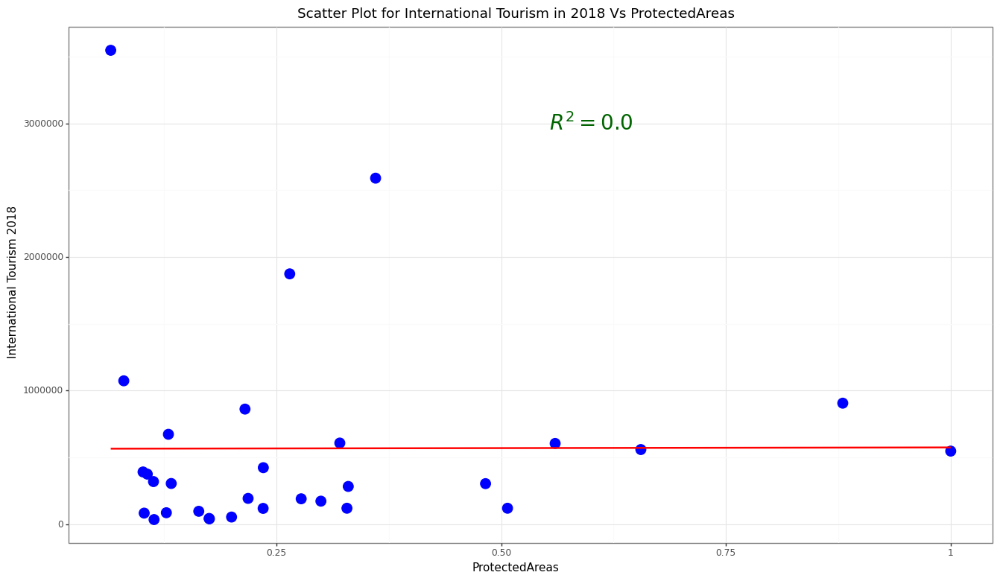

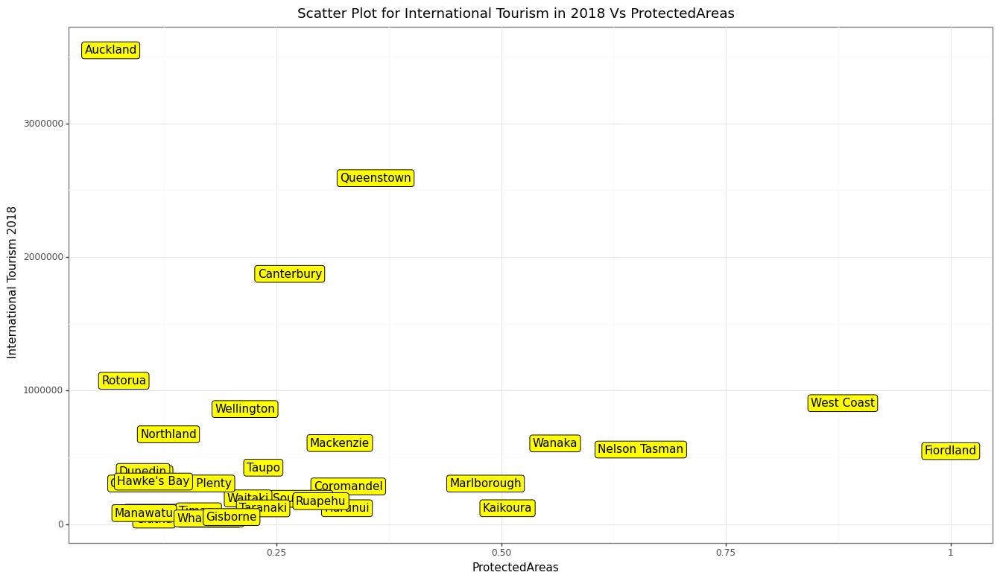

<IPython.core.display.Math object>

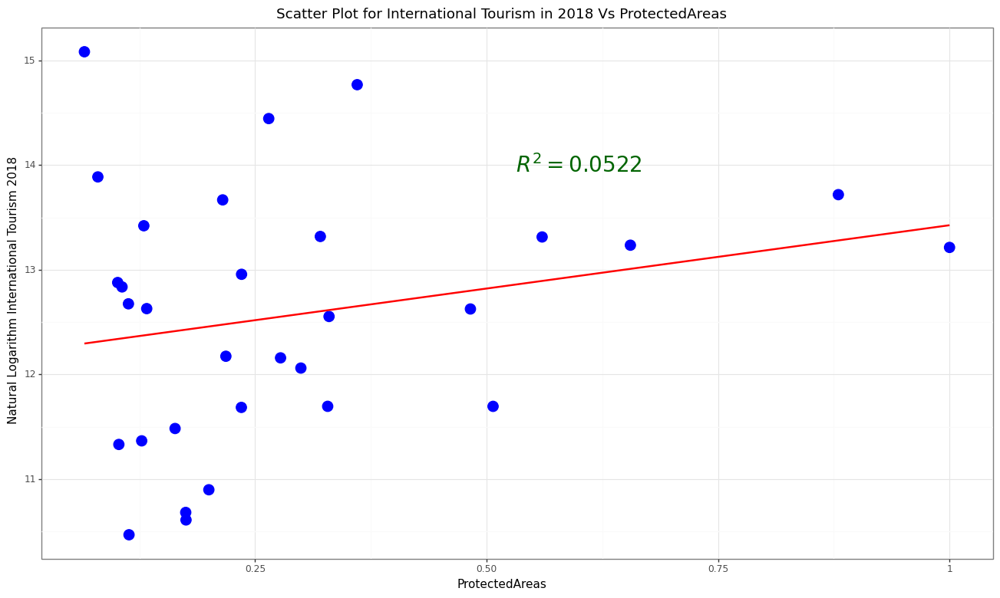

In [48]:
x9 = X.iloc[:, 9].values.reshape(-1, 1)
Model91 = regr.fit(x9, y3)
preds91 = Model91.predict(x9)
R291 = r2_score(y3, preds91).round(4)
R291
display(Math(r'R^2_{{Model}} = {}'.format(R291)))

P1 = (ggplot(dat3, aes(x = 'ProtectedAreas', y = "y3")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs ProtectedAreas", 
y = 'International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 3000000, label = r"$R^2 = 0.0$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 9)))

print(P1)
## create label plot


P = (ggplot(dat3, aes(x = 'ProtectedAreas', y = "y3")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs ProtectedAreas", 
y = 'International Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 9)))

print(P)

#### get logarithm of y


Model92 = regr.fit(x9, y3_log)
preds92 = Model92.predict(x9)
R292 = r2_score(y3_log, preds92).round(4)
R292
display(Math(r'R^2_{{Model}} = {}'.format(R292)))

P2 = (ggplot(dat3, aes(x = 'ProtectedAreas', y = "y3_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs ProtectedAreas", 
y = 'Natural Logarithm International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14 , label = r"$R^2 = 0.0522$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 9)))

print(P2)

<br><br>
<hr><hr>
<br><br>

#### For Grassland

<IPython.core.display.Math object>

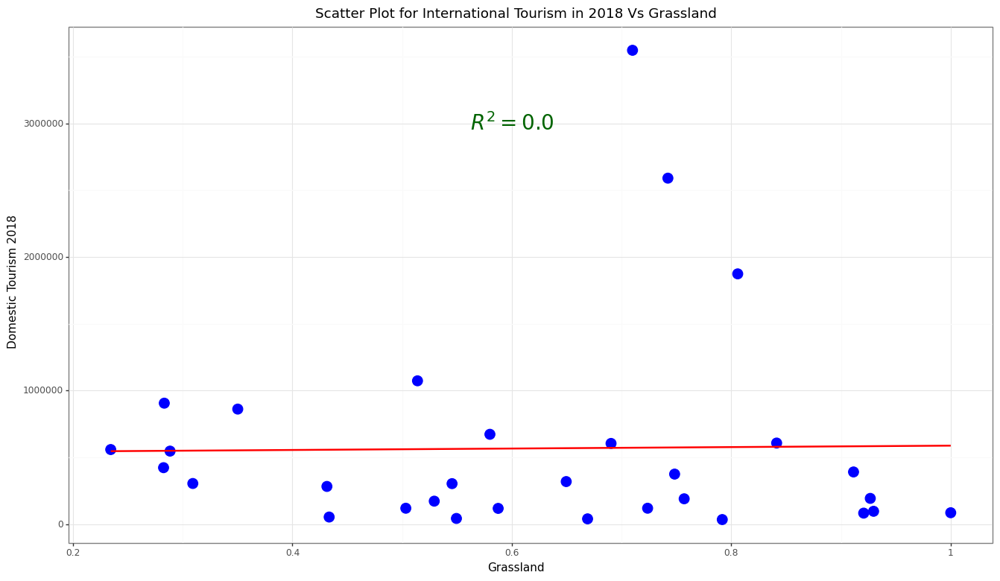

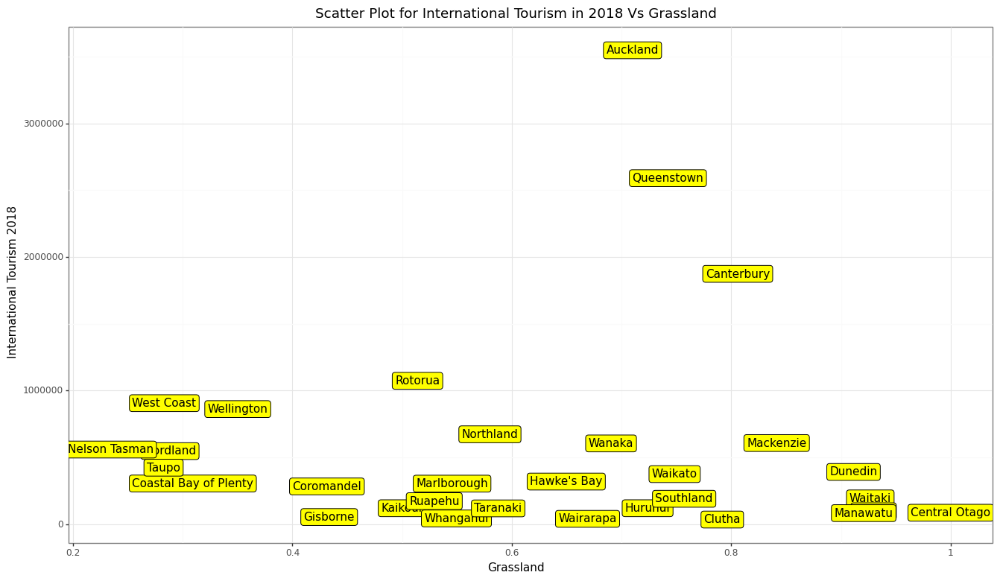

<IPython.core.display.Math object>

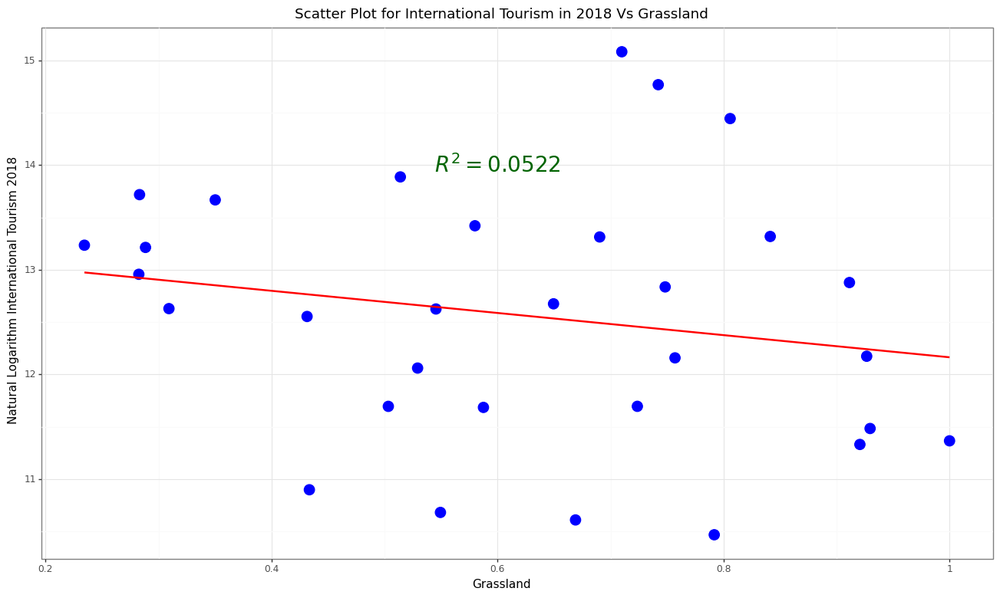

In [49]:
xx9 = X.iloc[:, 9].values.reshape(-1, 1)
Model91 = regr.fit(xx9, y3)
preds91 = Model91.predict(xx9)
R291 = r2_score(y3, preds91).round(4)
R291
display(Math(r'R^2_{{Model}} = {}'.format(R291)))

P1 = (ggplot(dat3, aes(x = 'Grassland', y = "y3")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Grassland", 
y = 'Domestic Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 3000000, label = r"$R^2 = 0.0$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 9)))

print(P1)
## create label plot


P = (ggplot(dat3, aes(x = 'Grassland', y = "y3")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Grassland", 
y = 'International Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 9)))

print(P)
#### get logarithm of y


Model92 = regr.fit(xx9, y3_log)
preds92 = Model92.predict(xx9)
R292 = r2_score(y3_log, preds92).round(4)
R292
display(Math(r'R^2_{{Model}} = {}'.format(R292)))


P2 = (ggplot(dat3, aes(x = 'Grassland', y = "y3_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2018 Vs Grassland", 
y = 'Natural Logarithm International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14 , label = r"$R^2 = 0.0522$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 9)))

print(P2)

<br><br><hr><hr><br><br>


#### Define a Model With all Variables

In [50]:
## without scaling
X2 = sm.add_constant(X)

model = sm.OLS(y3, X2).fit()

print_model = model.summary()
print(print_model)

## with scaling
# xx = scaler.fit_transform(X)

# xx2 = sm.add_constant(xx)

# model2 = sm.OLS(y3, xx2).fit()
# print_model2 = model2.summary()
# print(print_model2)


############################### y ---> log(y)

## with scaling

model3 = sm.OLS(y3_log, X2).fit()
print_model3 = model3.summary()
print(print_model3)

                            OLS Regression Results                            
Dep. Variable:       International_18   R-squared:                       0.573
Model:                            OLS   Adj. R-squared:                  0.326
Method:                 Least Squares   F-statistic:                     2.321
Date:                Sat, 08 Jul 2023   Prob (F-statistic):             0.0516
Time:                        10:51:36   Log-Likelihood:                -450.94
No. Observations:                  31   AIC:                             925.9
Df Residuals:                      19   BIC:                             943.1
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const               7.54e+05   2.03e+0

<br><br><hr><hr><br><br>


#### get correlation Matrix between variables


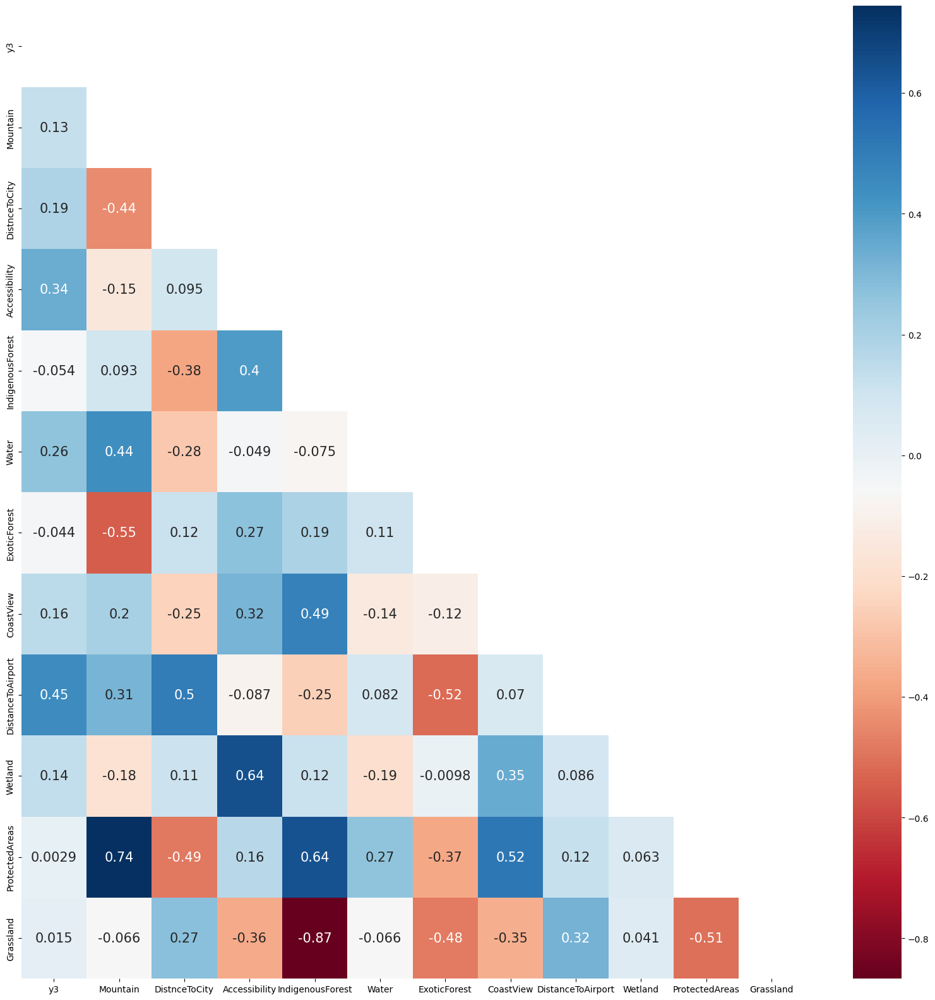

<Figure size 2000x2000 with 0 Axes>

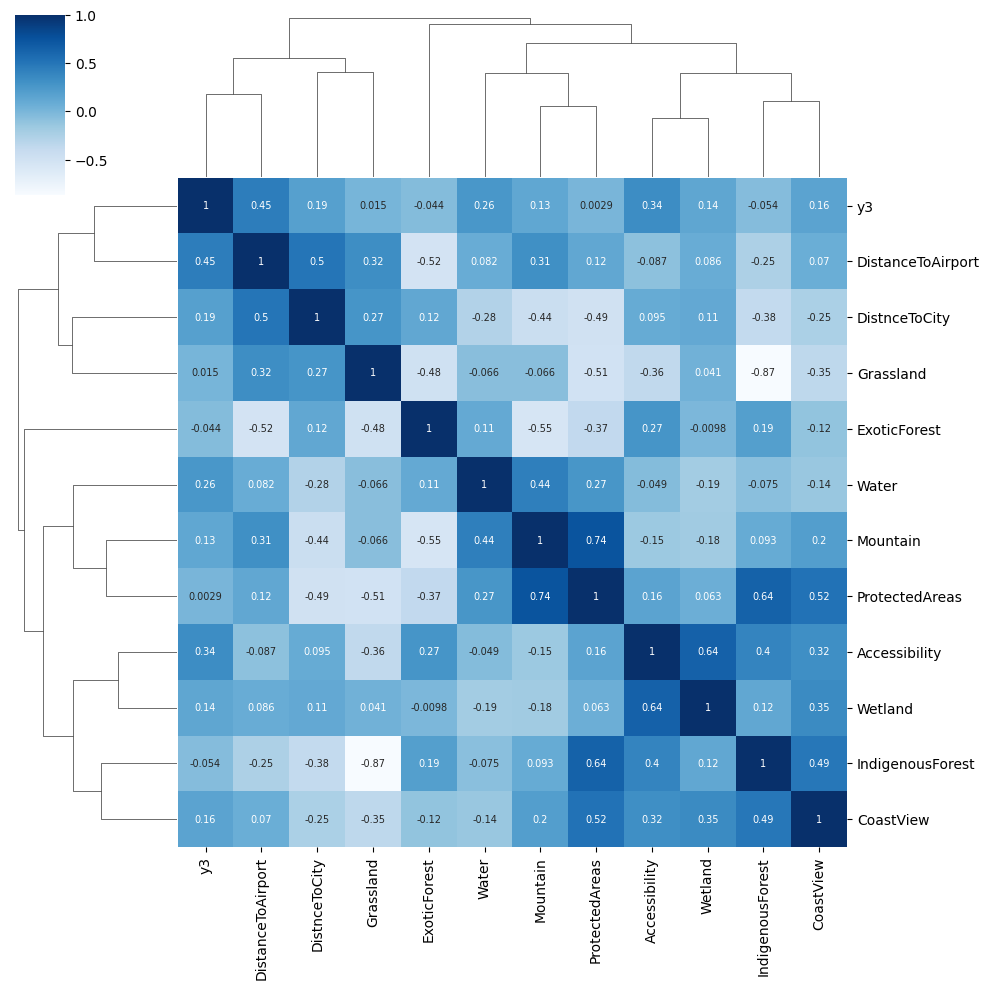

<Figure size 2000x2000 with 0 Axes>

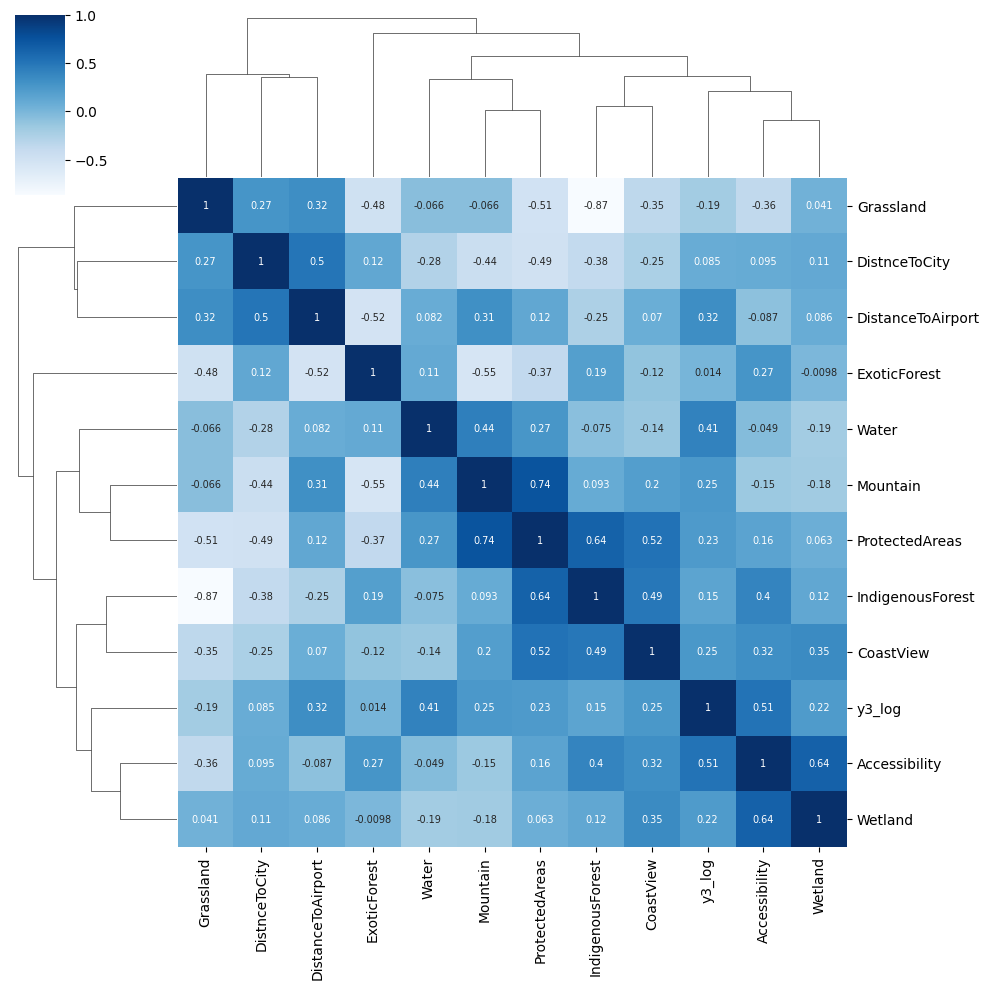

In [51]:
dat3_corr = dat3.drop(['y3_log', 'RTO_Names'], axis = 1)
dat3_corr.columns
dat3_corrr = dat3_corr.corr()



matrix = np.triu(dat3_corrr)
plt.figure(figsize=(20, 20), facecolor='w', edgecolor='k')
sns.heatmap(dat3_corrr, annot = True, annot_kws = {"size" : 15}, mask = matrix, cmap="RdBu")
plt.show()

plt.figure(figsize=(20, 20), facecolor='w', edgecolor='k')
cmap = sns.diverging_palette(h_neg=210, h_pos=350, s=90, l=30, as_cmap=True)

sns.clustermap(data = dat3_corrr, annot = True, cmap = "Blues", 
annot_kws={"size": 7})
plt.show()




dat3_corr_2 = dat3.drop(['y3', 'RTO_Names'], axis = 1)
dat3_corr_2.columns
dat3_corrr_2 = dat3_corr_2.corr()

plt.figure(figsize=(20, 20), facecolor='w', edgecolor='k')
cmap = sns.diverging_palette(h_neg=210, h_pos=350, s=90, l=30, as_cmap=True)

sns.clustermap(data = dat3_corrr_2, annot = True, cmap = "Blues", 
annot_kws={"size": 7})
plt.show()

<br><br><hr><hr><br><br>




In [52]:
X_new = X.drop(['Grassland' ,'DistanceToAirport' ], axis = 1)

temp1 = X_new.columns
temp1
# xx = scaler.fit_transform(X_new)
# xx = pd.DataFrame(xx, columns = temp1, index = dat_org.index)
model = sm.OLS(y3, X_new).fit()

print_model = model.summary()
print(print_model)


############################### y ---> log(y)

## with scaling
model3 = sm.OLS(y3_log, X_new).fit()
print_model3 = model3.summary()
print(print_model3)

                                 OLS Regression Results                                
Dep. Variable:       International_18   R-squared (uncentered):                   0.666
Model:                            OLS   Adj. R-squared (uncentered):              0.529
Method:                 Least Squares   F-statistic:                              4.874
Date:                Sat, 08 Jul 2023   Prob (F-statistic):                     0.00117
Time:                        10:51:37   Log-Likelihood:                         -453.89
No. Observations:                  31   AIC:                                      925.8
Df Residuals:                      22   BIC:                                      938.7
Df Model:                           9                                                  
Covariance Type:            nonrobust                                                  
                       coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

<br><br><hr><hr><hr><hr><br><br>


## International Tourism 2021


#### define data for International Tourism in 2021

In [53]:
X_explain = X

In [54]:
y4 = dat_org['International_21']
y4_log = np.log(y4)
dat4 = pd.concat([y4, X_explain], axis = 1, join = "outer")
dat4.index = dat_org['RTO_Name']
dat4.columns =  ['y4', 'Mountain', 
'DistnceToCity', 'Accessibility', 
'IndigenousForest',  'Water', 
'ExoticForest',  'CoastView', 'DistanceToAirport', 'Wetland', 'ProtectedAreas', 'Grassland']
dat4['RTO_Names']= dat_org['RTO_Name'].values
dat4['y4_log'] = y4_log.values
dat4
dat4.columns

Index(['y4', 'Mountain', 'DistnceToCity', 'Accessibility', 'IndigenousForest',
       'Water', 'ExoticForest', 'CoastView', 'DistanceToAirport', 'Wetland',
       'ProtectedAreas', 'Grassland', 'RTO_Names', 'y4_log'],
      dtype='object')

<br><br><hr><hr><br><br>


#### For Mountain

<IPython.core.display.Math object>

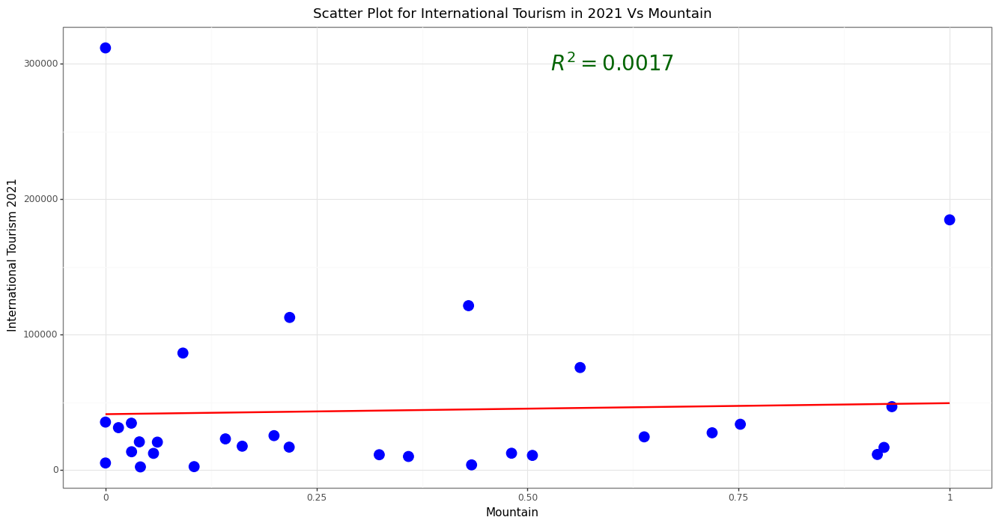

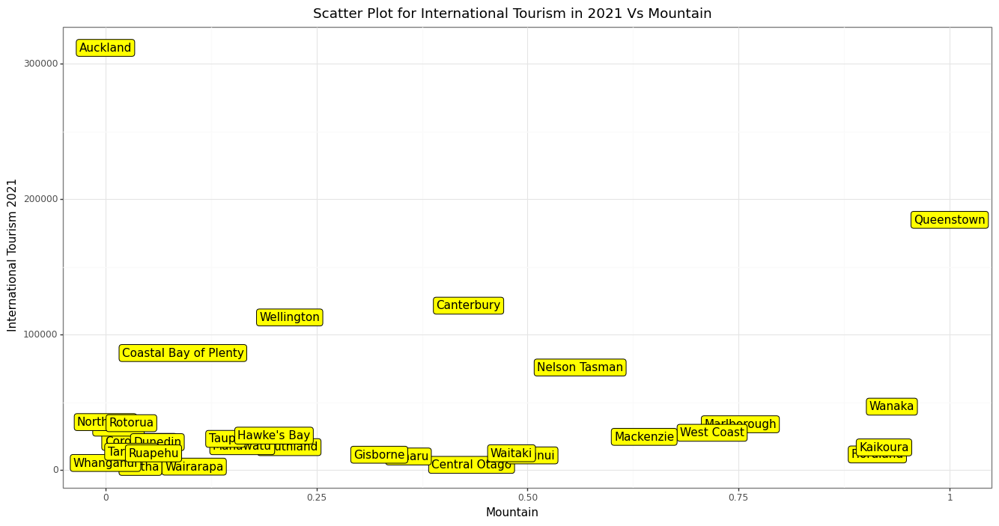

<IPython.core.display.Math object>

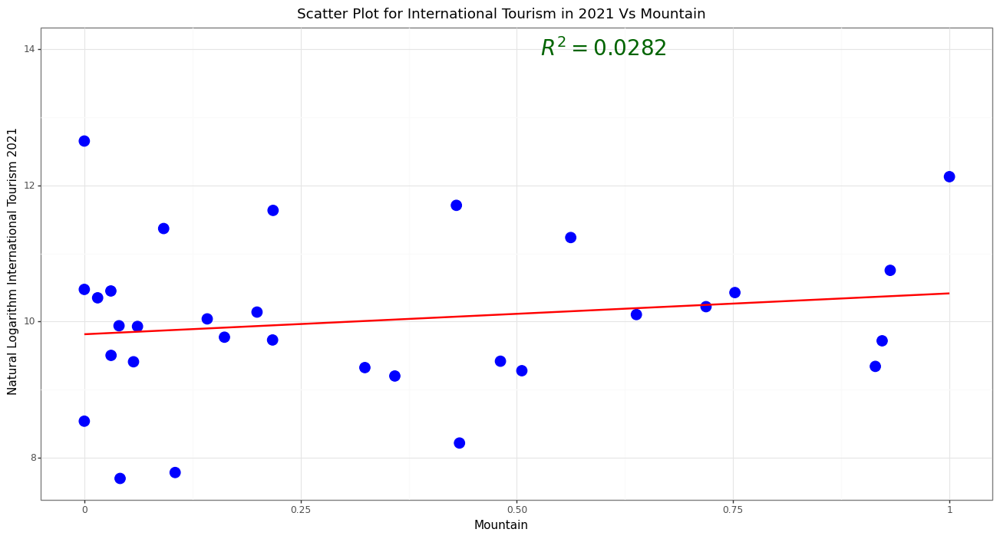

In [55]:
x = X.iloc[:, 0].values.reshape(-1, 1)
Model1 = regr.fit(x, y4)
preds = Model1.predict(x)
R2 = r2_score(y4, preds).round(4)
R2
display(Math(r'R^2_{{Model}} = {}'.format(R2)))


P1 = (ggplot(dat4, aes(x = 'Mountain', y = "y4")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Mountain", 
y = 'International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 , y = 300000, label = r"$R^2 = 0.0017$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))


print(P1)
## create label plot

P = (ggplot(dat4, aes(x = 'Mountain', y = "y4")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Mountain", 
y = 'International Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model2 = regr.fit(x, y4_log)
preds2 = Model2.predict(x)
R22 = r2_score(y4_log, preds2).round(4)
R22
display(Math(r'R^2_{{Model}} = {}'.format(R22)))


P2 = (ggplot(dat4, aes(x = 'Mountain', y = "y4_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Mountain", 
y = 'Natural Logarithm International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14, label = r"$R^2 = 0.0282$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>


#### For DistnceToCity

<IPython.core.display.Math object>

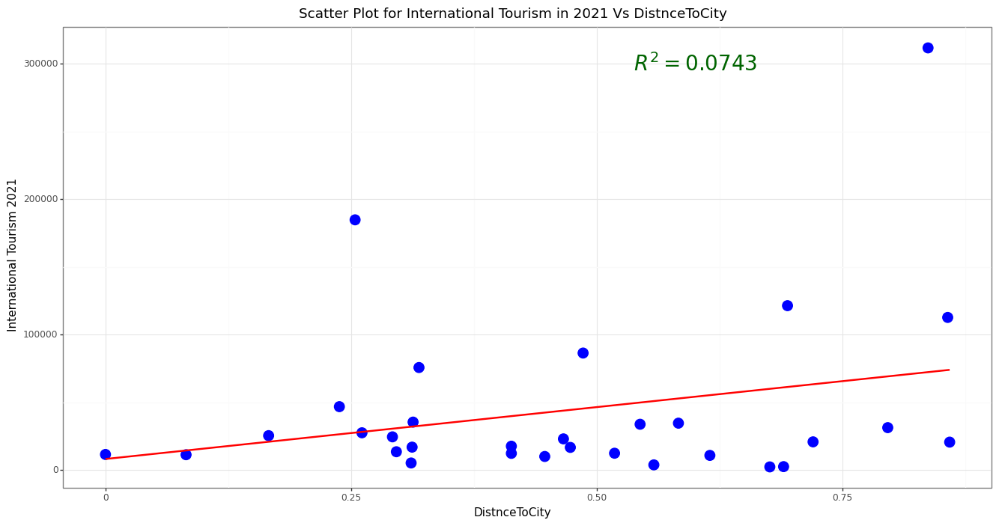

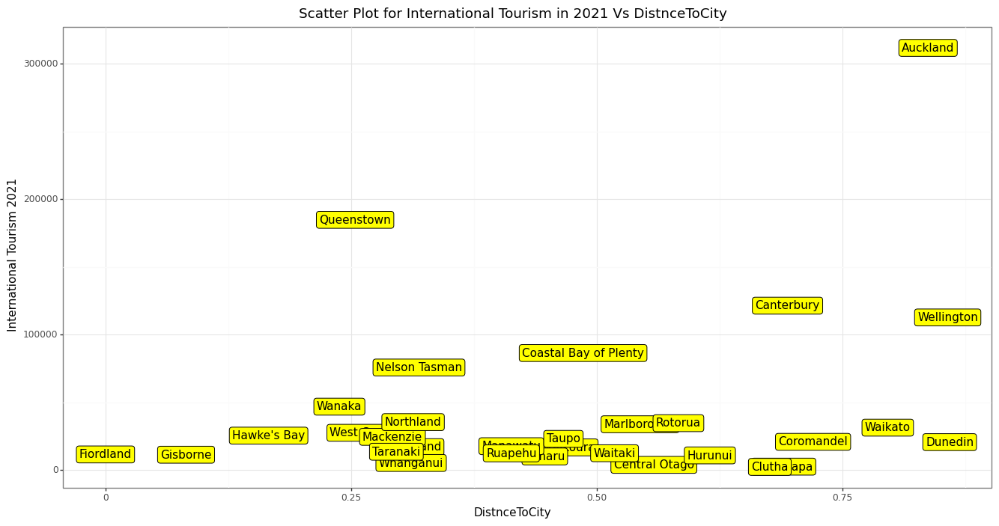

<IPython.core.display.Math object>

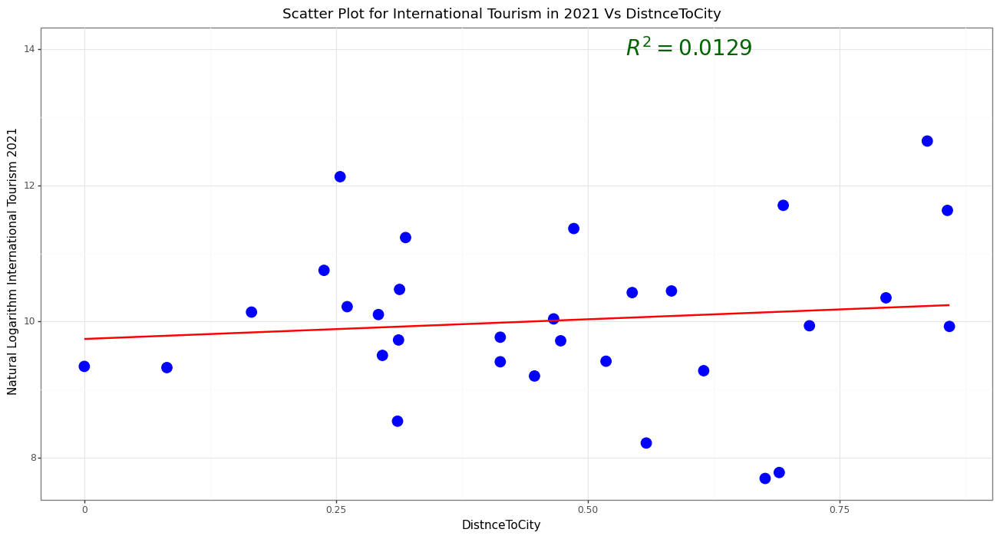

In [56]:
x1 = X.iloc[:, 1].values.reshape(-1, 1)
Model2 = regr.fit(x1, y4)
preds21 = Model2.predict(x1)
R2 = r2_score(y4, preds21).round(4)
R2
display(Math(r'R^2_{{Model}} = {}'.format(R2)))


P1 = (ggplot(dat4, aes(x = 'DistnceToCity', y = "y4")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs DistnceToCity", 
y = 'International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 , y = 300000, label = r"$R^2 = 0.0743$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot

P = (ggplot(dat4, aes(x = 'DistnceToCity', y = "y4")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs DistnceToCity", 
y = 'International Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)

#### get logarithm of y


Model22 = regr.fit(x1, y4_log)
preds22 = Model2.predict(x1)
R222 = r2_score(y4_log, preds22).round(4)
R222
display(Math(r'R^2_{{Model}} = {}'.format(R222)))

P2 = (ggplot(dat4, aes(x = 'DistnceToCity', y = "y4_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs DistnceToCity", 
y = 'Natural Logarithm International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14, label = r"$R^2 = 0.0129$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>

#### for Accessibility

<IPython.core.display.Math object>

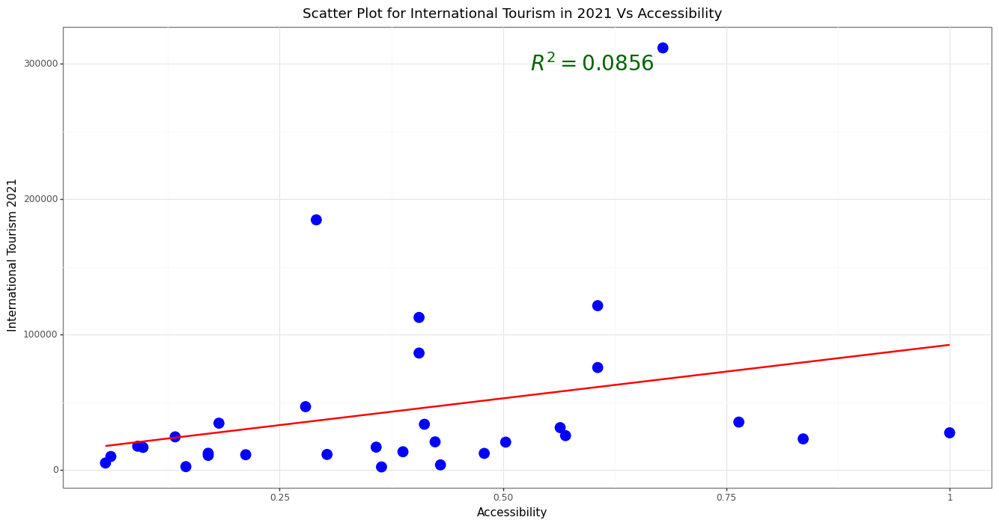

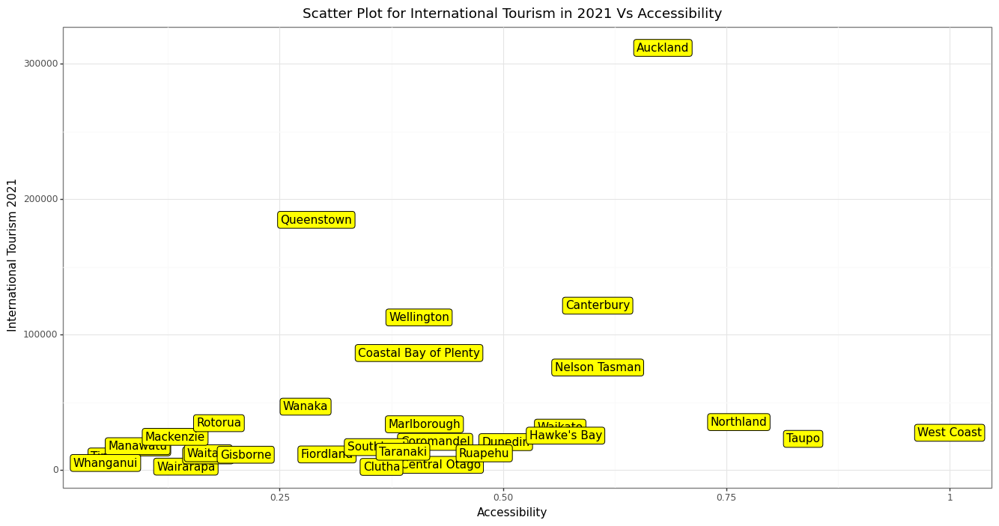

<IPython.core.display.Math object>

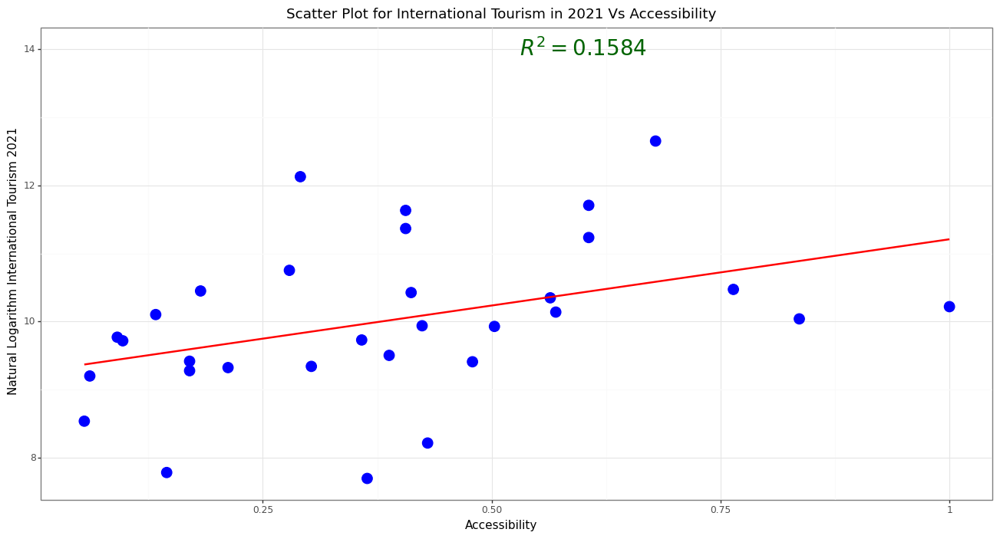

In [57]:
x2 = X.iloc[:, 2].values.reshape(-1, 1)
Model3 = regr.fit(x2, y4)
preds31 = Model3.predict(x2)
R231 = r2_score(y4, preds31).round(4)
R231
display(Math(r'R^2_{{Model}} = {}'.format(R231)))


P1 = (ggplot(dat4, aes(x = 'Accessibility', y = "y4")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Accessibility", 
y = 'International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 , y = 300000, label = r"$R^2 = 0.0856$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)
## create label plot

P = (ggplot(dat4, aes(x = 'Accessibility', y = "y4")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Accessibility", 
y = 'International Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)

#### get logarithm of y


Model32 = regr.fit(x2, y4_log)
preds32 = Model32.predict(x2)
R232 = r2_score(y4_log, preds32).round(4)
R232
display(Math(r'R^2_{{Model}} = {}'.format(R232)))


P2 = (ggplot(dat4, aes(x = 'Accessibility', y = "y4_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Accessibility", 
y = 'Natural Logarithm International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14, label = r"$R^2 = 0.1584$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>

#### for IndigenousForest

<IPython.core.display.Math object>

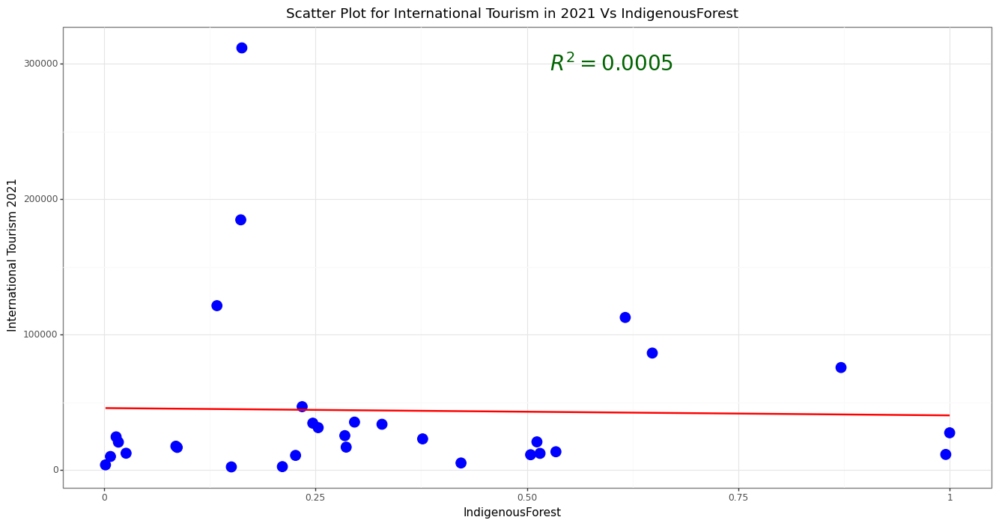

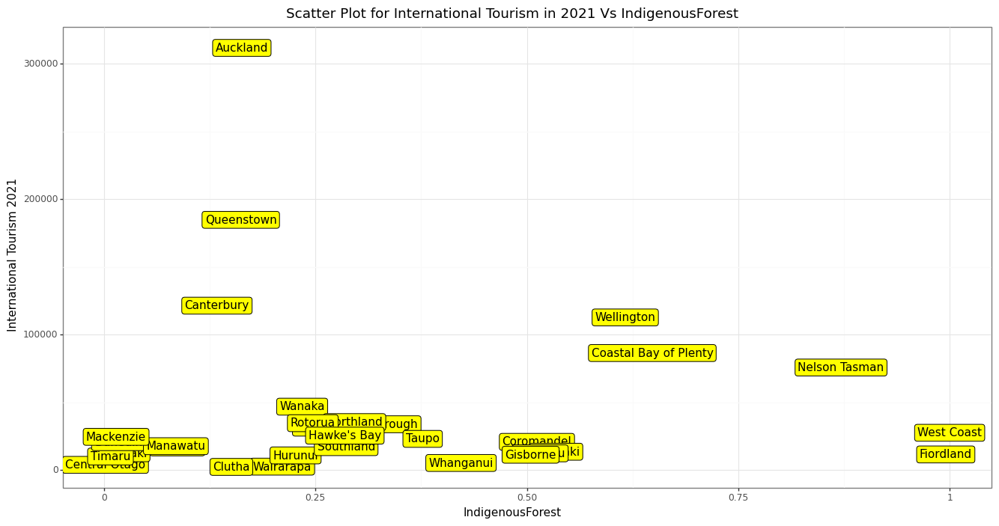

<IPython.core.display.Math object>

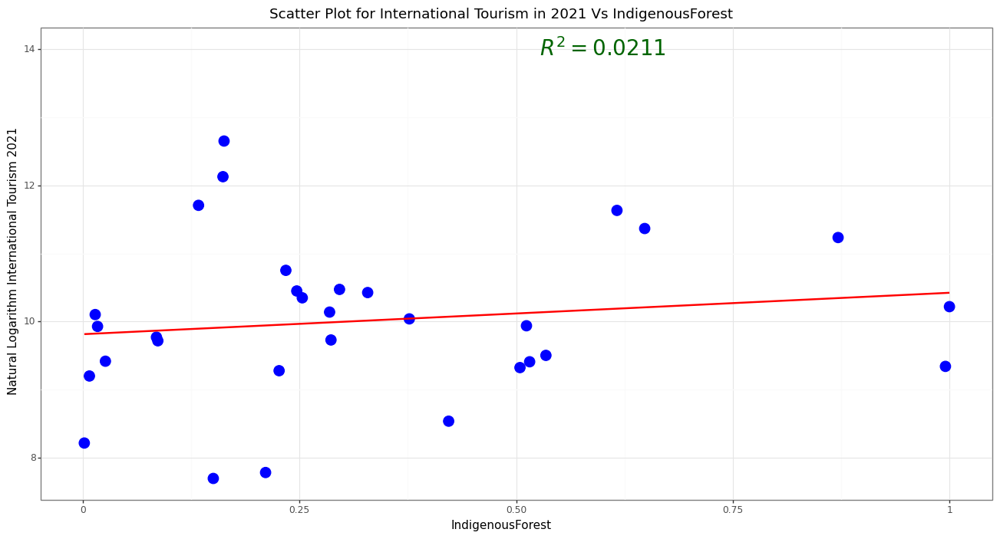

In [58]:
x3 = X.iloc[:, 3].values.reshape(-1, 1)
Model41 = regr.fit(x3, y4)
preds41 = Model41.predict(x3)
R241 = r2_score(y4, preds41).round(4)
R241
display(Math(r'R^2_{{Model}} = {}'.format(R241)))


P1 = (ggplot(dat4, aes(x = 'IndigenousForest', y = "y4")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs IndigenousForest", 
y = 'International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 300000, label = r"$R^2 = 0.0005$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot

P = (ggplot(dat4, aes(x = 'IndigenousForest', y = "y4")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs IndigenousForest", 
y = 'International Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)
#### get logarithm of y


Model42 = regr.fit(x3, y4_log)
preds42 = Model32.predict(x3)
R242 = r2_score(y4_log, preds42).round(4)
R242
display(Math(r'R^2_{{Model}} = {}'.format(R242)))


P2 = (ggplot(dat4, aes(x = 'IndigenousForest', y = "y4_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs IndigenousForest", 
y = 'Natural Logarithm International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14, label = r"$R^2 = 0.0211$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>



#### for Water

<IPython.core.display.Math object>

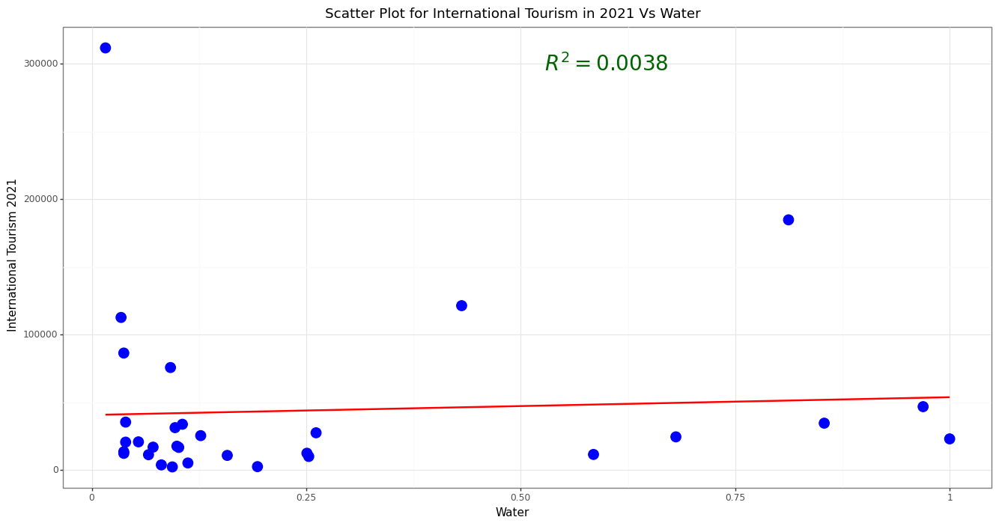

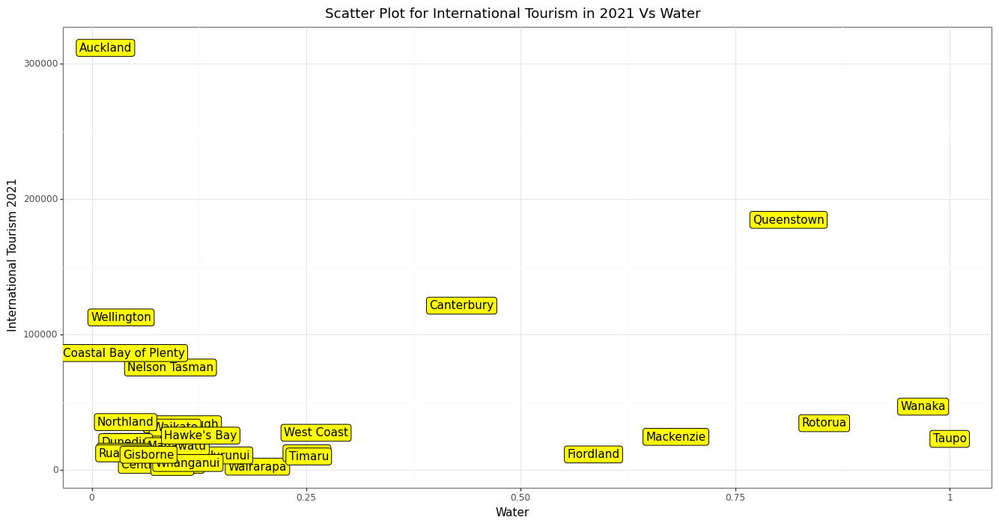

<IPython.core.display.Math object>

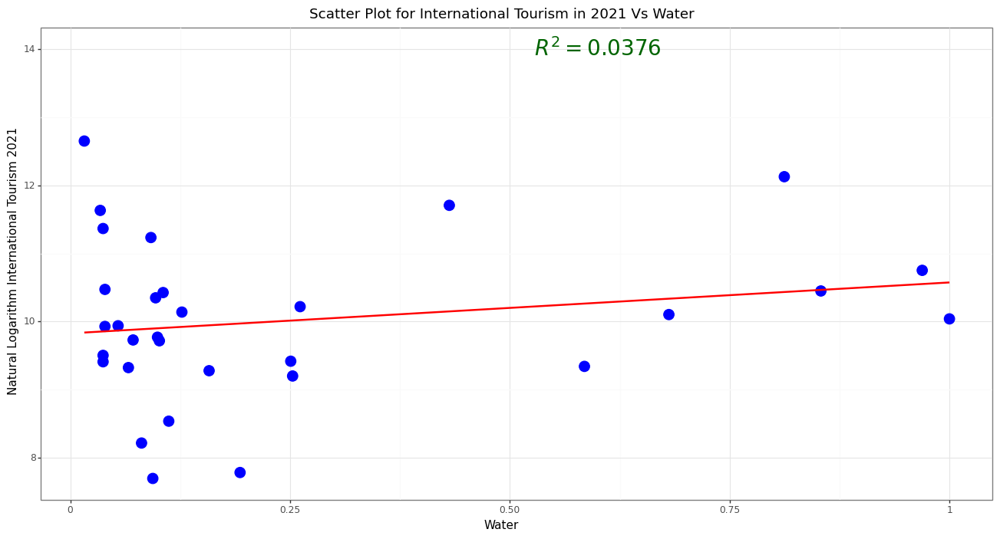

In [59]:
x4 = X.iloc[:, 4].values.reshape(-1, 1)
Model51 = regr.fit(x4, y4)
preds51 = Model51.predict(x4)
R251 = r2_score(y4, preds51).round(4)
R251
display(Math(r'R^2_{{Model}} = {}'.format(R251)))


P1 = (ggplot(dat4, aes(x = 'Water', y = "y4")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Water", 
y = 'International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 300000, label = r"$R^2 = 0.0038$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot

P = (ggplot(dat4, aes(x = 'Water', y = "y4")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Water", 
y = 'International Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)

#### get logarithm of y


Model52 = regr.fit(x4, y4_log)
preds52 = Model52.predict(x4)
R252 = r2_score(y4_log, preds52).round(4)
R252
display(Math(r'R^2_{{Model}} = {}'.format(R252)))


P2 = (ggplot(dat4, aes(x = 'Water', y = "y4_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Water", 
y = 'Natural Logarithm International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14, label = r"$R^2 = 0.0376$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>


#### for ExoticForest

<IPython.core.display.Math object>

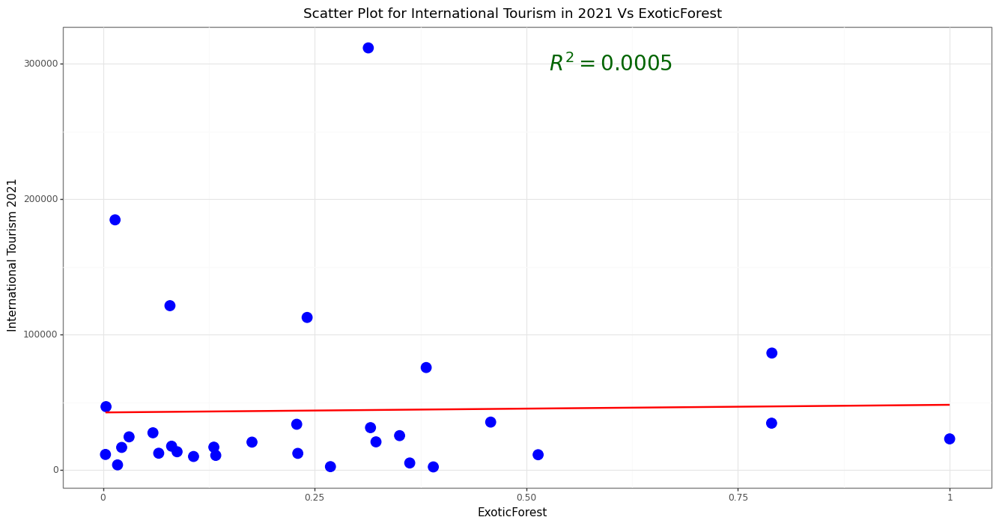

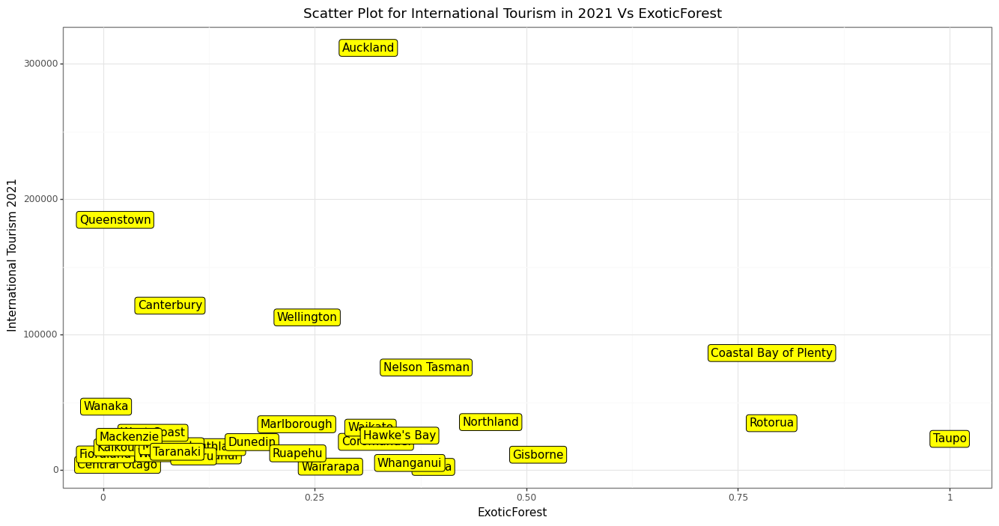

<IPython.core.display.Math object>

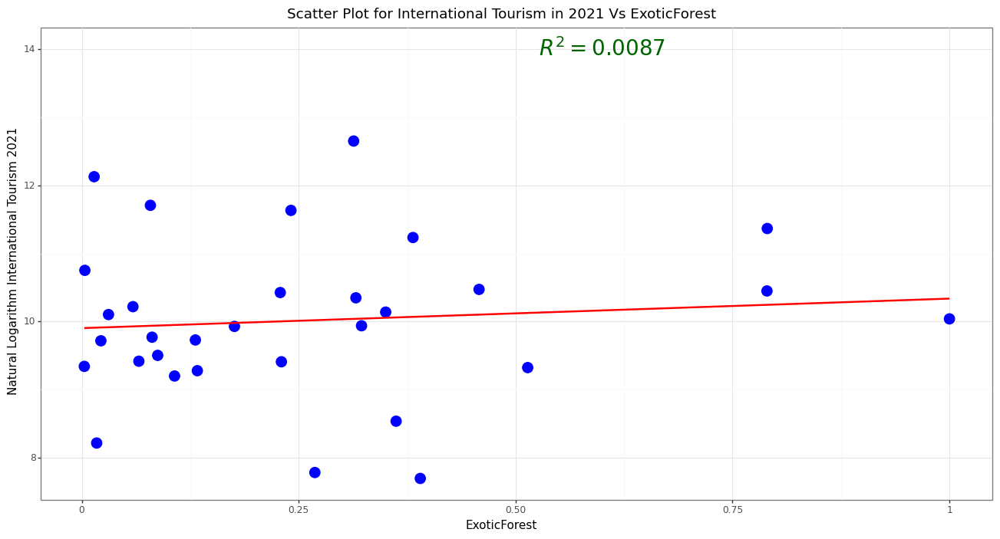

In [60]:
x5 = X.iloc[:, 5].values.reshape(-1, 1)
Model61 = regr.fit(x5, y4)
preds61 = Model61.predict(x5)
R261 = r2_score(y4, preds61).round(4)
R261
display(Math(r'R^2_{{Model}} = {}'.format(R261)))


P1 = (ggplot(dat4, aes(x = 'ExoticForest', y = "y4")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs ExoticForest", 
y = 'International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 300000, label = r"$R^2 = 0.0005$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot


P = (ggplot(dat4, aes(x = 'ExoticForest', y = "y4")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs ExoticForest", 
y = 'International Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model62 = regr.fit(x5, y4_log)
preds62 = Model62.predict(x5)
R262 = r2_score(y4_log, preds62).round(4)
R262
display(Math(r'R^2_{{Model}} = {}'.format(R262)))


P2 = (ggplot(dat4, aes(x = 'ExoticForest', y = "y4_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs ExoticForest", 
y = 'Natural Logarithm International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14, label = r"$R^2 = 0.0087$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>


#### for CoastView

<IPython.core.display.Math object>

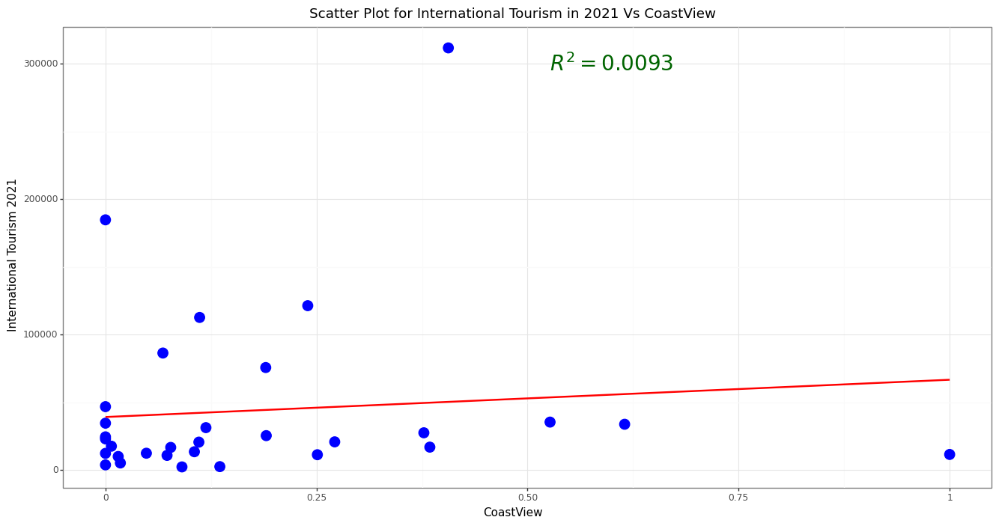

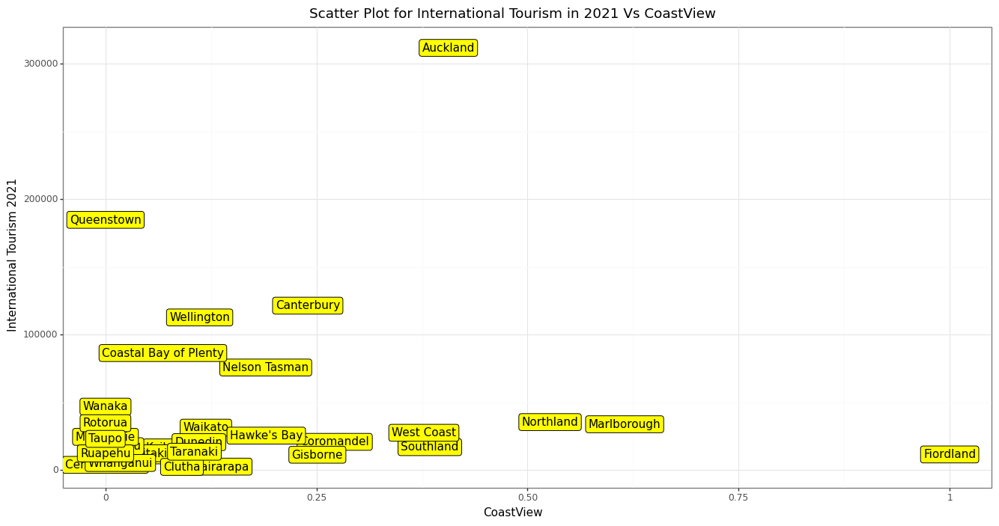

<IPython.core.display.Math object>

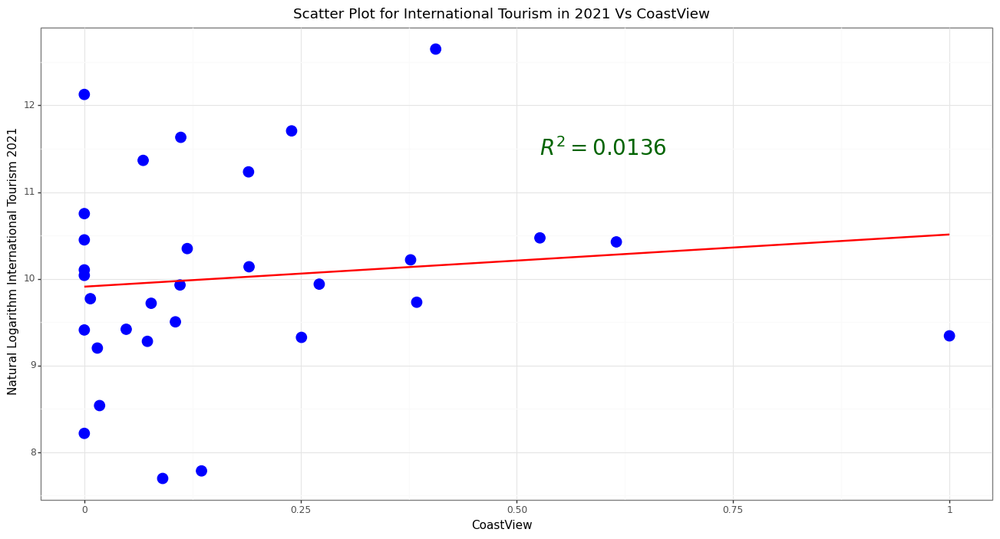

In [61]:
x6 = X.iloc[:, 6].values.reshape(-1, 1)
Model71 = regr.fit(x6, y4)
preds71 = Model71.predict(x6)
R271 = r2_score(y4, preds71).round(4)
R271
display(Math(r'R^2_{{Model}} = {}'.format(R271)))


P1 = (ggplot(dat4, aes(x = 'CoastView', y = "y4")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs CoastView", 
y = 'International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 300000, label = r"$R^2 = 0.0093$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)


## create label plot


P = (ggplot(dat4, aes(x = 'CoastView', y = "y4")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs CoastView", 
y = 'International Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model72 = regr.fit(x6, y4_log)
preds72 = Model72.predict(x6)
R272 = r2_score(y4_log, preds72).round(4)
R272
display(Math(r'R^2_{{Model}} = {}'.format(R272)))


P2 = (ggplot(dat4, aes(x = 'CoastView', y = "y4_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs CoastView", 
y = 'Natural Logarithm International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 11.5, label = r"$R^2 = 0.0136$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))


print(P2)

<br><br><hr><hr><br><br>

#### for DistanceToAirport


<IPython.core.display.Math object>

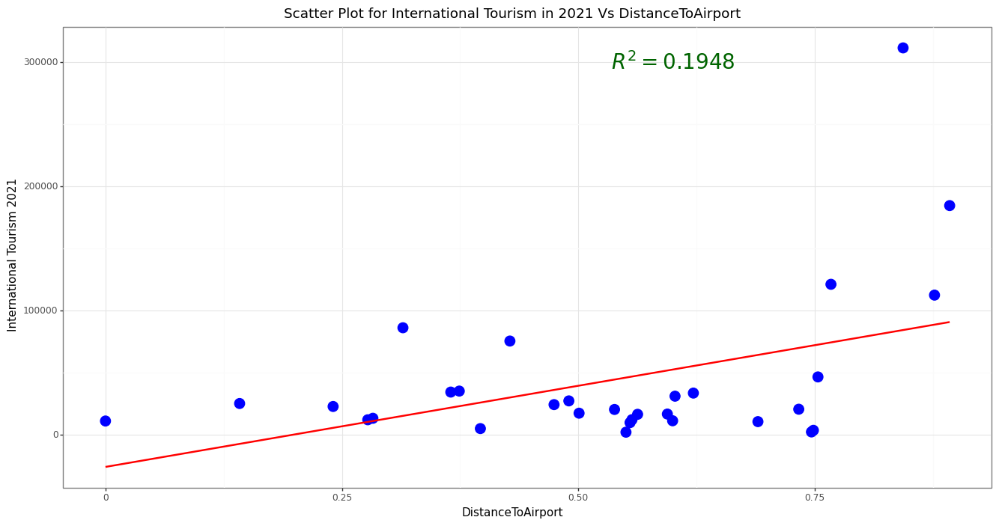

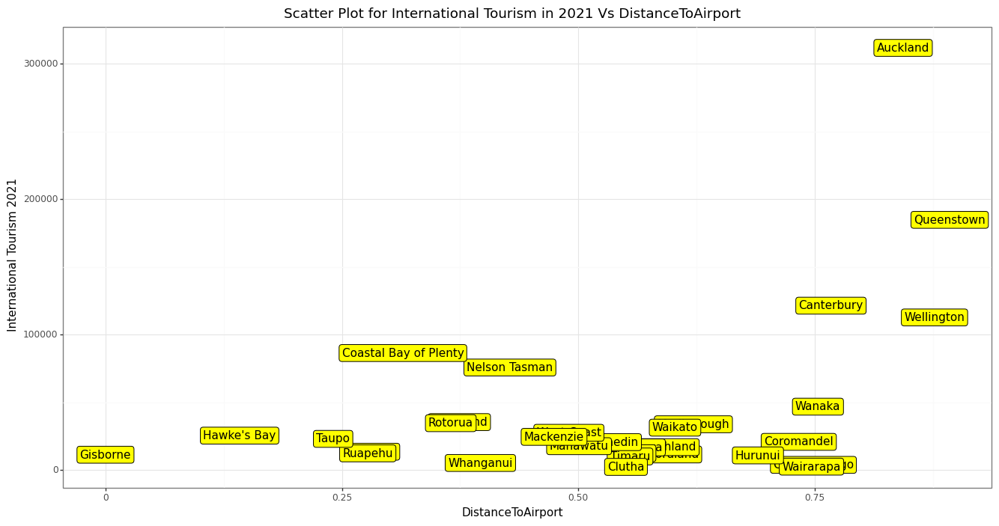

<IPython.core.display.Math object>

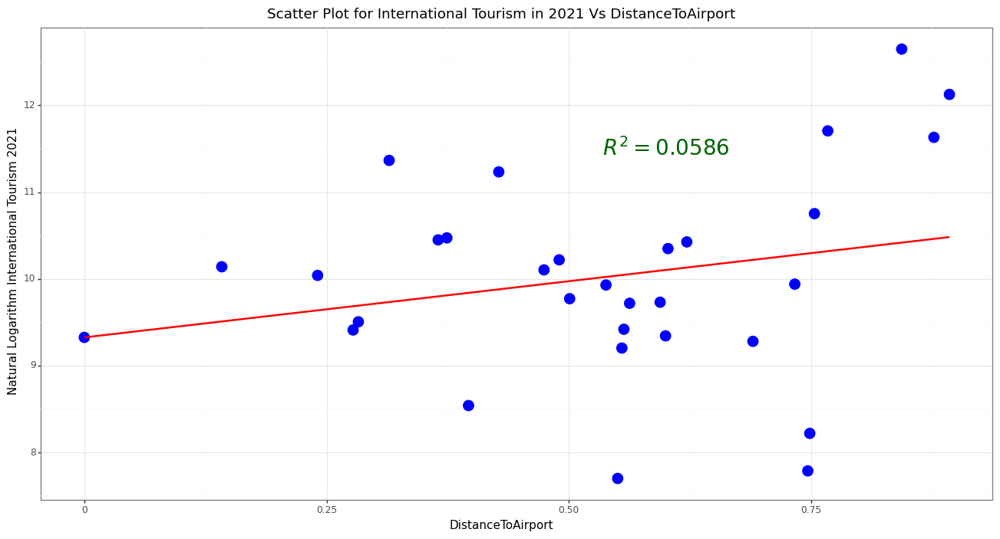

In [62]:
x7 = X.iloc[:, 7].values.reshape(-1, 1)
Model81 = regr.fit(x7, y4)
preds81 = Model81.predict(x7)
R281 = r2_score(y4, preds81).round(4)
R281
display(Math(r'R^2_{{Model}} = {}'.format(R281)))


P1 = (ggplot(dat4, aes(x = 'DistanceToAirport', y = "y4")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs DistanceToAirport", 
y = 'International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 300000, label = r"$R^2 = 0.1948$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))


print(P1)


## create label plot


P = (ggplot(dat4, aes(x = 'DistanceToAirport', y = "y4")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs DistanceToAirport", 
y = 'International Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P)

#### get logarithm of y


Model82 = regr.fit(x7, y4_log)
preds82 = Model82.predict(x7)
R282 = r2_score(y4_log, preds82).round(4)
R282
display(Math(r'R^2_{{Model}} = {}'.format(R282)))


P2 = (ggplot(dat4, aes(x = 'DistanceToAirport', y = "y4_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs DistanceToAirport", 
y = 'Natural Logarithm International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 11.5, label = r"$R^2 = 0.0586$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>

#### for Wetland

<IPython.core.display.Math object>

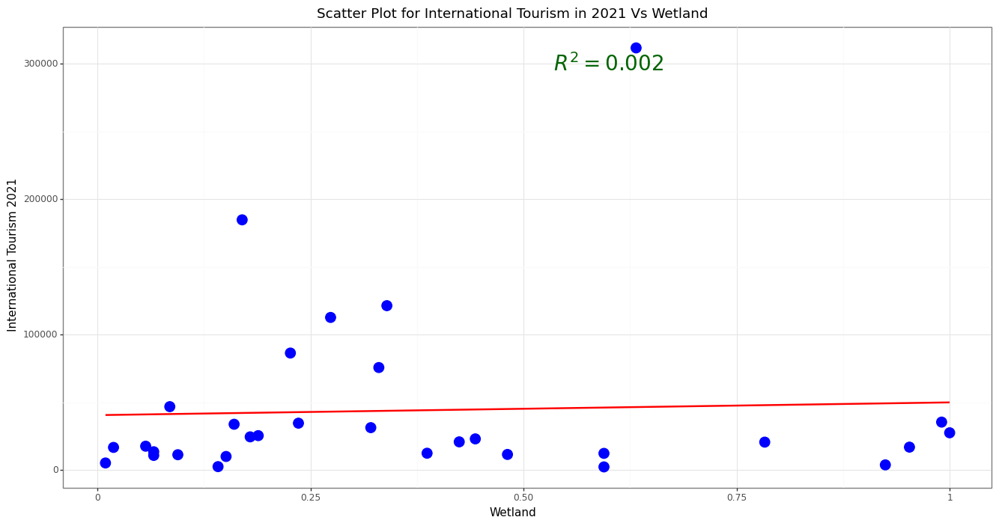

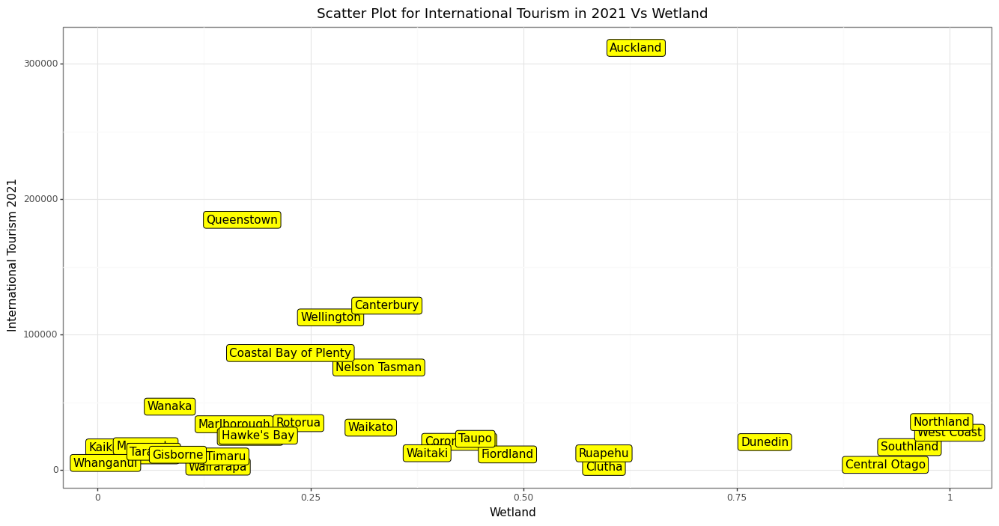

<IPython.core.display.Math object>

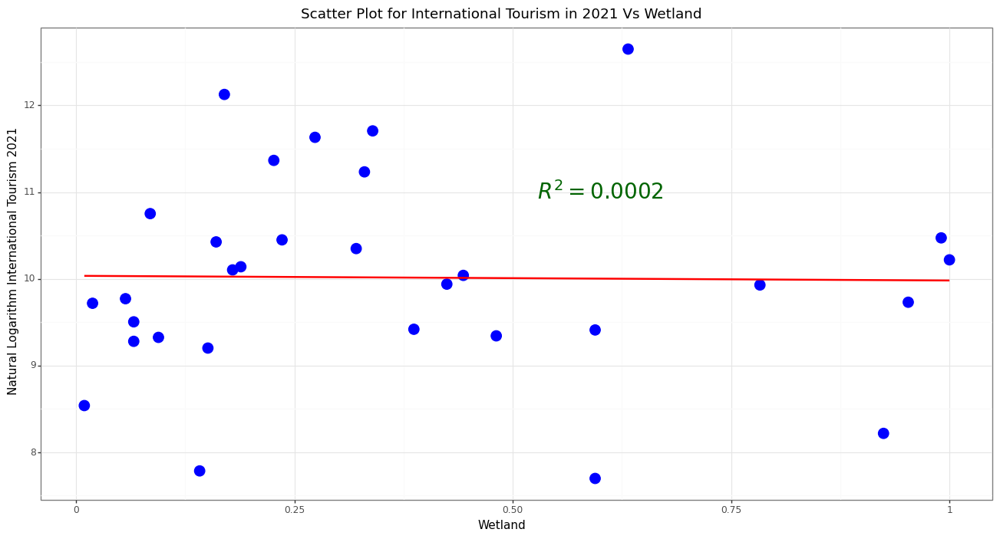

In [63]:
x8 = X.iloc[:, 8].values.reshape(-1, 1)
Model91 = regr.fit(x8, y4)
preds91 = Model91.predict(x8)
R291 = r2_score(y4, preds91).round(4)
R291
display(Math(r'R^2_{{Model}} = {}'.format(R291)))


P1 = (ggplot(dat4, aes(x = 'Wetland', y = "y4")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Wetland", 
y = 'International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 300000, label = r"$R^2 = 0.002$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 8)))

print(P1)

## create label plot


P = (ggplot(dat4, aes(x = 'Wetland', y = "y4")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Wetland", 
y = 'International Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 8)))
print(P)


#### get logarithm of y


Model92 = regr.fit(x8, y4_log)
preds92 = Model82.predict(x8)
R292 = r2_score(y4_log, preds92).round(4)
R292
display(Math(r'R^2_{{Model}} = {}'.format(R292)))




P2 = (ggplot(dat4, aes(x = 'Wetland', y = "y4_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Wetland", 
y = 'Natural Logarithm International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 11, label = r"$R^2 = 0.0002$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 8)))

print(P2)

<br><br><hr><hr><br><br>

#### for ProtectedAreas

<IPython.core.display.Math object>

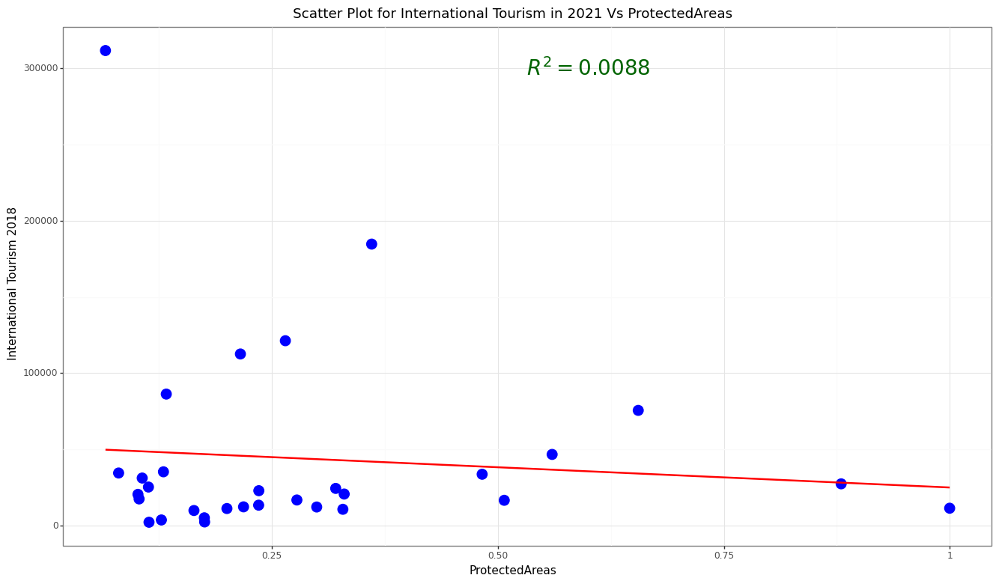

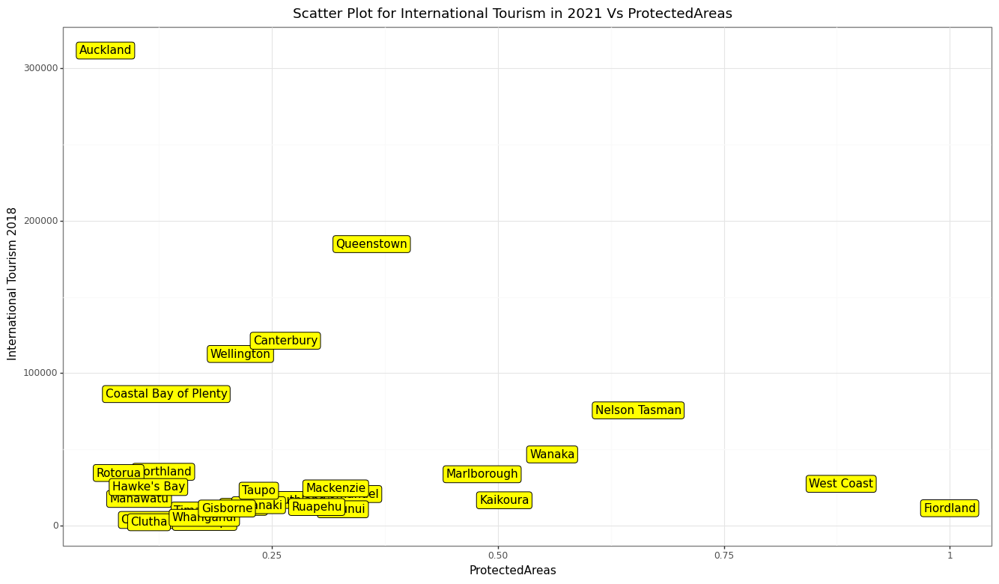

<IPython.core.display.Math object>

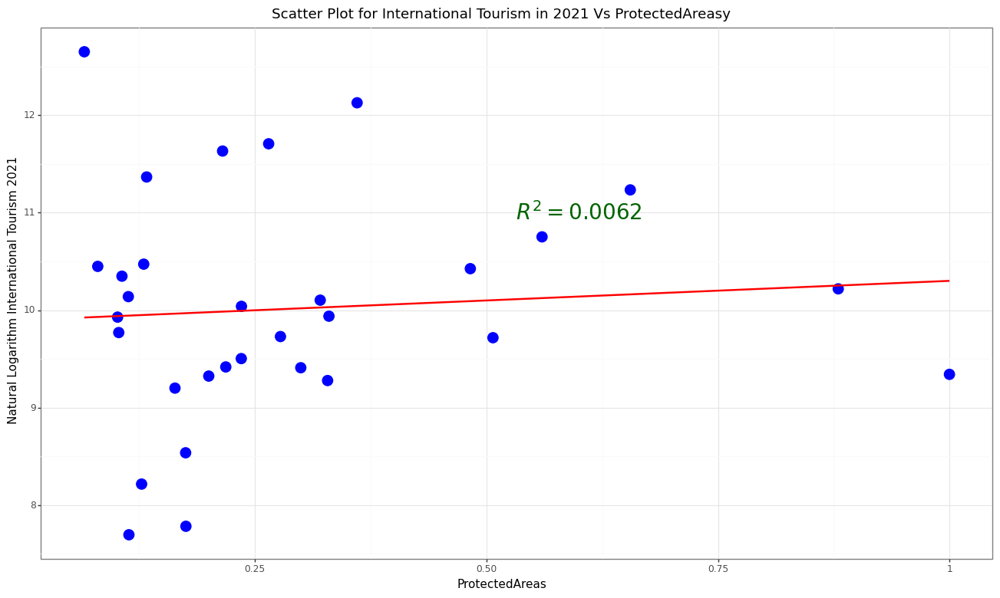

In [64]:
x9 = X.iloc[:, 9].values.reshape(-1, 1)
Model91 = regr.fit(x9, y4)
preds91 = Model91.predict(x9)
R291 = r2_score(y4, preds91).round(4)
R291
display(Math(r'R^2_{{Model}} = {}'.format(R291)))



P1 = (ggplot(dat4, aes(x = 'ProtectedAreas', y = "y4")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs ProtectedAreas", 
y = 'International Tourism 2018') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 300000, label = r"$R^2 = 0.0088$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 9)))

print(P1)


## create label plot


P = (ggplot(dat4, aes(x = 'ProtectedAreas', y = "y4")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs ProtectedAreas", 
y = 'International Tourism 2018') + 
theme_bw() + 
theme(figure_size=(16, 9)))
print(P)


#### get logarithm of y


Model92 = regr.fit(x9, y4_log)
preds92 = Model92.predict(x9)
R292 = r2_score(y4_log, preds92).round(4)
R292
display(Math(r'R^2_{{Model}} = {}'.format(R292)))


P2 = (ggplot(dat4, aes(x = 'ProtectedAreas', y = "y4_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs ProtectedAreasy", 
y = 'Natural Logarithm International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 11, label = r"$R^2 = 0.0062$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 9)))

print(P2)

<br><br><hr><hr>

#### for Grassland

<IPython.core.display.Math object>

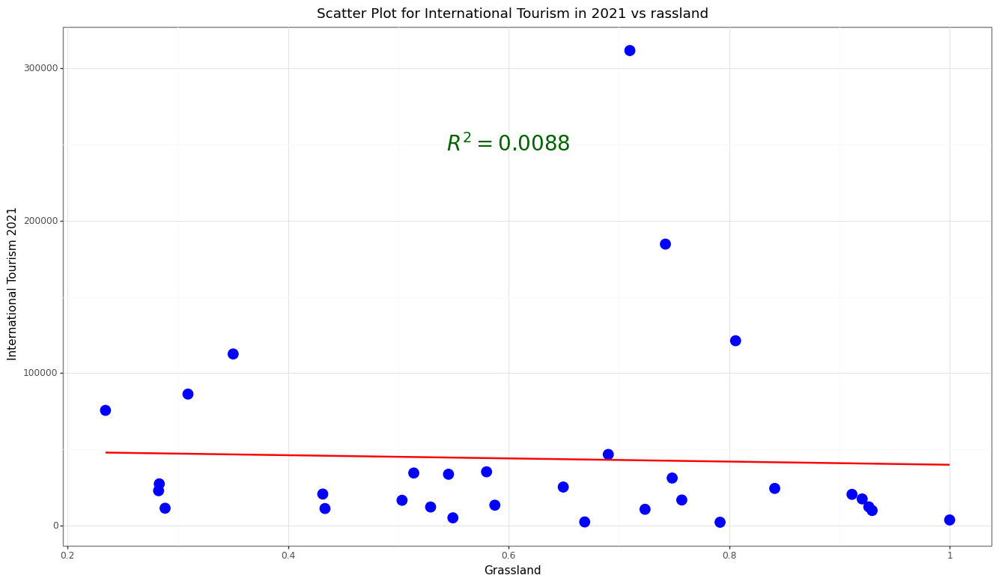

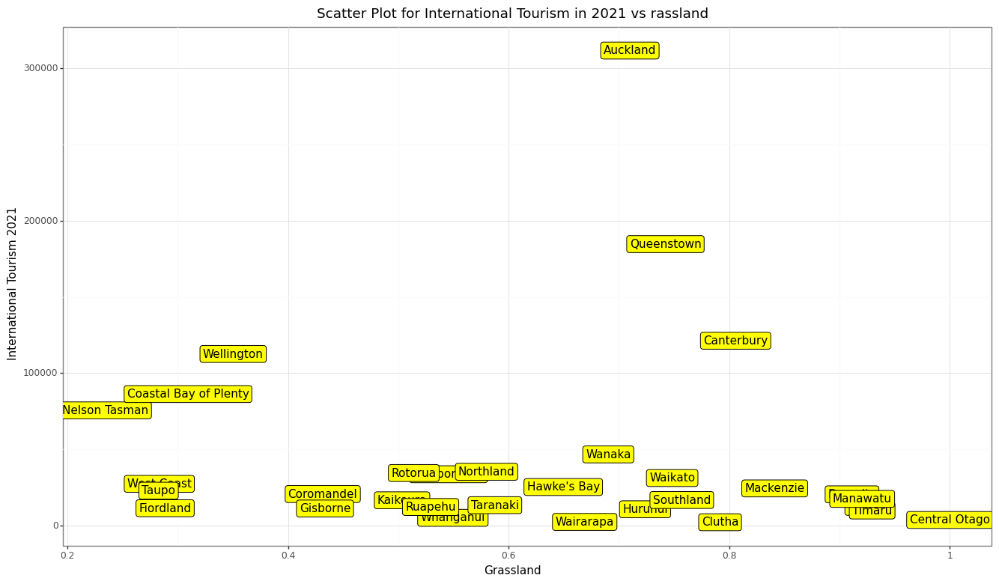

<IPython.core.display.Math object>

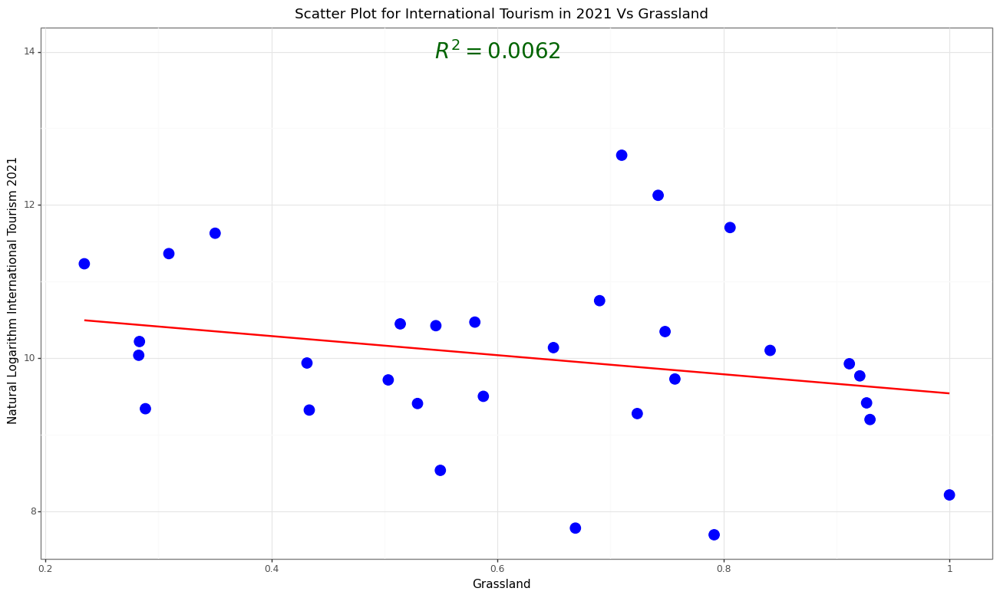

In [65]:
xx9 = X.iloc[:, 9].values.reshape(-1, 1)
Model91 = regr.fit(xx9, y4)
preds91 = Model91.predict(xx9)
R291 = r2_score(y4, preds91).round(4)
R291
display(Math(r'R^2_{{Model}} = {}'.format(R291)))

P1 = (ggplot(dat4, aes(x = 'Grassland', y = "y4")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 vs rassland", 
y = 'International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
annotate(geom = "text", x = 0.6 ,  y = 250000, label = r"$R^2 = 0.0088$", 
size = 20, colour = "darkgreen") + 
theme_bw() + 
theme(figure_size=(16, 9)))

print(P1)
## create label plot


P = (ggplot(dat4, aes(x = 'Grassland', y = "y4")) + 
geom_label(aes(label = 'RTO_Names'), fill = "yellow") + 
labs(title = "Scatter Plot for International Tourism in 2021 vs rassland", 
y = 'International Tourism 2021') + 
theme_bw() + 
theme(figure_size=(16, 9)))

print(P)
#### get logarithm of y


Model92 = regr.fit(xx9, y4_log)
preds92 = Model92.predict(xx9)
R292 = r2_score(y4_log, preds92).round(4)
R292
display(Math(r'R^2_{{Model}} = {}'.format(R292)))


P2 = (ggplot(dat4, aes(x = 'Grassland', y = "y4_log")) + 
geom_point(colour = "blue", size = 5, shape = 'o') + 
labs(title = "Scatter Plot for International Tourism in 2021 Vs Grassland", 
y = 'Natural Logarithm International Tourism 2021') +
geom_smooth(method = "lm", formula = 'y ~ x', se = False, colour = 'red') + 
theme_bw() + 
annotate(geom = "text", x = 0.6 , y = 14 , label = r"$R^2 = 0.0062$", 
size = 20, colour = "darkgreen") + 
theme(figure_size=(16, 9)))

print(P2)

<br><br><hr><hr><br><br>



#### define a Model with all variables 

In [66]:
## without scaling
X2 = sm.add_constant(X)

model = sm.OLS(y4, X2).fit()

print_model = model.summary()
print(print_model)

## with scaling
# xx = scaler.fit_transform(X)

# xx2 = sm.add_constant(xx)

# model2 = sm.OLS(y4, xx2).fit()
# print_model2 = model2.summary()
# print(print_model2)


############################### y ---> log(y)

## with scaling

model3 = sm.OLS(y4_log, X2).fit()
print_model3 = model3.summary()
print(print_model3)


                            OLS Regression Results                            
Dep. Variable:       International_21   R-squared:                       0.577
Model:                            OLS   Adj. R-squared:                  0.332
Method:                 Least Squares   F-statistic:                     2.353
Date:                Sat, 08 Jul 2023   Prob (F-statistic):             0.0490
Time:                        10:51:43   Log-Likelihood:                -373.37
No. Observations:                  31   AIC:                             770.7
Df Residuals:                      19   BIC:                             788.0
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const              3.593e+04   1.67e+0

<br><br><hr><hr><br><br>


#### get correlation Matrix between variables

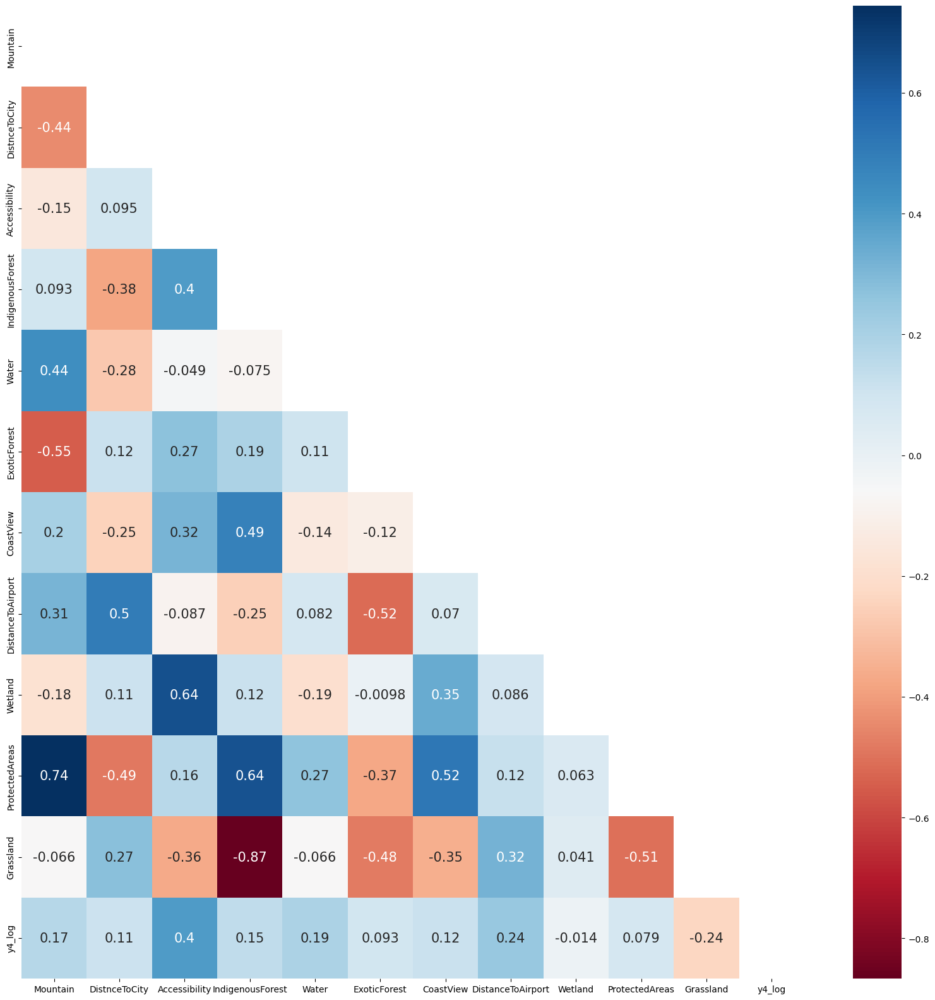

<Figure size 2000x2000 with 0 Axes>

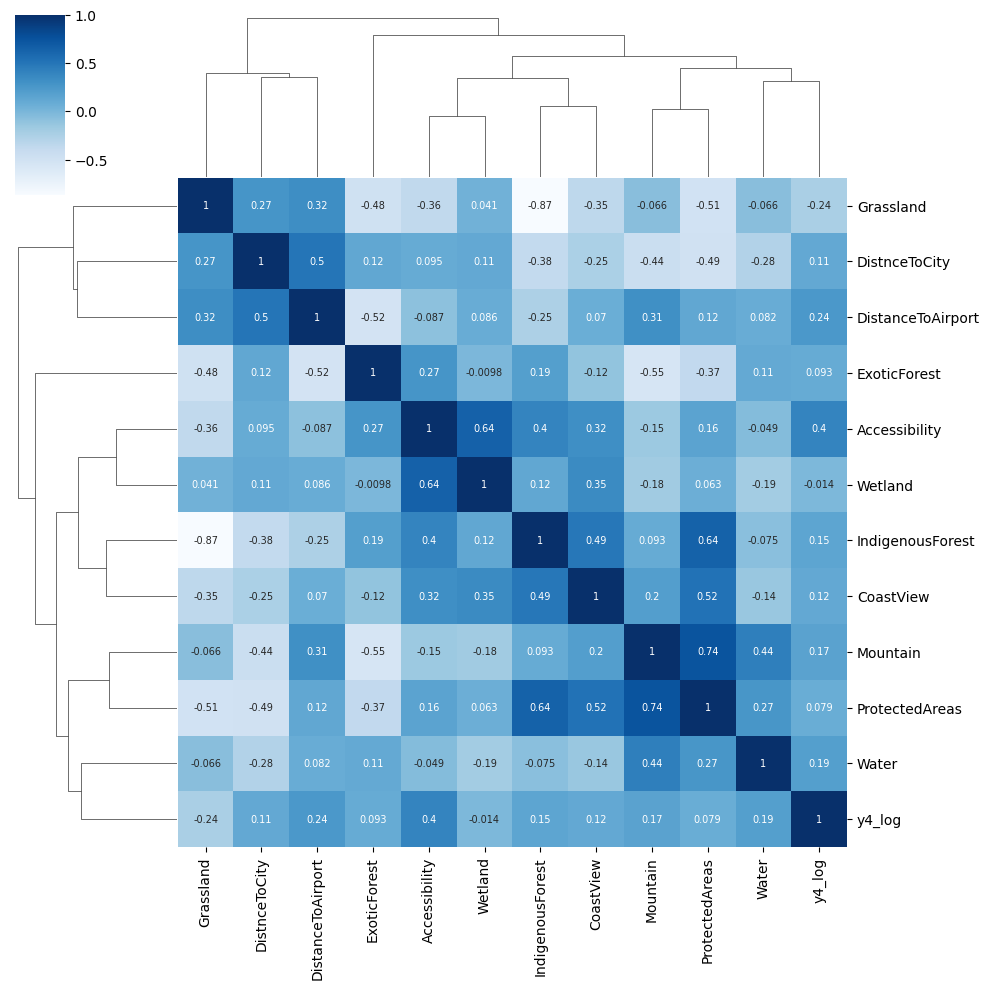

<Figure size 2000x2000 with 0 Axes>

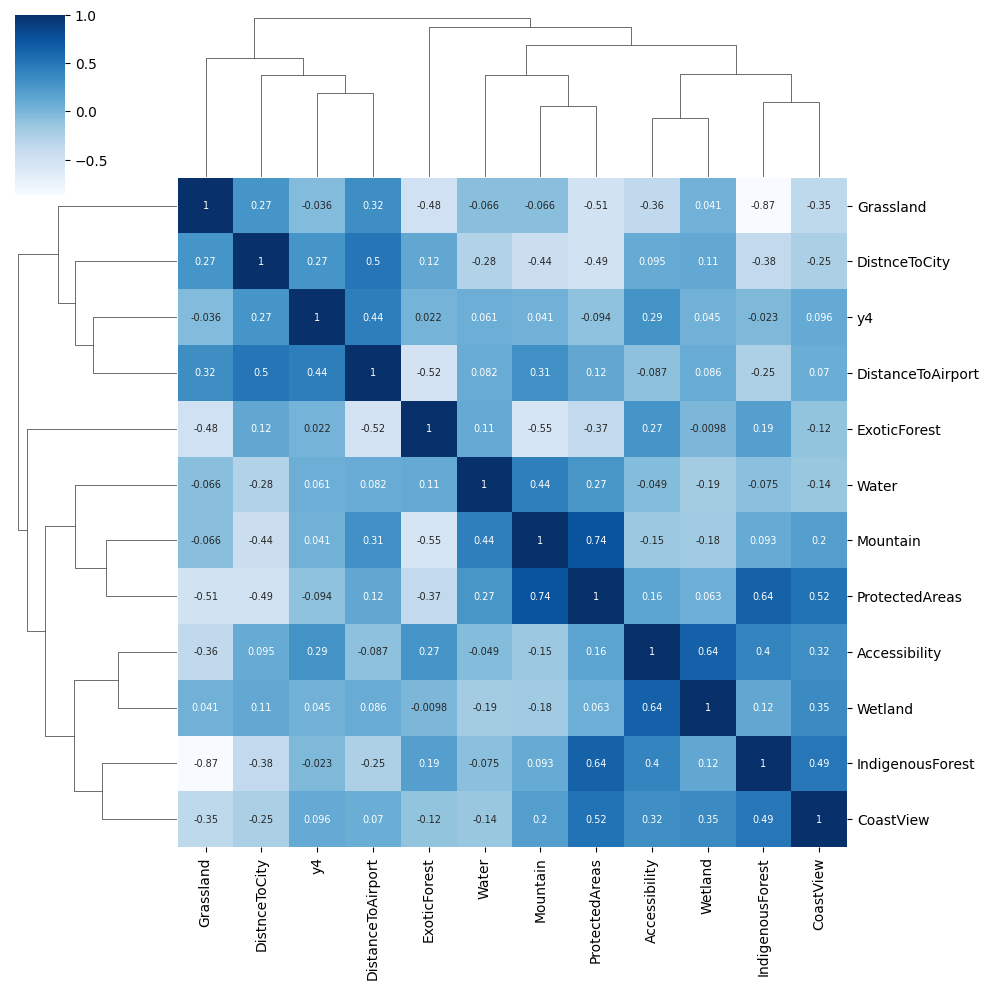

In [67]:
dat4_corr = dat4.drop(['y4', 'RTO_Names'], axis = 1)
dat4_corr.columns
dat4_corrr = dat4_corr.corr()



matrix = np.triu(dat4_corrr)
plt.figure(figsize=(20, 20), facecolor='w', edgecolor='k')
sns.heatmap(dat4_corrr, annot = True, annot_kws = {"size" : 15}, mask = matrix , cmap="RdBu")
plt.show()

plt.figure(figsize=(20, 20), facecolor='w', edgecolor='k')
cmap = sns.diverging_palette(h_neg=210, h_pos=350,  s=90, l=30, as_cmap=True)

sns.clustermap(data = dat4_corrr, annot = True, cmap = "Blues", 
annot_kws={"size": 7})
plt.show()




dat4_corr_2 = dat4.drop(['y4_log', 'RTO_Names'], axis = 1)
dat4_corr_2.columns
dat4_corrr_2 = dat4_corr_2.corr()

plt.figure(figsize=(20, 20), facecolor='w', edgecolor='k')
cmap = sns.diverging_palette(h_neg=210, h_pos=350, s=90, l=30, as_cmap=True)

sns.clustermap(data = dat4_corrr_2, annot = True, cmap = "Blues", 
annot_kws={"size": 7})
plt.show()

<br><br><hr><hr><br><br>

In [68]:
X_new = X.drop(['Grassland', 'DistanceToAirport'  ], axis = 1)

temp1 = X_new.columns
temp1
# xx = scaler.fit_transform(X_new)
# xx = pd.DataFrame(xx, columns = temp1, index = dat_org.index)
model = sm.OLS(y4, X_new).fit()

print_model = model.summary()
print(print_model)


############################### y ---> log(y)

## with scaling

model3 = sm.OLS(y4_log, X_new).fit()
print_model3 = model3.summary()
print(print_model3)


                                 OLS Regression Results                                
Dep. Variable:       International_21   R-squared (uncentered):                   0.618
Model:                            OLS   Adj. R-squared (uncentered):              0.462
Method:                 Least Squares   F-statistic:                              3.955
Date:                Sat, 08 Jul 2023   Prob (F-statistic):                     0.00407
Time:                        10:51:44   Log-Likelihood:                         -377.87
No. Observations:                  31   AIC:                                      773.7
Df Residuals:                      22   BIC:                                      786.6
Df Model:                           9                                                  
Covariance Type:            nonrobust                                                  
                       coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

<br><br><hr><hr><hr><hr><br><br>


## Compare Data

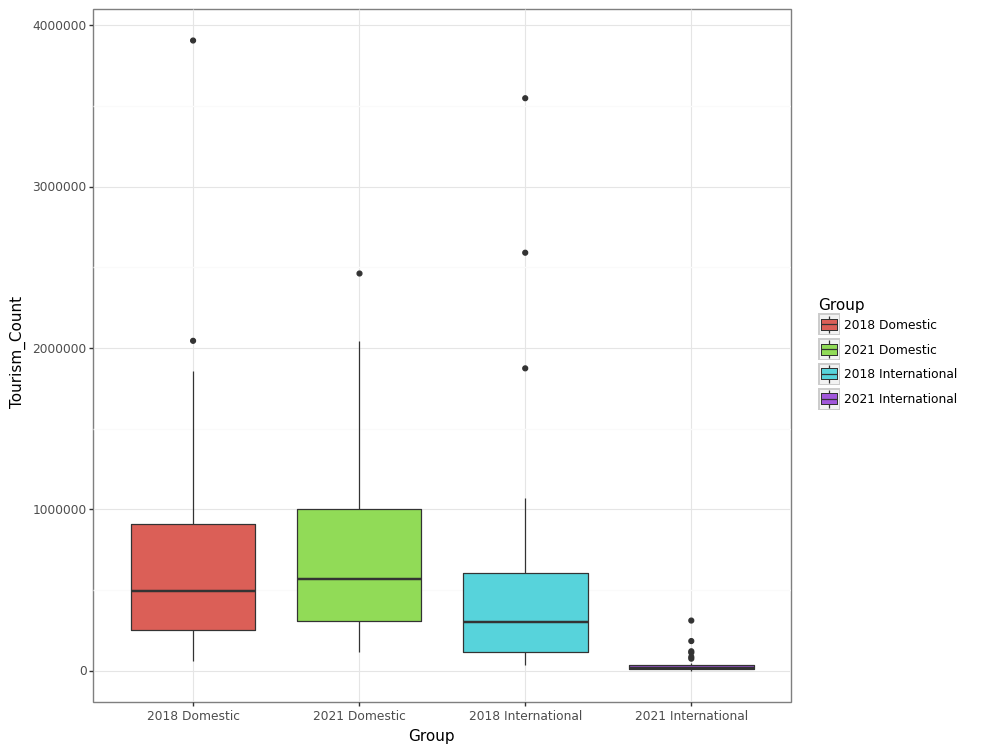

<ggplot: (146210534773)>

In [69]:
dat1.shape
str1 = '2018 Domestic'
vec1 = np.repeat(str1, 31)
temp1 = pd.Categorical(vec1, categories=['2018 Domestic', '2021 Domestic', '2018 International', '2021 International'])
Res1 = {'Tourism_Count' : y1, 
'Group' : temp1}

long_dat = pd.DataFrame(Res1)
long_dat

str2 = '2021 Domestic'
vec2 = np.repeat(str2, 31)
temp2 = pd.Categorical(vec2, categories=['2018 Domestic', '2021 Domestic', '2018 International', '2021 International'])
Res2 = {'Tourism_Count' : y2, 
'Group' : temp2}

long_dat2 = pd.DataFrame(Res2)
long_dat2


newdf1 = pd.concat([long_dat, long_dat2], sort = False, 
ignore_index = True)





str1 = '2018 International'
vec1 = np.repeat(str1, 31)
temp1 = pd.Categorical(vec1, categories=['2018 Domestic', '2021 Domestic', '2018 International', '2021 International'])
Res1 = {'Tourism_Count' : y3, 
'Group' : temp1}

long_dat = pd.DataFrame(Res1)
long_dat

str2 = '2021 International'
vec2 = np.repeat(str2, 31)
temp2 = pd.Categorical(vec2, categories=['2018 Domestic', '2021 Domestic', '2018 International', '2021 International'])
Res2 = {'Tourism_Count' : y4, 
'Group' : temp2}

long_dat2 = pd.DataFrame(Res2)
long_dat2


newdf2 = pd.concat([long_dat, long_dat2], sort = False, 
ignore_index = True)

Long_Data = pd.concat([newdf1, newdf2], sort = False, 
ignore_index = True)

P_box1  = (ggplot(Long_Data, aes(y = 'Tourism_Count', x = 'Group')) + 
geom_boxplot(aes(fill = 'Group')) + 
theme_bw() + 
theme(figure_size = (9, 9))) 
P_box1


<br><br><hr><hr><br><br>
#### For Log Data

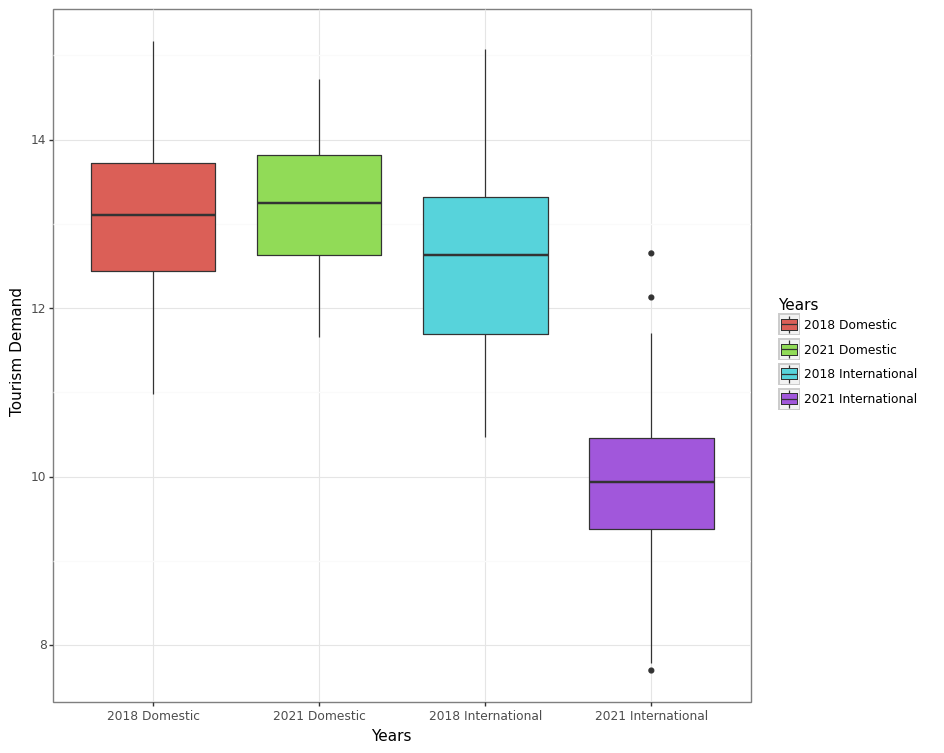

<ggplot: (146209207725)>

In [70]:
str1 = '2018 Domestic'
vec1 = np.repeat(str1, 31)
temp1 = pd.Categorical(vec1, categories=['2018 Domestic', '2021 Domestic', '2018 International', '2021 International'])
Res1 = {'Tourism Demand' : y1_log, 
'Years' : temp1}

long_dat = pd.DataFrame(Res1)
long_dat

str2 = '2021 Domestic'
vec2 = np.repeat(str2, 31)
temp2 = pd.Categorical(vec2, categories=['2018 Domestic', '2021 Domestic', '2018 International', '2021 International'])
Res2 = {'Tourism Demand' : y2_log, 
'Years' : temp2}

long_dat2 = pd.DataFrame(Res2)
long_dat2


newdf1 = pd.concat([long_dat, long_dat2], sort = False, 
ignore_index = True)





str1 = '2018 International'
vec1 = np.repeat(str1, 31)
temp1 = pd.Categorical(vec1, categories=['2018 Domestic', '2021 Domestic', '2018 International', '2021 International'])
Res1 = {'Tourism Demand' : y3_log, 
'Years' : temp1}

long_dat = pd.DataFrame(Res1)
long_dat

str2 = '2021 International'
vec2 = np.repeat(str2, 31)
temp2 = pd.Categorical(vec2, categories=['2018 Domestic', '2021 Domestic', '2018 International', '2021 International'])
Res2 = {'Tourism Demand' : y4_log, 
'Years' : temp2}

long_dat2 = pd.DataFrame(Res2)
long_dat2


newdf2 = pd.concat([long_dat, long_dat2], sort = False, 
ignore_index = True)

Long_Data_log = pd.concat([newdf1, newdf2], sort = False, 
ignore_index = True)

P_box1  = (ggplot(Long_Data_log, aes(y = 'Tourism Demand', x = 'Years')) + 
geom_boxplot(aes(fill = 'Years')) + 
theme_bw() + 
theme(figure_size = (9, 9))) 
P_box1

<br><br><hr><hr><br><br>


## Mean Plot (Line Plot For Means)

                    Tourism_Count
Group                            
2018 Domestic       721640.451613
2021 Domestic       753012.903226
2018 International  567982.774194
2021 International   43877.419355


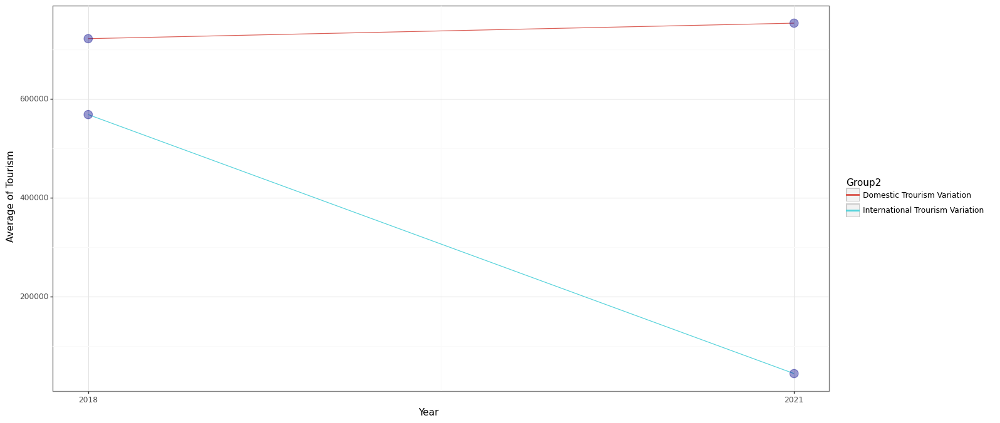

<ggplot: (146209236997)>

In [71]:
def  Mean(x): 
    return x.mean()
res_dat = Long_Data.groupby('Group').agg({'Tourism_Count' : Mean})

print(res_dat)
temp2 = ["Domestic Trourism Variation", "Domestic Trourism Variation", "International Trourism Variation", 
"International Trourism Variation"]

res_dat['Group2'] = temp2
res_dat['Index'] = [1, 10, 1, 10]

P_line = (ggplot(res_dat, aes(x = 'Index', y = 'Tourism_Count', 
group = 'Group2')) + 
geom_line(aes(colour = 'Group2')) + 
geom_point(size = 5, colour = "darkblue", alpha = .4) + 
theme_bw() + 
theme(figure_size = (16, 8)) + 
scale_x_continuous(breaks = (1, 10), 
                   labels = ("2018", "2021")) + 
                   labs(x = "Year", y = "Average of Tourism"))

P_line

#### Normality Test for y1, y2, y3, y4 and y1_log, y2_log, y3_log, y4_log

#### Normality Test for y1 and y1_log

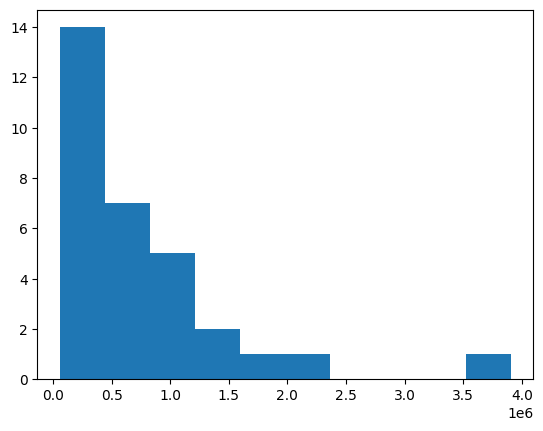

In [72]:
# histogram plot for y1
from matplotlib import pyplot
pyplot.hist(y1)
pyplot.show()

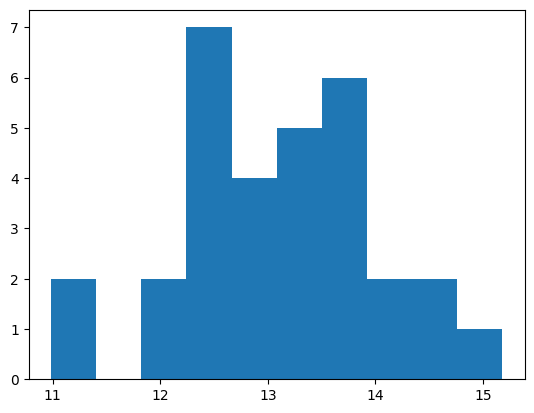

In [73]:
## histogram plot y1_log
from matplotlib import pyplot
pyplot.hist(y1_log)
pyplot.show()

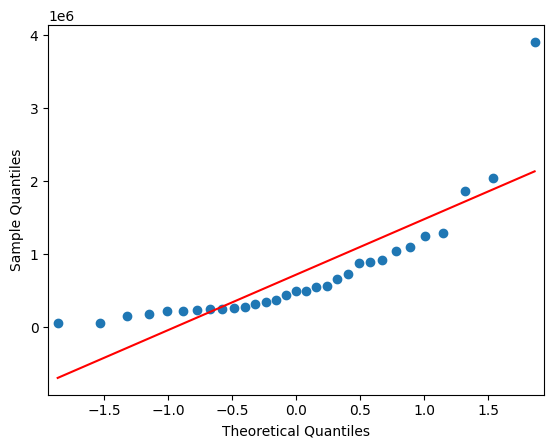

In [74]:
## QQ Plot for y1
from statsmodels.graphics.gofplots import qqplot

qqplot(y1, line='s')
pyplot.show()

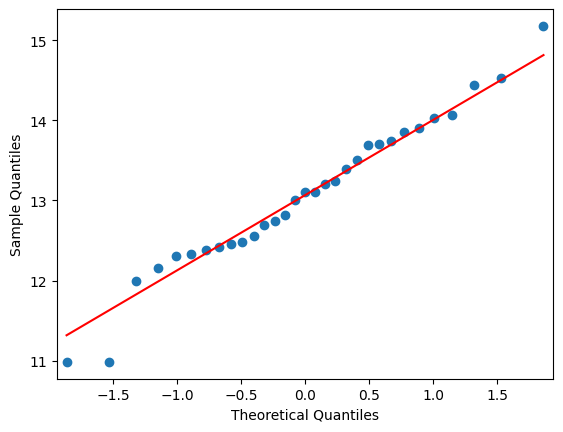

In [75]:
## QQ Plot for y1_log
from statsmodels.graphics.gofplots import qqplot

qqplot(y1_log, line='s')
pyplot.show()

In [76]:
# Normality Test for y1

# Shapiro-Wilk Test
from scipy.stats import shapiro

# normality test
stat, p = shapiro(y1)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
 print('Sample looks Gaussian (fail to reject H0)')
else:
 print('Sample does not look Gaussian (reject H0)')

Statistics=0.716, p=0.000
Sample does not look Gaussian (reject H0)


In [77]:
# Normality Test for y1

# Shapiro-Wilk Test
from scipy.stats import shapiro

# normality test
stat, p = shapiro(y1_log)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
 print('Sample looks Gaussian (fail to reject H0)')
else:
 print('Sample does not look Gaussian (reject H0)')

Statistics=0.979, p=0.782
Sample looks Gaussian (fail to reject H0)


#### Normality Test for y2, y2_log

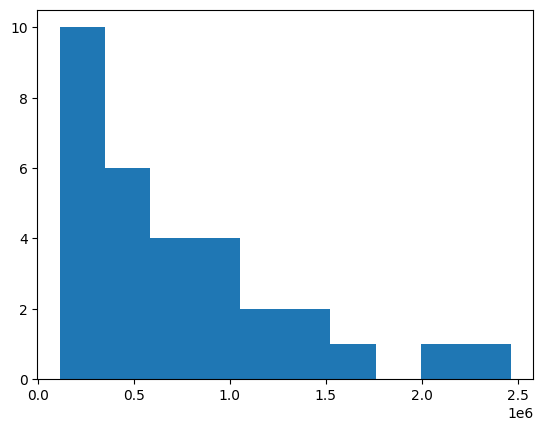

In [78]:
# histogram plot for y2
from matplotlib import pyplot
pyplot.hist(y2)
pyplot.show()

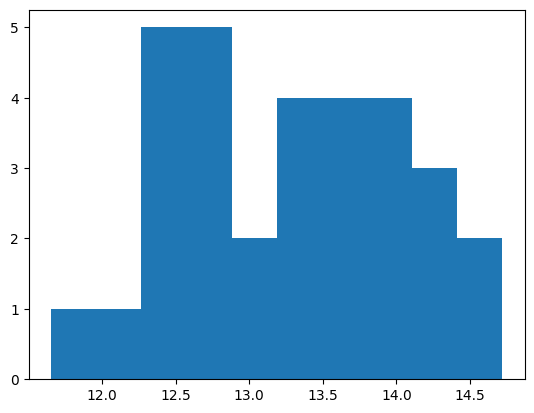

In [79]:
## histogram plot y1_log
from matplotlib import pyplot
pyplot.hist(y2_log)
pyplot.show()

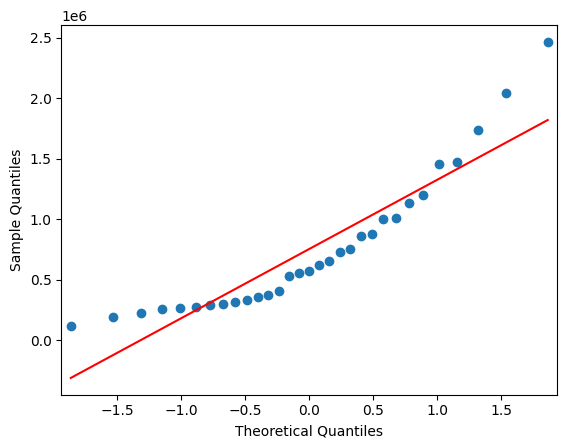

In [80]:
## QQ Plot for y2
from statsmodels.graphics.gofplots import qqplot

qqplot(y2, line='s')
pyplot.show()

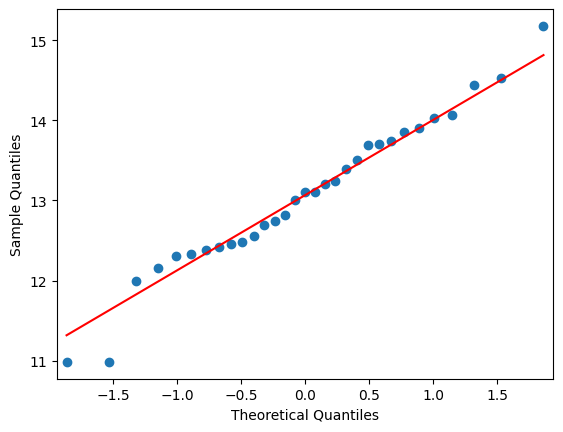

In [81]:
## QQ Plot for y2_log
from statsmodels.graphics.gofplots import qqplot

qqplot(y1_log, line='s')
pyplot.show()

In [82]:
# Normality Test for y2

# Shapiro-Wilk Test
from scipy.stats import shapiro

# normality test
stat, p = shapiro(y2)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
 print('Sample looks Gaussian (fail to reject H0)')
else:
 print('Sample does not look Gaussian (reject H0)')

Statistics=0.860, p=0.001
Sample does not look Gaussian (reject H0)


In [83]:
# Normality Test for y2_log

# Shapiro-Wilk Test
from scipy.stats import shapiro

# normality test
stat, p = shapiro(y2_log)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
 print('Sample looks Gaussian (fail to reject H0)')
else:
 print('Sample does not look Gaussian (reject H0)')

Statistics=0.980, p=0.813
Sample looks Gaussian (fail to reject H0)


#### Normality Test for y3, y3_log

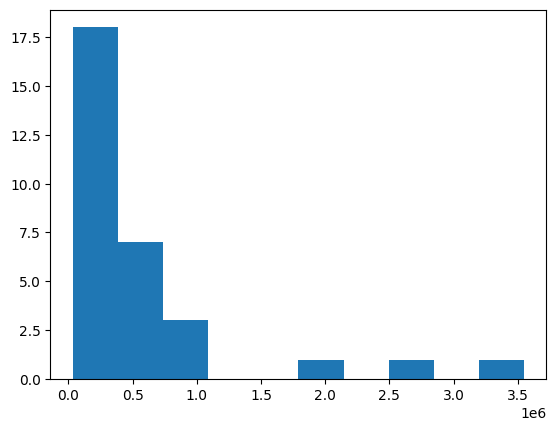

In [84]:
# histogram plot for y3
from matplotlib import pyplot
pyplot.hist(y3)
pyplot.show()

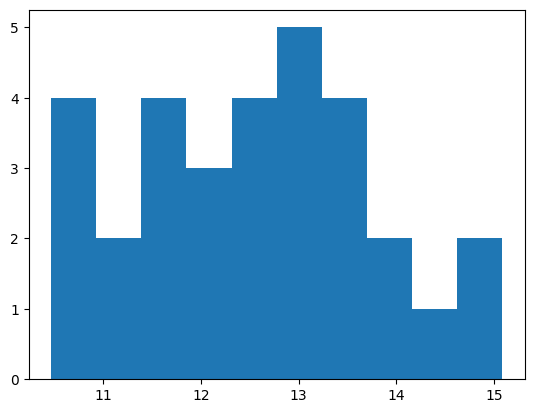

In [85]:
## histogram plot y3_log
from matplotlib import pyplot
pyplot.hist(y3_log)
pyplot.show()

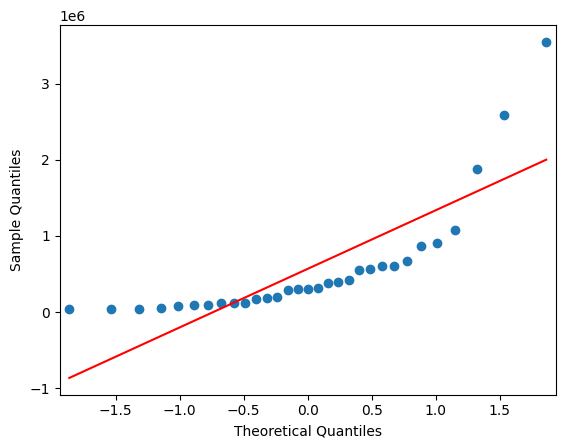

In [86]:
## QQ Plot for y3
from statsmodels.graphics.gofplots import qqplot

qqplot(y3, line='s')
pyplot.show()

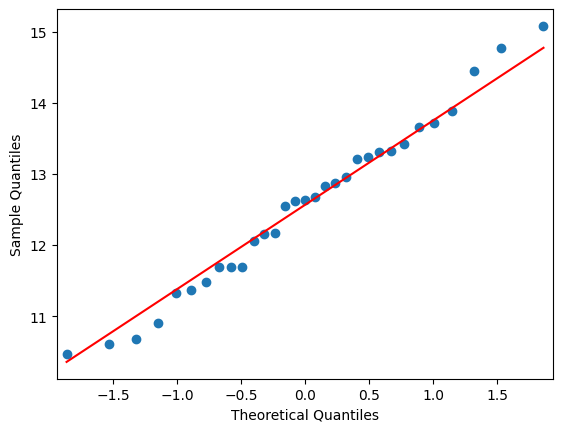

In [87]:
## QQ Plot for y3_log
from statsmodels.graphics.gofplots import qqplot

qqplot(y3_log, line='s')
pyplot.show()

In [88]:
# Normality Test for y3

# Shapiro-Wilk Test
from scipy.stats import shapiro

# normality test
stat, p = shapiro(y3)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
 print('Sample looks Gaussian (fail to reject H0)')
else:
 print('Sample does not look Gaussian (reject H0)')

Statistics=0.653, p=0.000
Sample does not look Gaussian (reject H0)


In [89]:
# Normality Test for y3_log

# Shapiro-Wilk Test
from scipy.stats import shapiro

# normality test
stat, p = shapiro(y3_log)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
 print('Sample looks Gaussian (fail to reject H0)')
else:
 print('Sample does not look Gaussian (reject H0)')

Statistics=0.979, p=0.781
Sample looks Gaussian (fail to reject H0)


#### Normality Test for y4, y4_log

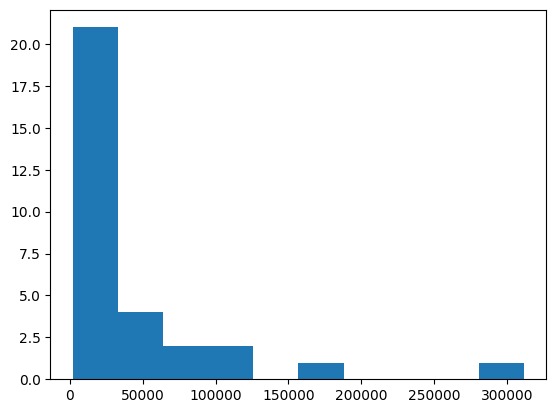

In [90]:
# histogram plot for y4
from matplotlib import pyplot
pyplot.hist(y4)
pyplot.show()

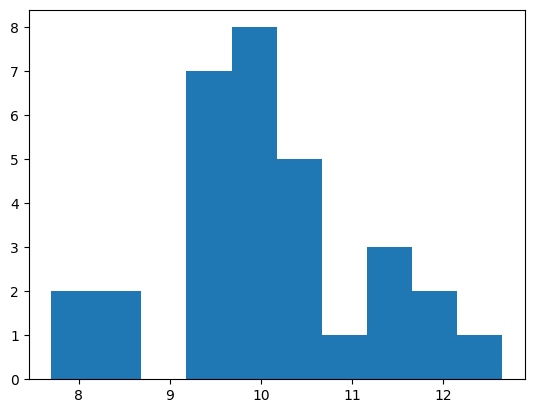

In [91]:
## histogram plot y4_log

from matplotlib import pyplot
pyplot.hist(y4_log)
pyplot.show()

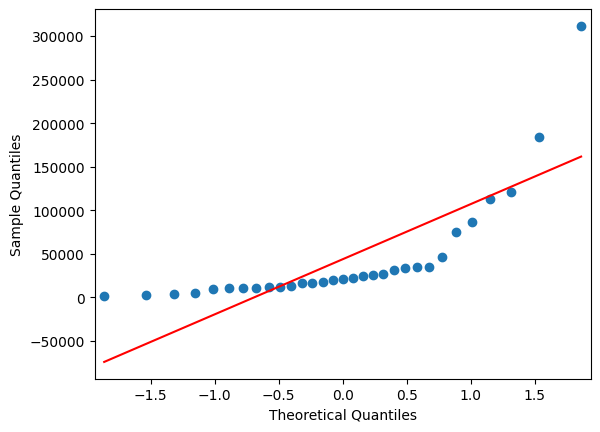

In [92]:
## QQ Plot for y4

from statsmodels.graphics.gofplots import qqplot

qqplot(y4, line='s')
pyplot.show()

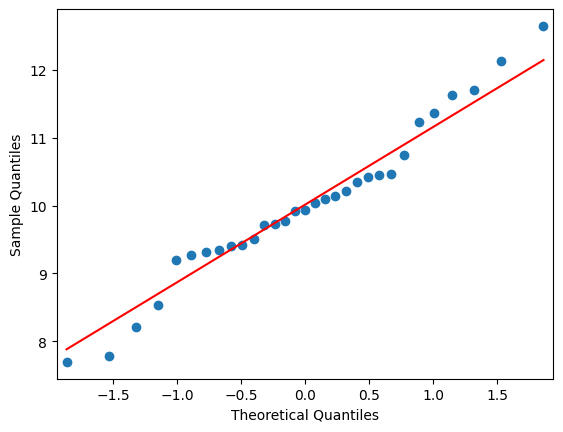

In [93]:
## QQ Plot for y4_log
from statsmodels.graphics.gofplots import qqplot

qqplot(y4_log, line='s')
pyplot.show()

In [94]:
# Normality Test for y4

# Shapiro-Wilk Test
from scipy.stats import shapiro

# normality test
stat, p = shapiro(y4)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
 print('Sample looks Gaussian (fail to reject H0)')
else:
 print('Sample does not look Gaussian (reject H0)')

Statistics=0.609, p=0.000
Sample does not look Gaussian (reject H0)


In [95]:
# Normality Test for log_y4

# Shapiro-Wilk Test
from scipy.stats import shapiro

# normality test
stat, p = shapiro(y4_log)
print('Statistics=%.3f, p=%.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
 print('Sample looks Gaussian (fail to reject H0)')
else:
 print('Sample does not look Gaussian (reject H0)')

Statistics=0.973, p=0.609
Sample looks Gaussian (fail to reject H0)


In [96]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [97]:
X = dat_org[['Mountain', 'DistnceToCity', 'Accessibility', 'IndigenousForest', 'Water', 'ExoticForest', 'CoastView',
             'DistanceToAirport', 'Wetland', 'ProtectedAreas', 'Grassland']]

# Add a constant column to X 
# X = sm.add_constant(X)

# Calculate VIF for each variable
vif = pd.DataFrame()
vif["Variable"] = X.columns
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Print the VIF values
print(vif)


             Variable        VIF
0            Mountain  17.625444
1       DistnceToCity  31.887938
2       Accessibility  10.299419
3    IndigenousForest  21.195795
4               Water   5.512699
5        ExoticForest   9.420988
6           CoastView   3.512256
7   DistanceToAirport  38.958275
8             Wetland   6.694049
9      ProtectedAreas  43.611443
10          Grassland   8.897825


<br><br><hr><hr><br><br>

## T Test and Wilcoxon Test 

<br><br>
#### $\text{Domestic 2018} \sim \text{Domesitc 2021}$
#### $\log\left(\text{Domestic 2018}\right) \sim \log\left(\text{Domesitc 2021}\right)$


In [98]:
# Importing library
import scipy.stats as stats
  
# conduct the Wilcoxon-Signed Rank Test
Wilcox_result1 = np.array(list(stats.wilcoxon(y1, y2))).round(6)

# Performing the paired sample t-test
Ttest_1 = stats.ttest_rel(y1_log, y2_log)

<br><hr><br>
#### $\text{International 2018} \sim \text{International 2021}$
#### $\log\left(\text{International 2018}\right) \sim \log\left(\text{International 2021}\right)$

In [99]:
# Importing library
import scipy.stats as stats
  
# conduct the Wilcoxon-Signed Rank Test
Wilcox_result2 = np.array(list(stats.wilcoxon(y3, y4))).round(6)

# Performing the paired sample t-test
Ttest_2 = np.array(list(stats.ttest_rel(y3_log, y4_log))).round(6)


<br><br><hr><hr>
## Gain Results of Tests

In [100]:
myresults = dict(Compare = ['2018 Domestic ~ 2021 Domestic', 
    'log 2018 Domestic ~ log 2021 Domestic', 
    '2018 International ~ 2021 International', 
    'log 2018 International ~ log 2021 International'],
    statistics = [Wilcox_result1[0], Ttest_1[0], 
    Wilcox_result2[0], Ttest_2[0]], 
    pvalue = [Wilcox_result1[1], Ttest_1[1], 
              Wilcox_result2[1], Ttest_2[1]], 
    TestType = ["Wilcoxon", "T-Test", "Wilcoxon", "T-Test"])

myresults = pd.DataFrame(myresults)


<br><br><hr><hr>
## $\text{Table of Test Results}$
<br><br>

In [101]:
myresults

,Compare,statistics,pvalue,TestType
0,2018 Domestic ~ 2021 Domestic,120.000000,0.011014,Wilcoxon
1,log 2018 Domestic ~ log 2021 Domestic,-3.126197,0.003914,T-Test
2,2018 International ~ 2021 International,0.000000,0.000000,Wilcoxon
3,log 2018 International ~ log 2021 International,24.677036,0.000000,T-Test


<br><br><hr><hr><hr><hr><br><br>

## insert Covdid-19 as a dummy variable into models

In [102]:
Domestic_y = np.concatenate([y1, y2], axis = 0)
Covid_dummy = np.repeat([0, 1], [31, 31])
pd.DataFrame(Covid_dummy).value_counts()   

new_X = pd.DataFrame(pd.concat([X, X], axis = 0)).values

pd.DataFrame(new_X).head()
pd.DataFrame(new_X).tail()
Cols1 = list(X.columns)
Cols2 = ['Domestic_y', 'Covid_dummy']
Cols = np.concatenate([Cols2, Cols1], axis = 0)
new_dat_arr1 = np.stack([Domestic_y, Covid_dummy], axis = 1)
new_dat_arr2 = np.hstack([new_dat_arr1, new_X])
new_dat = pd.DataFrame(new_dat_arr2, columns = Cols)

new_dat.iloc[[0, 1, 2, 3, 4, 5, 56, 57, 58, 59, 60, 61], :]

,Domestic_y,Covid_dummy,Mountain,DistnceToCity,Accessibility,IndigenousForest,Water,ExoticForest,CoastView,DistanceToAirport,Wetland,ProtectedAreas,Grassland
0,1096843.0,0.0,1.000000,0.254,0.291,0.161598,0.812166,0.014258,0.000000,0.892563,0.169811,0.360263,0.742206
1,1859492.0,0.0,0.218188,0.857,0.406,0.616303,0.034152,0.241089,0.111526,0.876538,0.273585,0.214987,0.350140
2,3905385.0,0.0,0.000000,0.837,0.679,0.162872,0.016009,0.313351,0.406154,0.843323,0.632075,0.065635,0.709955
3,2044816.0,0.0,0.430081,0.694,0.606,0.133418,0.431163,0.079067,0.239599,0.767053,0.339623,0.264737,0.805848
4,367977.0,0.0,0.931542,0.238,0.279,0.234198,0.969050,0.003564,0.000000,0.753301,0.084906,0.559992,0.690389
5,257107.0,0.0,0.433678,0.558,0.430,0.001592,0.081110,0.017174,0.000000,0.748482,0.924528,0.127508,1.000000
56,1131400.0,1.0,0.091727,0.486,0.406,0.648304,0.037353,0.790019,0.068018,0.314505,0.226415,0.132943,0.309181
57,651100.0,1.0,0.030913,0.296,0.388,0.534310,0.037353,0.087492,0.105307,0.282736,0.066038,0.235159,0.587508
58,315900.0,1.0,0.056879,0.413,0.479,0.515523,0.037353,0.230071,0.000000,0.277322,0.594340,0.299436,0.529241
59,1012800.0,1.0,0.142086,0.466,0.836,0.376692,1.000000,1.000000,0.000000,0.240683,0.443396,0.235368,0.282520


<br><br><hr><hr>

## Create a Model regression with dummy variable for Domestic Tourism

In [103]:
X_new = new_dat.drop(['Domestic_y'], axis = 1)


Full_Domestic_model = sm.OLS(Domestic_y, X_new).fit()

print_model = Full_Domestic_model.summary()
print(print_model)


############################### y ---> log(y)

## with scaling
log_Domestic_y = np.log(Domestic_y)
Full_Domestic_model_log = sm.OLS(log_Domestic_y, X_new).fit()
print_model2 = Full_Domestic_model_log.summary()
print(print_model2)

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.854
Model:                            OLS   Adj. R-squared (uncentered):              0.819
Method:                 Least Squares   F-statistic:                              24.40
Date:                Sat, 08 Jul 2023   Prob (F-statistic):                    8.37e-17
Time:                        10:51:46   Log-Likelihood:                         -884.71
No. Observations:                  62   AIC:                                      1793.
Df Residuals:                      50   BIC:                                      1819.
Df Model:                          12                                                  
Covariance Type:            nonrobust                                                  
                        coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------

<br><br><hr><hr><hr><hr><br><br>

## Create a Model regression with dummy variable for international Tourism

In [104]:
Intern_y = np.concatenate([y3, y4], axis = 0) 
Cols2 = ['International_y', 'Covid_dummy']
Cols = np.concatenate([Cols2, Cols1], axis = 0)
new_dat_arr1 = np.stack([Intern_y, Covid_dummy], axis = 1)
new_dat_arr2 = np.hstack([new_dat_arr1, new_X])
new_dat2 = pd.DataFrame(new_dat_arr2, columns = Cols)

new_dat2.iloc[[0, 1, 2, 3, 4, 5, 56, 57, 58, 59, 60, 61], :]

,International_y,Covid_dummy,Mountain,DistnceToCity,Accessibility,IndigenousForest,Water,ExoticForest,CoastView,DistanceToAirport,Wetland,ProtectedAreas,Grassland
0,2590685.0,0.0,1.000000,0.254,0.291,0.161598,0.812166,0.014258,0.000000,0.892563,0.169811,0.360263,0.742206
1,862118.0,0.0,0.218188,0.857,0.406,0.616303,0.034152,0.241089,0.111526,0.876538,0.273585,0.214987,0.350140
2,3547795.0,0.0,0.000000,0.837,0.679,0.162872,0.016009,0.313351,0.406154,0.843323,0.632075,0.065635,0.709955
3,1874302.0,0.0,0.430081,0.694,0.606,0.133418,0.431163,0.079067,0.239599,0.767053,0.339623,0.264737,0.805848
4,605058.0,0.0,0.931542,0.238,0.279,0.234198,0.969050,0.003564,0.000000,0.753301,0.084906,0.559992,0.690389
5,86336.0,0.0,0.433678,0.558,0.430,0.001592,0.081110,0.017174,0.000000,0.748482,0.924528,0.127508,1.000000
56,86300.0,1.0,0.091727,0.486,0.406,0.648304,0.037353,0.790019,0.068018,0.314505,0.226415,0.132943,0.309181
57,13400.0,1.0,0.030913,0.296,0.388,0.534310,0.037353,0.087492,0.105307,0.282736,0.066038,0.235159,0.587508
58,12200.0,1.0,0.056879,0.413,0.479,0.515523,0.037353,0.230071,0.000000,0.277322,0.594340,0.299436,0.529241
59,22900.0,1.0,0.142086,0.466,0.836,0.376692,1.000000,1.000000,0.000000,0.240683,0.443396,0.235368,0.282520


In [105]:
Full_International_model = sm.OLS(Intern_y, X_new).fit()

print_model_intern = Full_International_model.summary()
print(print_model_intern)


############################### y ---> log(y)

## with scaling
log_Intern_y = np.log(Intern_y)
Full_International_model_log = sm.OLS(log_Intern_y, X_new).fit()
print_model_intern2 = Full_International_model_log.summary()
print(print_model_intern2)

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.563
Model:                            OLS   Adj. R-squared (uncentered):              0.458
Method:                 Least Squares   F-statistic:                              5.373
Date:                Sat, 08 Jul 2023   Prob (F-statistic):                    9.57e-06
Time:                        10:51:46   Log-Likelihood:                         -894.80
No. Observations:                  62   AIC:                                      1814.
Df Residuals:                      50   BIC:                                      1839.
Df Model:                          12                                                  
Covariance Type:            nonrobust                                                  
                        coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------

<br><br><hr><hr><hr><hr>
<br><br>

# $\text{Clustering}$ 

<br><br>

In [106]:
dat_org.columns

Index(['RTO_Name', 'Code', 'Grassland', 'DistnceToCity', 'Accessibility',
       'Domestic-18', 'Domestic_21', 'International_18', 'International_21',
       'Mountain', 'IndigenousForest', 'Water', 'ExoticForest', 'Wetland',
       'ProtectedAreas', 'CoastView', 'DistanceToAirport'],
      dtype='object')

In [107]:
Name = dat_org['RTO_Name'].values
Name

array(['Queenstown', 'Wellington', 'Auckland', 'Canterbury', 'Wanaka',
       'Central Otago', 'Wairarapa', 'Coromandel', 'Hurunui',
       'Marlborough', 'Waikato', 'Fiordland', 'Southland', 'Kaikoura',
       'Waitaki', 'Timaru', 'Clutha', 'Dunedin', 'Manawatu', 'West Coast',
       'Mackenzie', 'Nelson Tasman', 'Whanganui', 'Northland', 'Rotorua',
       'Coastal Bay of Plenty', 'Taranaki', 'Ruapehu', 'Taupo',
       "Hawke's Bay", 'Gisborne'], dtype=object)

In [108]:
dat_clus = dat_org.drop(columns = ['RTO_Name', 'Code'])
dat_clus.index = Name
print(dat_clus.columns)
print(dat_clus.head())

Index(['Grassland', 'DistnceToCity', 'Accessibility', 'Domestic-18',
       'Domestic_21', 'International_18', 'International_21', 'Mountain',
       'IndigenousForest', 'Water', 'ExoticForest', 'Wetland',
       'ProtectedAreas', 'CoastView', 'DistanceToAirport'],
      dtype='object')
            Grassland  DistnceToCity  Accessibility  Domestic-18  Domestic_21  \
Queenstown   0.742206          0.254          0.291      1096843      1474900   
Wellington   0.350140          0.857          0.406      1859492      1735000   
Auckland     0.709955          0.837          0.679      3905385      2465000   
Canterbury   0.805848          0.694          0.606      2044816      2042600   
Wanaka       0.690389          0.238          0.279       367977       531500   

            International_18  International_21  Mountain  IndigenousForest  \
Queenstown           2590685            184700  1.000000          0.161598   
Wellington            862118            112600  0.218188          0.6

In [109]:
scaler = MinMaxScaler(feature_range=(0, 1))
dat_clus2 = dat_clus[['Domestic-18', 'Domestic_21', 'International_18', 'International_21']]
# x_train_scaled = scaler.fit_transform(X_train)
dat_clus2_Normalize = scaler.fit_transform(dat_clus2)

In [110]:
dat_clus2_Normalize = pd.DataFrame(dat_clus2_Normalize, 
                                   columns = ['Domestic-18', 
                                              'Domestic_21', 'International_18', 'International_21'], 
                                   index = Name)

dat_clus2_Normalize.head()

,Domestic-18,Domestic_21,International_18,International_21
Queenstown,0.269828,0.578627,0.727520,0.589661
Wellington,0.468104,0.689322,0.235414,0.356704
Auckland,1.000000,1.000000,1.000000,1.000000
Canterbury,0.516285,0.820232,0.523573,0.384814
Wanaka,0.080336,0.177129,0.162231,0.143780


In [111]:
dat_clus_init = dat_clus.drop(columns = ['Domestic-18', 'Domestic_21', 'International_18', 'International_21'])
dat_clus_init.head()

,Grassland,DistnceToCity,Accessibility,Mountain,IndigenousForest,Water,ExoticForest,Wetland,ProtectedAreas,CoastView,DistanceToAirport
Queenstown,0.742206,0.254,0.291,1.000000,0.161598,0.812166,0.014258,0.169811,0.360263,0.000000,0.892563
Wellington,0.350140,0.857,0.406,0.218188,0.616303,0.034152,0.241089,0.273585,0.214987,0.111526,0.876538
Auckland,0.709955,0.837,0.679,0.000000,0.162872,0.016009,0.313351,0.632075,0.065635,0.406154,0.843323
Canterbury,0.805848,0.694,0.606,0.430081,0.133418,0.431163,0.079067,0.339623,0.264737,0.239599,0.767053
Wanaka,0.690389,0.238,0.279,0.931542,0.234198,0.969050,0.003564,0.084906,0.559992,0.000000,0.753301


In [112]:
dat_clus_final = dat_clus2_Normalize.join(dat_clus_init, how = "outer")

dat_clus_final.head()

,Domestic-18,Domestic_21,International_18,International_21,Grassland,DistnceToCity,Accessibility,Mountain,IndigenousForest,Water,ExoticForest,Wetland,ProtectedAreas,CoastView,DistanceToAirport
Queenstown,0.269828,0.578627,0.727520,0.589661,0.742206,0.254,0.291,1.000000,0.161598,0.812166,0.014258,0.169811,0.360263,0.000000,0.892563
Wellington,0.468104,0.689322,0.235414,0.356704,0.350140,0.857,0.406,0.218188,0.616303,0.034152,0.241089,0.273585,0.214987,0.111526,0.876538
Auckland,1.000000,1.000000,1.000000,1.000000,0.709955,0.837,0.679,0.000000,0.162872,0.016009,0.313351,0.632075,0.065635,0.406154,0.843323
Canterbury,0.516285,0.820232,0.523573,0.384814,0.805848,0.694,0.606,0.430081,0.133418,0.431163,0.079067,0.339623,0.264737,0.239599,0.767053
Wanaka,0.080336,0.177129,0.162231,0.143780,0.690389,0.238,0.279,0.931542,0.234198,0.969050,0.003564,0.084906,0.559992,0.000000,0.753301


<br><br>

## Hierarchy Clustering with ward method ---------------

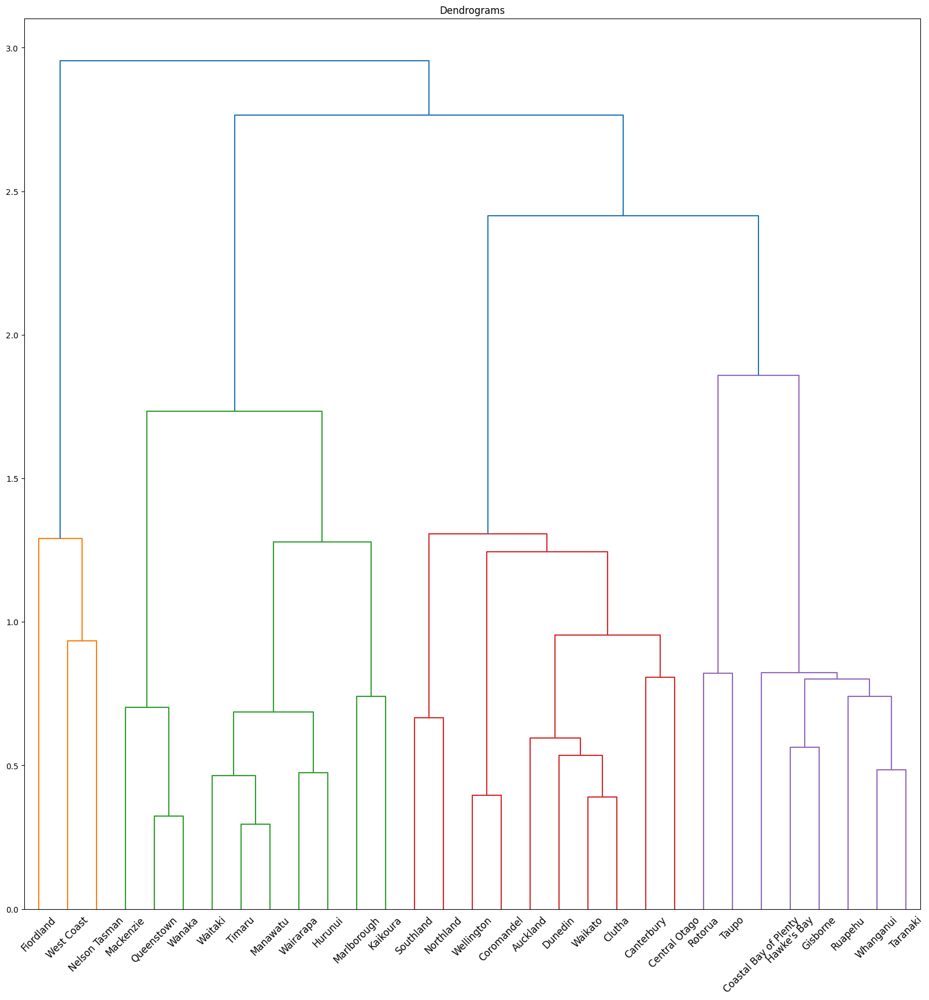

In [150]:
%matplotlib inline

plt.figure(figsize=(20, 20))  
plt.title("Dendrograms")  
linkage_data = linkage(dat_clus_init, method='ward', metric='euclidean')
dendrogram(linkage_data, leaf_font_size = 12, labels = Name)
plt.show() 

## Use Kmeans Algorithm for Clustering ---------------------


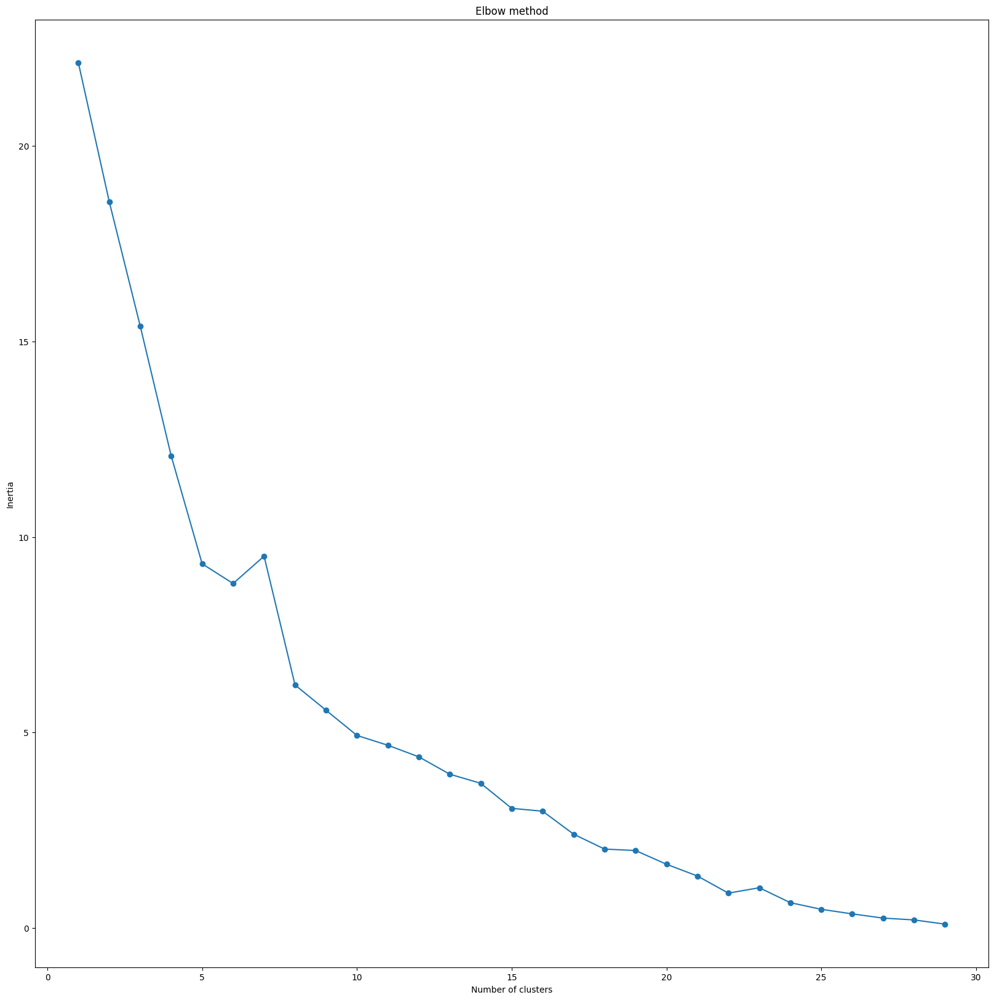

In [151]:
from sklearn.cluster import KMeans

inertias = []

for i in range(1,30):
    kmeans = KMeans(n_clusters = i, n_init = 'auto')
    kmeans.fit(dat_clus_init)
    inertias.append(kmeans.inertia_)
plt.figure(figsize = (20, 20))
plt.plot(range(1,30), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

In [165]:
kmeans = KMeans(n_clusters = 6, n_init = "auto")
kmeans.fit(dat_clus_init)

# plt.scatter(x, y, c=kmeans.labels_)
# plt.show() 


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn import decomposition
from sklearn.decomposition import PCA
from matplotlib.pyplot import figure
from matplotlib.lines import Line2D

pca = PCA(n_components = 6)
 
pca.fit(dat_clus_init)
 
pca_dat = pca.transform(dat_clus_init)

PC1 = pca_dat[:,0]
PC2 = pca_dat[:,1]
llab = kmeans.labels_


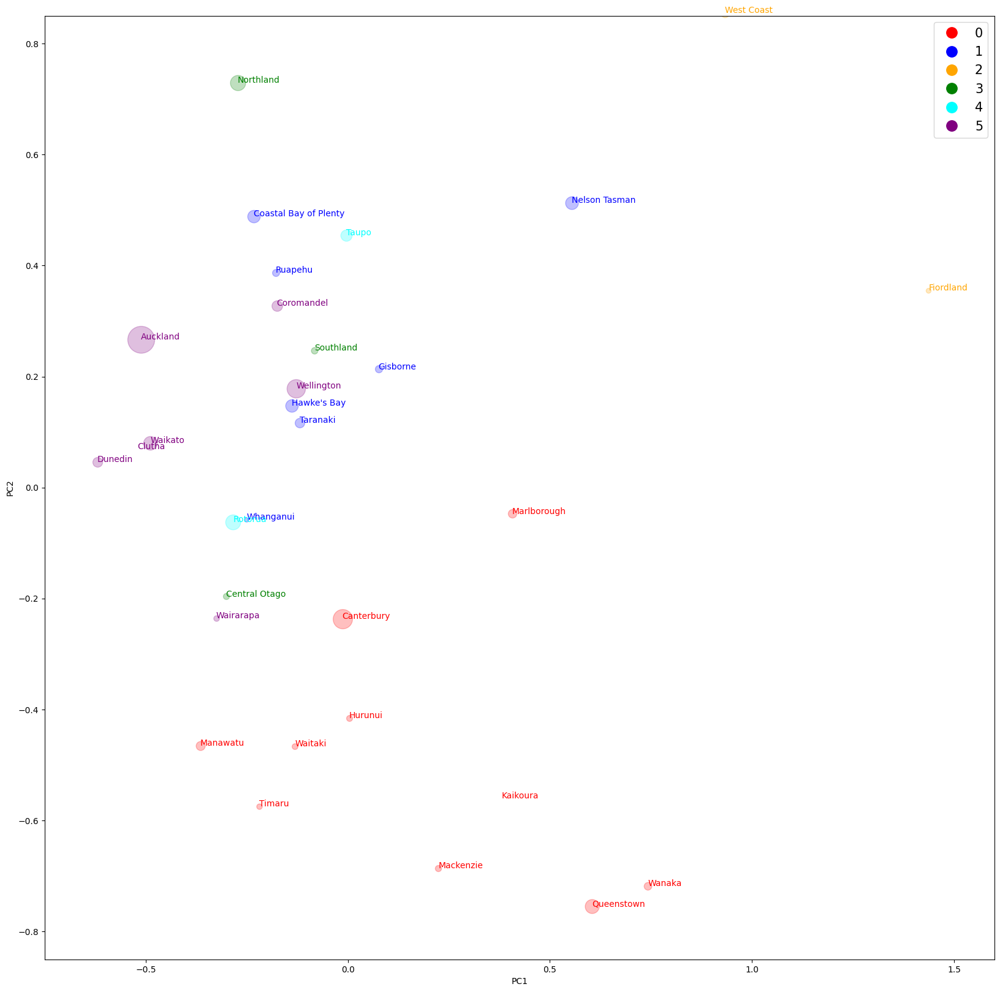

In [163]:
figure(num=None, figsize=(20, 20), dpi=100, facecolor='w', edgecolor='k')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.xlim(-0.75, 1.6)
plt.ylim(-0.85, 0.85)

region_colors = {0:'red', 1:'blue', 2:'orange',
                 3:'green', 4:'cyan',
                 5:'purple'}


for i in range(len(Name)):
    reg_color = region_colors[llab[i]]
    plt.scatter(PC1[i], PC2[i], s = 1000 * dat_clus_final['Domestic-18'][i], alpha = 0.25, color = reg_color)
    plt.text(x = PC1[i],  y = PC2[i], s = Name[i], color = reg_color)
    
custom = [ Line2D([], [], marker = '.', color = i, linestyle = 'None', markersize = 25) for i in region_colors.values()]
plt.legend(custom, region_colors.keys(), fontsize = 15)
plt.show()


In [162]:
dat_clus_final.columns

Index(['Domestic-18', 'Domestic_21', 'International_18', 'International_21',
       'Grassland', 'DistnceToCity', 'Accessibility', 'Mountain',
       'IndigenousForest', 'Water', 'ExoticForest', 'Wetland',
       'ProtectedAreas', 'CoastView', 'DistanceToAirport'],
      dtype='object')

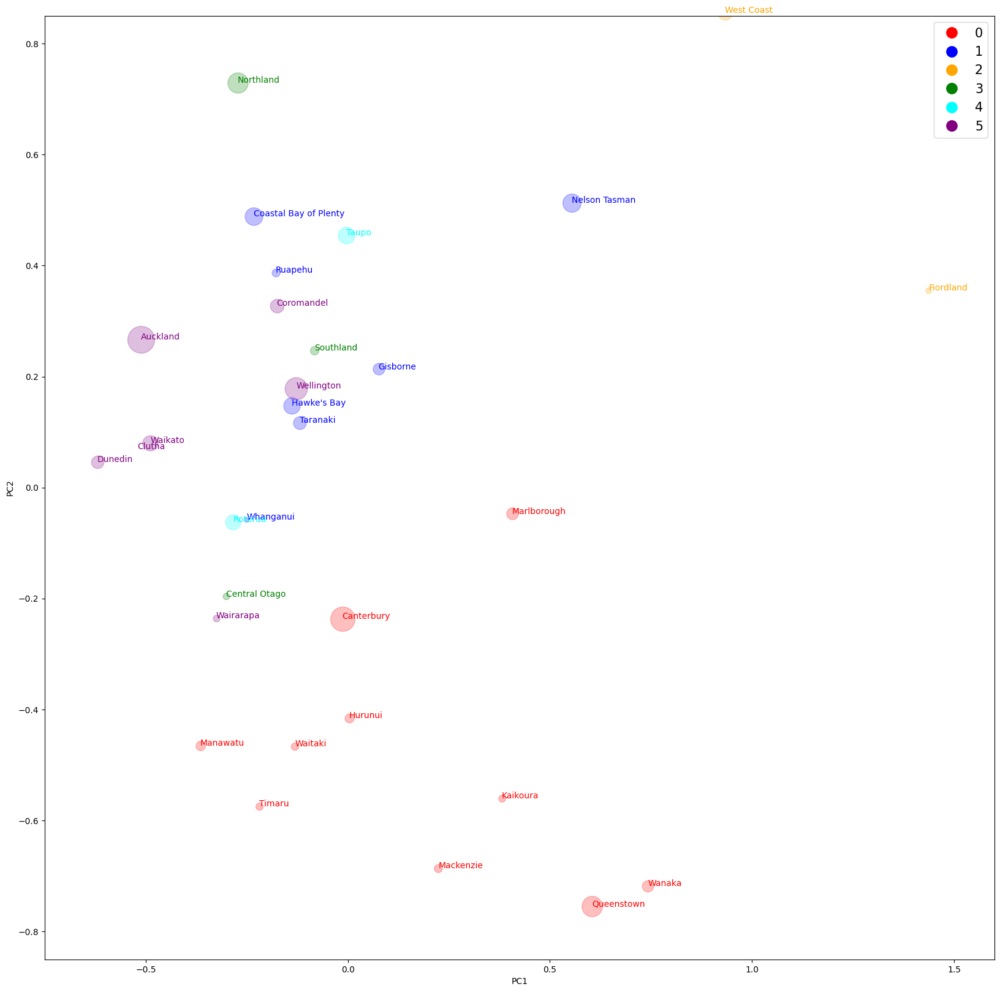

In [164]:
figure(num=None, figsize=(20, 20), dpi=100, facecolor='w', edgecolor='k')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.xlim(-0.75, 1.6)
plt.ylim(-0.85, 0.85)

region_colors = {0:'red', 1:'blue', 2:'orange',
                 3:'green', 4:'cyan',
                 5:'purple'}


for i in range(len(Name)):
    reg_color = region_colors[llab[i]]
    plt.scatter(PC1[i], PC2[i], s = 1000 * dat_clus_final['Domestic_21'][i], alpha = 0.25, color = reg_color)
    plt.text(x = PC1[i],  y = PC2[i], s = Name[i], color = reg_color)
    
custom = [ Line2D([], [], marker = '.', color = i, linestyle = 'None', markersize = 25) for i in region_colors.values()]
plt.legend(custom, region_colors.keys(), fontsize = 15)
plt.show()

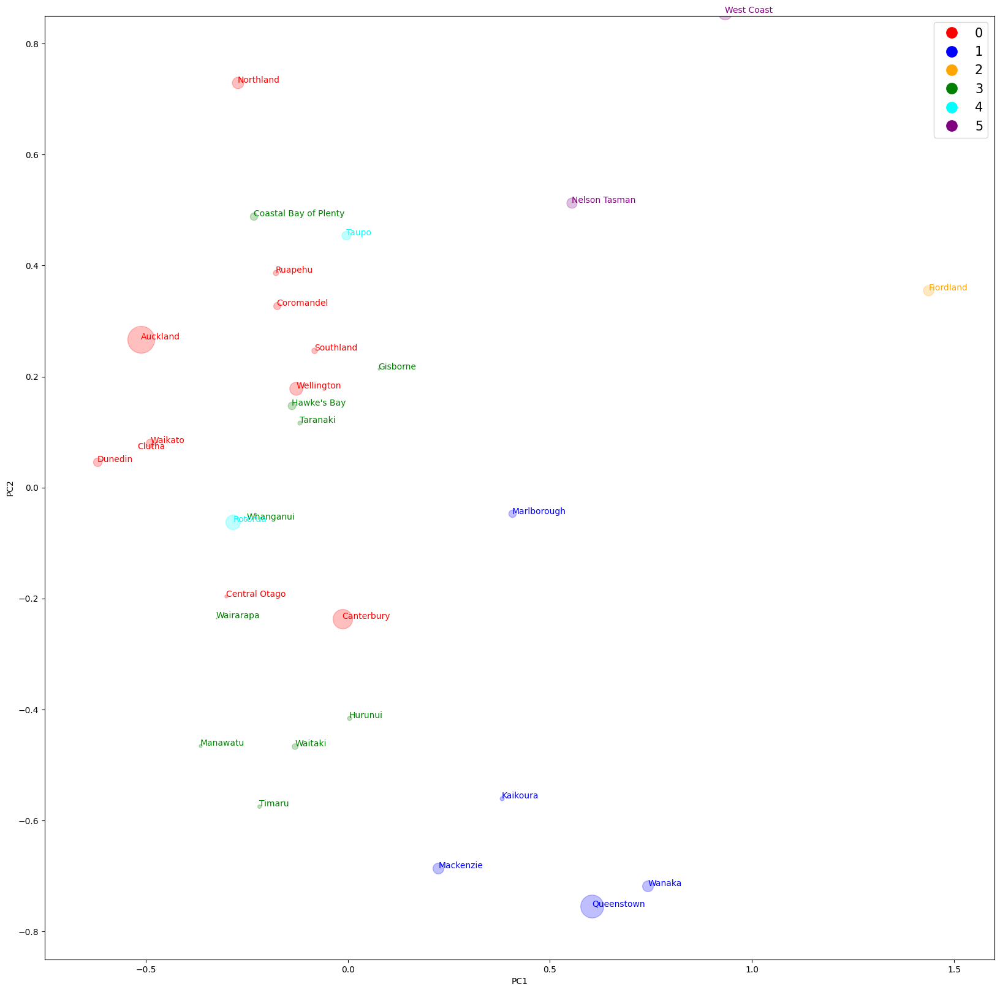

In [166]:
figure(num=None, figsize=(20, 20), dpi=100, facecolor='w', edgecolor='k')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.xlim(-0.75, 1.6)
plt.ylim(-0.85, 0.85)

region_colors = {0:'red', 1:'blue', 2:'orange',
                 3:'green', 4:'cyan',
                 5:'purple'}


for i in range(len(Name)):
    reg_color = region_colors[llab[i]]
    plt.scatter(PC1[i], PC2[i], s = 1000 * dat_clus_final['International_18'][i], alpha = 0.25, color = reg_color)
    plt.text(x = PC1[i],  y = PC2[i], s = Name[i], color = reg_color)
    
custom = [ Line2D([], [], marker = '.', color = i, linestyle = 'None', markersize = 25) for i in region_colors.values()]
plt.legend(custom, region_colors.keys(), fontsize = 15)
plt.show()

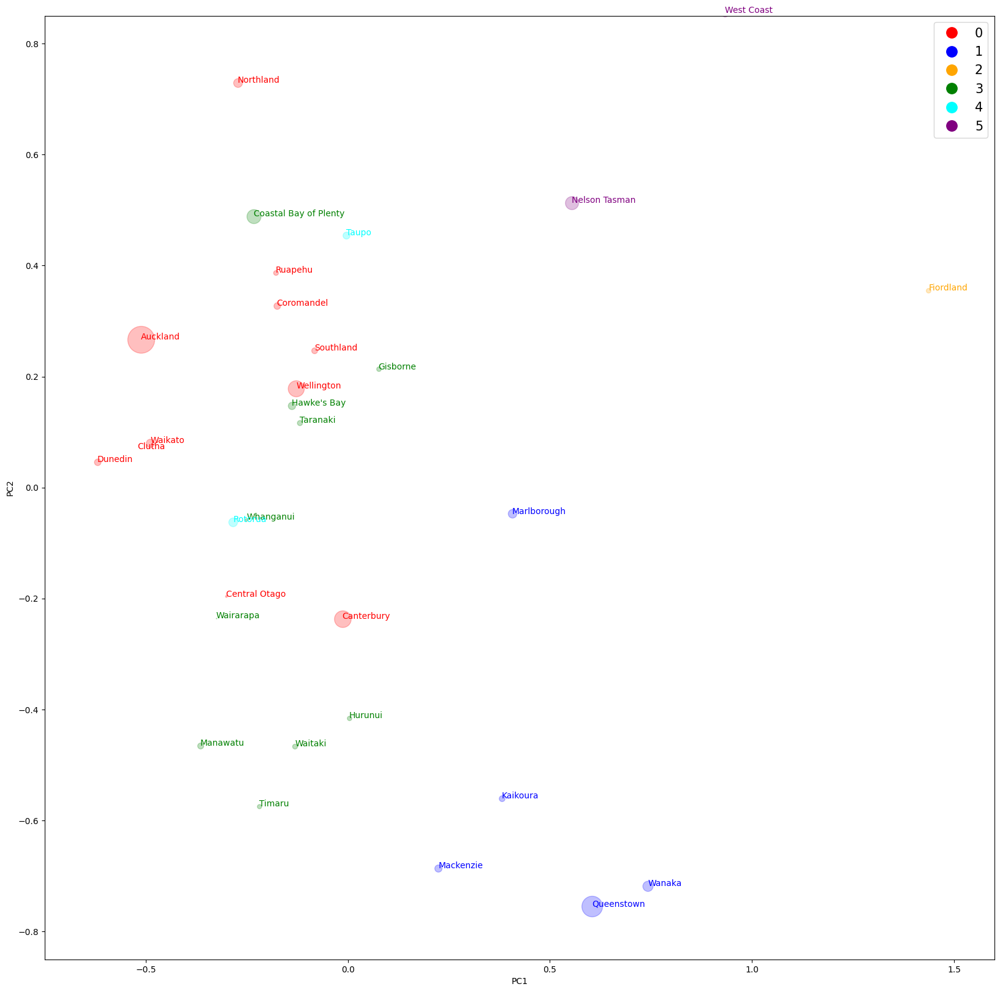

In [167]:
figure(num=None, figsize=(20, 20), dpi=100, facecolor='w', edgecolor='k')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.xlim(-0.75, 1.6)
plt.ylim(-0.85, 0.85)

region_colors = {0:'red', 1:'blue', 2:'orange',
                 3:'green', 4:'cyan',
                 5:'purple'}


for i in range(len(Name)):
    reg_color = region_colors[llab[i]]
    plt.scatter(PC1[i], PC2[i], s = 1000 * dat_clus_final['International_21'][i], alpha = 0.25, color = reg_color)
    plt.text(x = PC1[i],  y = PC2[i], s = Name[i], color = reg_color)
    
custom = [ Line2D([], [], marker = '.', color = i, linestyle = 'None', markersize = 25) for i in region_colors.values()]
plt.legend(custom, region_colors.keys(), fontsize = 15)
plt.show()

In [182]:
Group = np.array(list(map(lambda x: "Group: " + str(x), llab)))
res = dict(RTO = Name, Group = Group)
pd.DataFrame(res)


,RTO,Group
0,Queenstown,Group: 1
1,Wellington,Group: 0
2,Auckland,Group: 0
3,Canterbury,Group: 0
4,Wanaka,Group: 1
5,Central Otago,Group: 0
6,Wairarapa,Group: 3
7,Coromandel,Group: 0
8,Hurunui,Group: 3
9,Marlborough,Group: 1
